In [2]:
import glob
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import joblib

# Scientific computing and signal processing
from scipy.ndimage import gaussian_filter1d
from scipy.signal import find_peaks, savgol_filter
from scipy.spatial import ConvexHull
from scipy.stats import gaussian_kde, kurtosis, skew

# Scikit-learn: Preprocessing & Imputation
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Scikit-learn: Classification Models
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Scikit-learn: Model Evaluation & Validation
from sklearn.calibration import calibration_curve
from sklearn.inspection import permutation_importance
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
)
from sklearn.model_selection import GridSearchCV, LeaveOneOut, cross_val_predict, learning_curve
from sklearn.utils import resample

# Configurations
warnings.filterwarnings("ignore")
sns.set(style="whitegrid")

In [ ]:
os.makedirs("raw_data/BH", exist_ok=True)
os.makedirs("raw_data/NS", exist_ok=True)
os.makedirs("raw_data/CBHS",exist_ok =True)

print("Folders created")


Folders created


In [ ]:
!ls /content/raw_data/BH

'4U 1543-475day_all.csv'
'4U 1630-472. J1634-473l.csv'
'GRS 1716-249day_all.csv'
'GRS 1739-278.xlsx - J1742-277_g_lc_1day_all.csv'
'GS 1354-64day_all.csv'
'GX 339-4.csv'
'MAXI J1348-632l.csv'
'MAXI J1543-564day_all.csv'
'MAXI J1820+070.csv'
'MAXI J1910-057 day_all.csv'
 XTEJ1752-223_g_lc_1day_all.csv


In [ ]:
!ls /content/raw_data/CBHS

'bhc_EXO 1846-031.xlsx - J1849-030_g_lc_1day_all.csv'
'bhc_H 1743-322.xlsx - httpmaxi riken jpstar_dataJ1746.csv'
'bhc_MAXI J1305-704.xlsx - J1306-704_g_lc_1day_all.csv'
'bhc_MAXI J1535-571.xlsx - J1535-572_g_lc_1day_all.csv'
' bhc_MAXI J1631-479.xlsx - J1631-478_g_lc_1day_all.csv'
'bhc_MAXI J1659-152.xlsx - J1659-152_g_lc_1day_all.csv'
'bhc_MAXI J1803-298.xlsx - J1803-298_g_lc_1day_all.csv'
'bhc_MAXI J1836-194.xlsx - J1835-193_g_lc_1day_all.csv'
'bhc_MAXI J1848-015.xlsx - J1848-014_g_lc_1day_all.csv'
'bhc_Swift J1728.9-3613.xlsx - J1728-362_g_lc_1day_all.csv'
'bh_GRS 1739-278.xlsx - J1742-277_g_lc_1day_all.csv'


In [ ]:
!ls /content/raw_data/NS

'2S 1417-624.xlsx - J1421-626_g_lc_1day_all.csv'
'4U 0115+63.xlsx - J0118+637_g_lc_1day_all.csv'
'4U 1624-490.csv'
'4U 1901+03.csv'
'Aql X-1.xlsx - J1911+005_g_lc_1day_all.csv'
'EXO 1722-363.csv'
'GRO J1008-57l.csv'
'GX 304-1.xlsx - J1301-616_g_lc_1day_all.csv'
'IGR J18483-0311.xlsx - J1848-031_g_lc_1day_all.csv'
'KS 1947+300.csv'
'NGC 6440.xlsx - J1748-203_g_lc_1day_all.csv'
'RXS J180408.9-342.csv'
'SMC X-3.xlsx - J0052-724_g_lc_1day_all.csv'
'Swift J0243.6+6124.xlsx - J0243+614_g_lc_1orb_all dat.csv'
'Terzan 5.xlsx - J1748-248_g_lc_1day_all.csv'
'V 0332+53.csv'
'XTE J1543-568.xlsx - J1544-567_g_lc_1day_all.csv'
'XTE J1709-267.xlsx - J1709-266_g_lc_1day_all.csv'
'XTE J1739-285.xlsx - J1739-284_g_lc_1day_all.csv'
'XTE J1807-294.xlsx - J1806-294_g_lc_1day_all.csv'


#1st Iteration

/content/raw_data/BH/GS 1354-64day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,-0.086324,0.037539,-0.015857,0.009155,0.002378,0.018755,-0.071798,0.024783
1,55054.5,0.010660,0.015263,-0.005494,0.007863,-0.005080,0.006878,0.024050,0.009770
2,55055.5,0.006653,0.011680,0.000131,0.005230,-0.000681,0.005146,0.007166,0.007743
3,55056.5,0.002144,0.009035,0.000989,0.004044,-0.000348,0.004166,0.001570,0.005645
4,55057.5,-0.008907,0.006295,-0.004023,0.002551,-0.000517,0.002741,-0.005160,0.004196
...,...,...,...,...,...,...,...,...,...
4468,59775.5,0.003601,0.012195,0.001889,0.005282,0.001884,0.005202,0.000375,0.007576
4469,59776.5,0.013117,0.015980,0.016036,0.008343,0.013366,0.006869,-0.014685,0.009366
4470,59798.5,0.096849,0.060714,-0.002156,0.030462,0.014548,0.022528,0.066335,0.043034
4471,59799.5,0.077023,0.022451,0.009908,0.008440,0.025931,0.009761,0.031190,0.015455


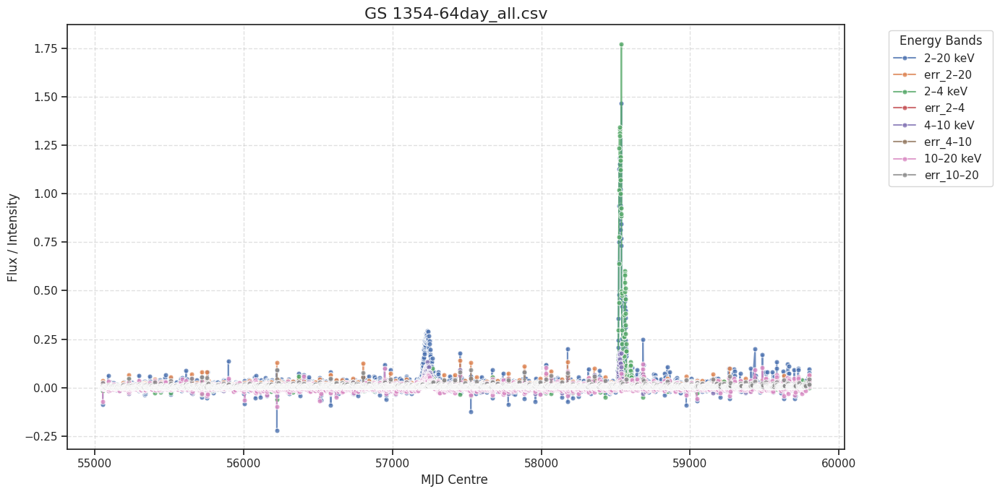

/content/raw_data/BH/GRS 1739-278.xlsx - J1742-277_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.075477,0.017995,0.026422,0.011853,0.029034,0.008921,0.014234,0.008434
1,55055.5,0.079586,0.016199,0.015169,0.010298,0.040509,0.008369,0.009930,0.007200
2,55056.5,0.076912,0.009050,0.031538,0.006010,0.034644,0.004499,0.006505,0.004311
3,55057.5,0.091311,0.007771,0.030859,0.004746,0.041847,0.003925,0.008894,0.003804
4,55058.5,0.079404,0.007869,0.032264,0.004999,0.037033,0.003913,0.003030,0.003841
...,...,...,...,...,...,...,...,...,...
4192,60081.5,0.039145,0.008807,0.021405,0.006247,0.019530,0.004279,-0.003113,0.004245
4193,60082.5,0.020057,0.012858,0.018558,0.009088,0.005975,0.005897,-0.001805,0.006922
4194,60083.5,0.042253,0.007562,0.014162,0.004772,0.013336,0.003594,0.012357,0.004028
4195,60084.5,0.035362,0.008014,0.016735,0.005231,0.013222,0.003921,0.004145,0.003996


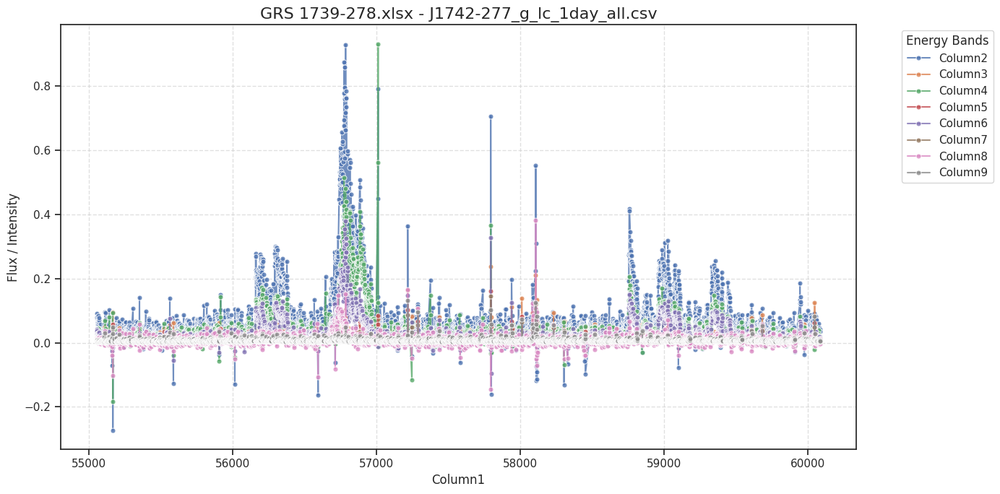

/content/raw_data/BH/MAXI J1543-564day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,-0.063254,0.045927,0.023477,0.024668,0.002166,0.023376,-0.078955,0.024580
1,55054.5,0.020716,0.015753,0.017673,0.008908,0.008599,0.006901,-0.001995,0.009535
2,55055.5,0.014576,0.011122,0.011634,0.005864,-0.002905,0.004784,0.008761,0.006873
3,55056.5,-0.001941,0.008684,-0.002062,0.003975,-0.000713,0.004042,0.000757,0.005338
4,55057.5,0.013985,0.006257,0.007170,0.002829,0.006511,0.002718,0.000283,0.004087
...,...,...,...,...,...,...,...,...,...
4294,59795.5,0.017854,0.014417,0.012365,0.008431,0.004929,0.006132,0.002451,0.009097
4295,59796.5,0.015572,0.013216,-0.002799,0.005676,0.008978,0.005806,0.004738,0.008906
4296,59798.5,0.022158,0.008082,0.008673,0.003977,0.010842,0.003535,0.000356,0.005051
4297,59799.5,0.015653,0.008647,-0.003045,0.003596,0.007220,0.003537,0.007699,0.005872


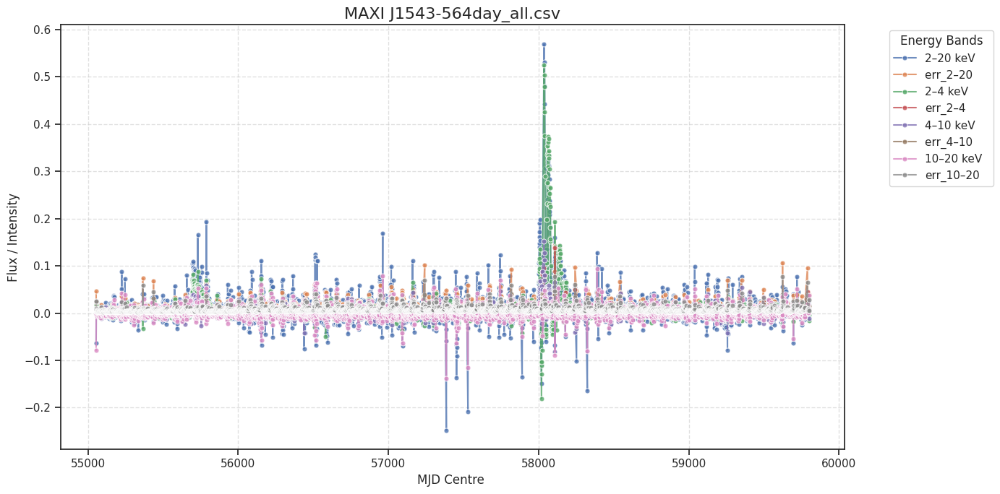

/content/raw_data/BH/4U 1543-475day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,-0.071266,0.107127,0.020101,0.047091,-0.022002,0.045660,-0.048884,0.069322
1,55054.5,-0.003167,0.045505,0.009598,0.020173,0.001366,0.019411,-0.008107,0.028863
2,55055.5,-0.038029,0.033337,-0.007814,0.014817,-0.016409,0.014426,-0.004753,0.020785
3,55056.5,-0.028869,0.017824,-0.001252,0.008036,-0.005992,0.008095,-0.015922,0.011034
4,55057.5,-0.012807,0.012985,-0.005128,0.005238,-0.002438,0.005547,-0.005090,0.008773
...,...,...,...,...,...,...,...,...,...
3731,59795.5,0.038389,0.020899,0.005501,0.010313,0.017376,0.008986,0.008956,0.013750
3732,59796.5,-0.011462,0.021039,-0.007113,0.009538,-0.013518,0.008852,0.010482,0.014519
3733,59798.5,0.006908,0.015530,0.001941,0.007061,-0.000410,0.006743,0.005885,0.010506
3734,59799.5,-0.022970,0.037319,-0.018528,0.015252,0.017655,0.015734,-0.030105,0.024707


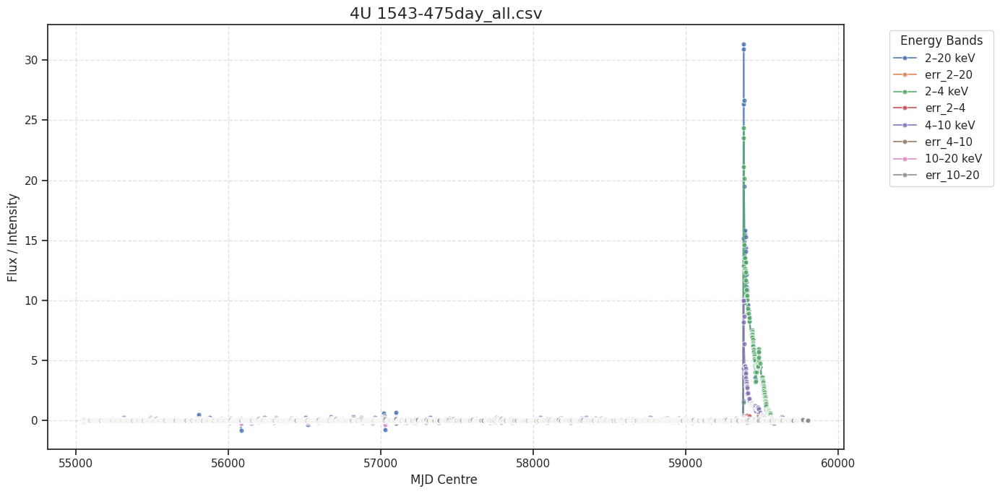

/content/raw_data/BH/MAXI J1820+070.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,0.015691,0.018046,0.005932,0.008802,0.010197,0.008213,-0.003509,0.010895
1,55055.5,0.021194,0.012619,0.002283,0.005569,0.009981,0.005417,0.005314,0.008123
2,55056.5,0.012065,0.010306,0.002091,0.004729,0.000513,0.004202,0.009753,0.006792
3,55057.5,-0.004541,0.010032,0.001947,0.004568,-0.001589,0.004185,-0.003469,0.006499
4,55058.5,0.019779,0.011080,-0.003914,0.004331,0.003672,0.004667,0.015041,0.007324
...,...,...,...,...,...,...,...,...,...
3865,59792.5,0.020579,0.011070,0.008911,0.005264,0.000295,0.004796,0.011849,0.007124
3866,59793.5,0.000764,0.011582,0.004221,0.005613,-0.004754,0.004993,0.003662,0.007449
3867,59794.5,0.037839,0.029899,-0.009905,0.009294,0.011002,0.012141,0.028621,0.021747
3868,59795.5,0.028141,0.017608,0.000214,0.007505,0.010524,0.007572,0.012621,0.012100


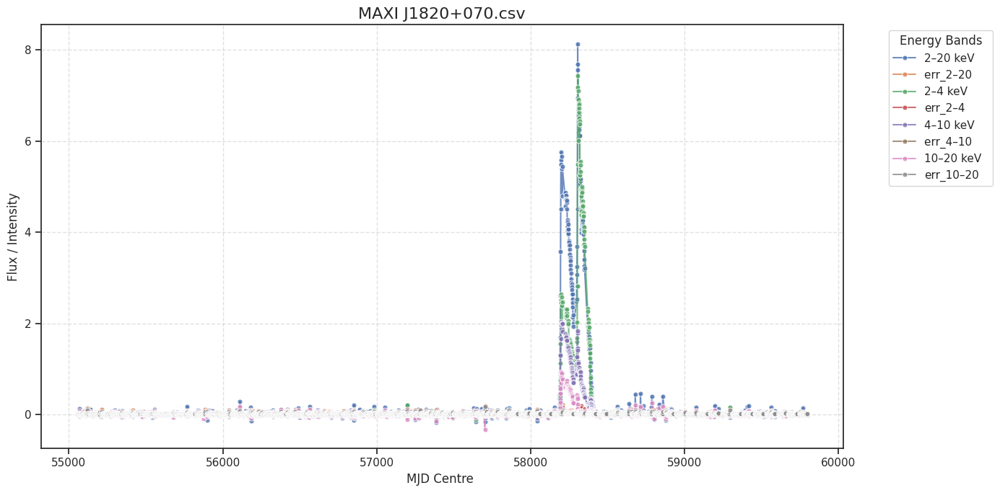

/content/raw_data/BH/4U 1630-472. J1634-473l.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,0.062176,0.082827,0.137713,0.062243,-0.039050,0.029152,0.010292,0.047868
1,55054.5,0.242501,0.028736,0.048892,0.014317,0.063642,0.012714,0.099294,0.016759
2,55055.5,0.196595,0.035787,0.046728,0.017437,0.070377,0.016325,0.053381,0.020766
3,55056.5,0.106991,0.026833,0.016135,0.013266,0.038987,0.012389,0.041245,0.016983
4,55057.5,0.020716,0.051532,0.011446,0.025095,0.023545,0.024064,-0.018979,0.032283
...,...,...,...,...,...,...,...,...,...
3727,59795.5,0.472824,0.028040,0.278621,0.022746,0.192214,0.014887,0.000710,0.008152
3728,59796.5,0.548078,0.032007,0.321379,0.026027,0.204013,0.016361,0.022759,0.010592
3729,59798.5,0.624301,0.018934,0.308390,0.014183,0.273236,0.010126,0.022737,0.006597
3730,59799.5,0.609006,0.017870,0.299375,0.013372,0.251310,0.009293,0.038163,0.006585


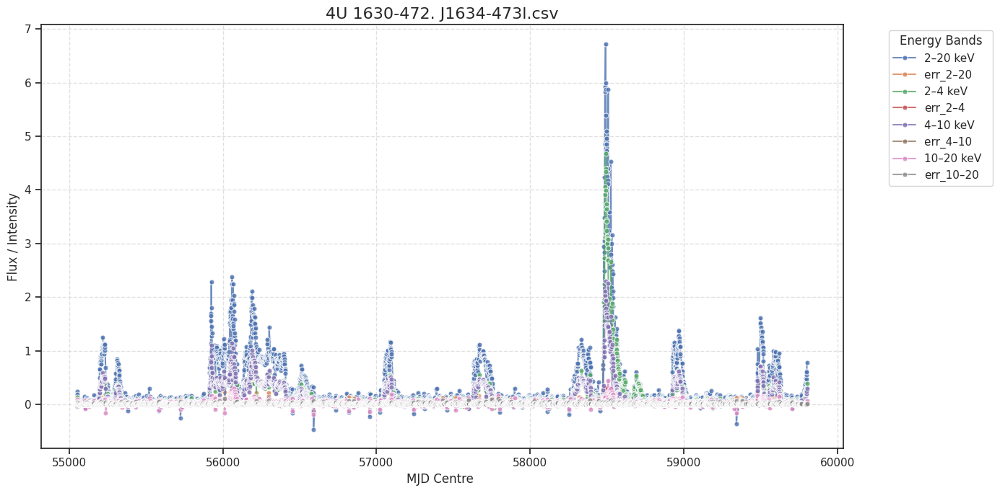

/content/raw_data/BH/MAXI J1910-057 day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,0.011304,0.010227,0.001602,0.004272,0.004142,0.004504,0.003707,0.006708
1,55055.5,-0.002757,0.008340,0.000770,0.004276,0.000199,0.003552,-0.003704,0.005310
2,55056.5,0.014771,0.009667,-0.000456,0.004229,-0.002796,0.004060,0.017144,0.006467
3,55057.5,0.005703,0.009573,-0.003018,0.004157,0.001050,0.003945,0.007547,0.006551
4,55058.5,-0.004132,0.010612,-0.002940,0.004740,0.001220,0.004343,-0.002632,0.007187
...,...,...,...,...,...,...,...,...,...
4178,59728.5,0.020380,0.015854,0.003782,0.007238,0.003829,0.006969,0.009874,0.010037
4179,59729.5,0.070370,0.017151,0.003422,0.006993,0.009927,0.006874,0.047052,0.011452
4180,59730.5,0.016156,0.016574,0.002086,0.006188,-0.001631,0.006524,0.014139,0.010834
4181,59731.5,0.003648,0.015773,-0.003675,0.005488,0.000469,0.006144,0.003814,0.010134


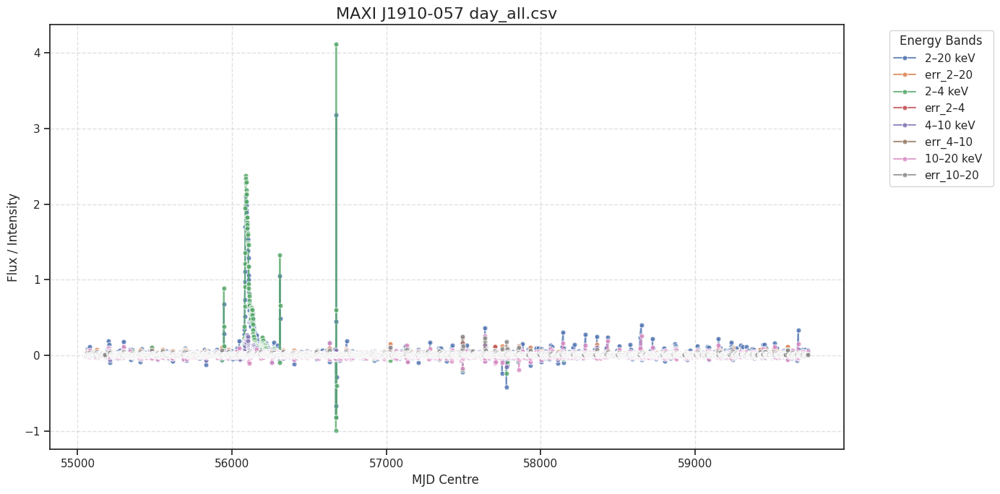

/content/raw_data/BH/XTEJ1752-223_g_lc_1day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,0.026804,0.012689,0.017214,0.007760,0.012577,0.005857,-0.004308,0.006928
1,55055.5,0.026639,0.010596,0.010131,0.006463,0.010213,0.004675,0.005084,0.006131
2,55056.5,0.047082,0.008330,0.018416,0.004547,0.012181,0.003598,0.014710,0.005082
3,55057.5,0.022990,0.006953,0.014846,0.003783,0.011282,0.003131,-0.003304,0.004078
4,55058.5,0.039602,0.007714,0.015626,0.003904,0.012587,0.003392,0.009738,0.004726
...,...,...,...,...,...,...,...,...,...
4380,60081.5,0.020428,0.010760,0.009372,0.005907,0.002622,0.004590,0.008058,0.006884
4381,60082.5,0.056118,0.007538,0.021289,0.004331,0.015839,0.003322,0.016691,0.004507
4382,60083.5,0.015970,0.007122,0.007439,0.004024,0.009220,0.003304,-0.001397,0.004123
4383,60084.5,0.006128,0.007337,0.004027,0.004026,0.004143,0.003315,-0.002981,0.004383


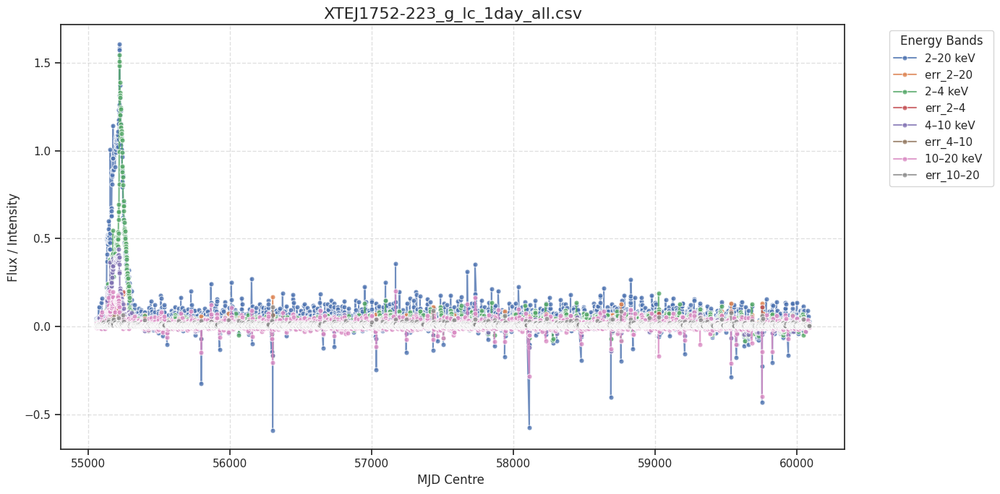

/content/raw_data/BH/GRS 1716-249day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,-0.008294,0.021958,0.018789,0.011737,-0.019162,0.009899,0.002984,0.012774
1,55055.5,-0.036934,0.018978,-0.023302,0.009814,-0.008954,0.008125,-0.007117,0.011702
2,55056.5,-0.040717,0.011971,-0.025431,0.005951,-0.012426,0.005423,-0.004275,0.007268
3,55057.5,-0.005660,0.010445,-0.002675,0.004658,-0.003392,0.004555,0.001776,0.006716
4,55058.5,-0.003599,0.010749,-0.013383,0.004773,-0.001275,0.004737,0.005774,0.006831
...,...,...,...,...,...,...,...,...,...
4339,60081.5,-0.010434,0.011040,-0.001558,0.006123,-0.008750,0.004735,0.001434,0.007122
4340,60082.5,0.023800,0.013805,0.004066,0.007076,0.006424,0.005887,0.011342,0.009189
4341,60083.5,-0.018270,0.016545,-0.017283,0.007679,0.004773,0.007469,-0.009883,0.010885
4342,60084.5,-0.002409,0.010955,0.008625,0.005605,-0.004892,0.004680,-0.002540,0.006976


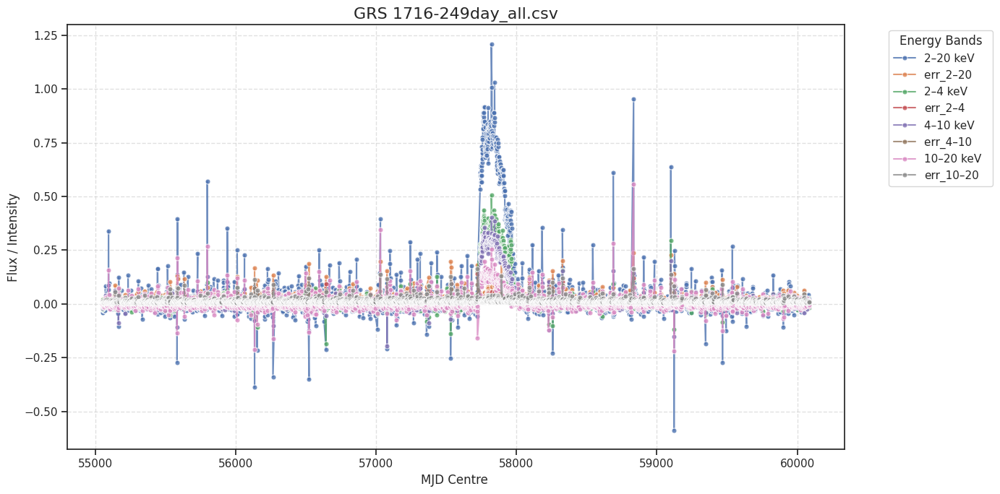

/content/raw_data/BH/MAXI J1348-632l.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,0.061545,0.057518,0.015552,0.028271,0.006717,0.027759,0.046424,0.036048
1,55054.5,-0.019774,0.017675,-0.008638,0.008394,-0.007883,0.008468,-0.002523,0.010984
2,55055.5,0.001873,0.016089,-0.002344,0.007705,-0.002114,0.007440,0.003872,0.010109
3,55056.5,0.013232,0.011539,0.006608,0.005613,0.011736,0.005368,-0.006597,0.007016
4,55057.5,0.013270,0.007921,0.009474,0.003555,0.004372,0.003454,0.000478,0.005181
...,...,...,...,...,...,...,...,...,...
4470,59777.5,0.088924,0.067460,0.032380,0.035812,0.016111,0.026803,0.036024,0.041233
4471,59780.5,0.030965,0.025794,0.003261,0.012905,0.002957,0.010402,0.019604,0.015873
4472,59798.5,0.066544,0.029224,0.008462,0.013414,0.021793,0.013191,0.030278,0.018879
4473,59799.5,0.146348,0.026755,0.029233,0.012845,0.032169,0.011560,0.073015,0.017545


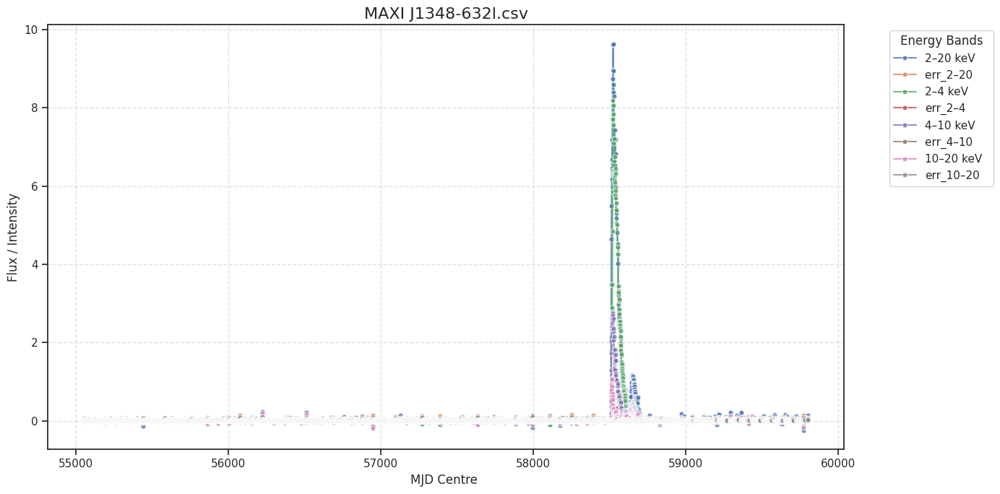

/content/raw_data/BH/GX 339-4.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,0.024259,0.108192,0.005177,0.050626,0.033184,0.048575,-0.007096,0.065475
1,55054.5,0.200702,0.043437,0.058191,0.020291,0.044457,0.018733,0.084584,0.026587
2,55056.5,-0.103874,0.053875,-0.008679,0.028273,-0.040183,0.015188,-0.039292,0.041559
3,55057.5,-0.053517,0.035560,-0.012891,0.015991,-0.025326,0.014797,-0.005353,0.024943
4,55058.5,0.012615,0.012149,0.004112,0.005051,0.006095,0.005234,0.000397,0.008429
...,...,...,...,...,...,...,...,...,...
3935,59728.5,0.010906,0.010449,-0.001159,0.004232,0.004552,0.004332,0.004854,0.006795
3936,59729.5,0.021520,0.010125,-0.005757,0.004065,0.001878,0.004033,0.019689,0.006738
3937,59730.5,-0.005625,0.010444,-0.006446,0.004019,-0.003615,0.004132,0.003070,0.006954
3938,59731.5,-0.004882,0.010282,0.002955,0.004371,0.000484,0.004219,-0.007243,0.006616


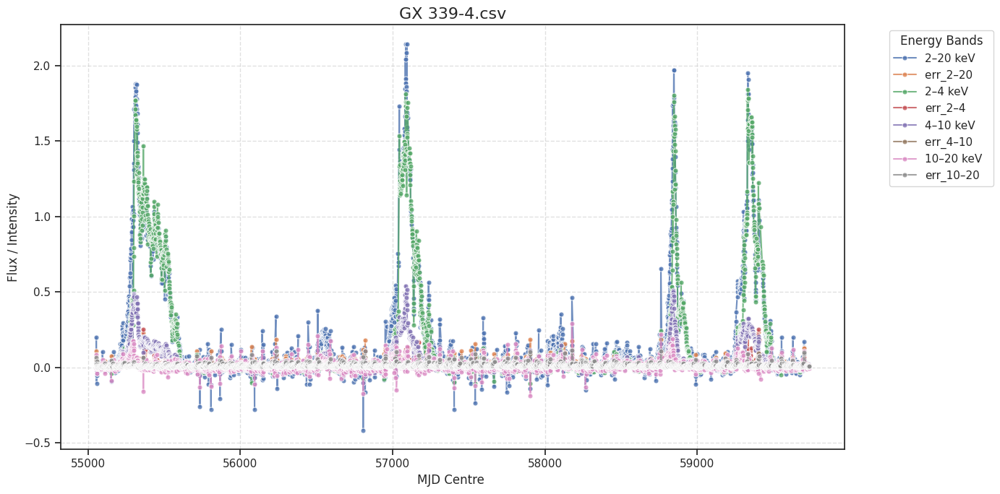

In [ ]:
import pandas as pd
from glob import glob
from IPython.display import display

def plot_multi_series(df, x_col, y_cols, title="Multi-Energy Light Curve"):
    """
    Plots multiple energy bands on a single chart with markers and lines.

    Parameters:
    - df: The pandas DataFrame.
    - x_col: The column for the x-axis (e.g., 'MJD Centre' or 'Column1').
    - y_cols: A list of columns to plot on the y-axis (e.g., ['2–20 keV', '2–4 keV']).
    - title: The title of the plot.
    """
    # Set the visual style
    sns.set_theme(style="ticks")
    plt.figure(figsize=(14, 7))

    # Loop through each column and plot
    # lineplot with markers creates the "multi-line scatter" effect
    for col in y_cols:
        sns.lineplot(
            data=df,
            x=x_col,
            y=col,
            label=col,
            marker='o',      # Add scatter points
            markersize=5,
            linewidth=1.5,   # Line thickness
            alpha=0.8
        )

    plt.title(title, fontsize=16)
    plt.xlabel(x_col, fontsize=12)
    plt.ylabel("Flux / Intensity", fontsize=12)

    # Move legend outside the plot for better visibility
    plt.legend(title="Energy Bands", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()

    # If running in a script, use plt.savefig('plot.png')
    # If in a notebook, use plt.show()
    plt.show()

for fpath in glob("/content/raw_data/BH/*.csv"):
  print(fpath)
  df = pd.read_csv(fpath)
  cols = df.columns
  display(df)

  plot_multi_series(df, x_col=cols[0], y_cols=cols[1:], title=fpath.split("/")[-1])


/content/raw_data/NS/KS 1947+300.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55057.5,-0.020351,0.024108,-0.011968,0.008037,-0.002346,0.008973,-0.008572,0.016122
1,55058.5,0.010797,0.023617,-0.009385,0.007868,0.004233,0.009045,0.008619,0.015959
2,55059.5,0.022179,0.024292,0.016001,0.009207,-0.000352,0.009433,0.010554,0.016445
3,55060.5,-0.030920,0.023916,-0.003869,0.008119,-0.019002,0.008968,-0.000971,0.016937
4,55061.5,0.036770,0.024690,0.015022,0.008941,-0.004809,0.009450,0.027397,0.017376
...,...,...,...,...,...,...,...,...,...
3396,60081.5,-0.005284,0.012116,0.005070,0.005950,0.000390,0.005230,-0.006864,0.007885
3397,60082.5,0.022622,0.012664,0.013877,0.006883,0.005870,0.005745,0.003371,0.007566
3398,60083.5,-0.002800,0.011624,-0.003654,0.004979,0.006332,0.005567,-0.008440,0.006983
3399,60084.5,0.023418,0.013247,0.000761,0.005754,0.011955,0.005998,0.006654,0.008250


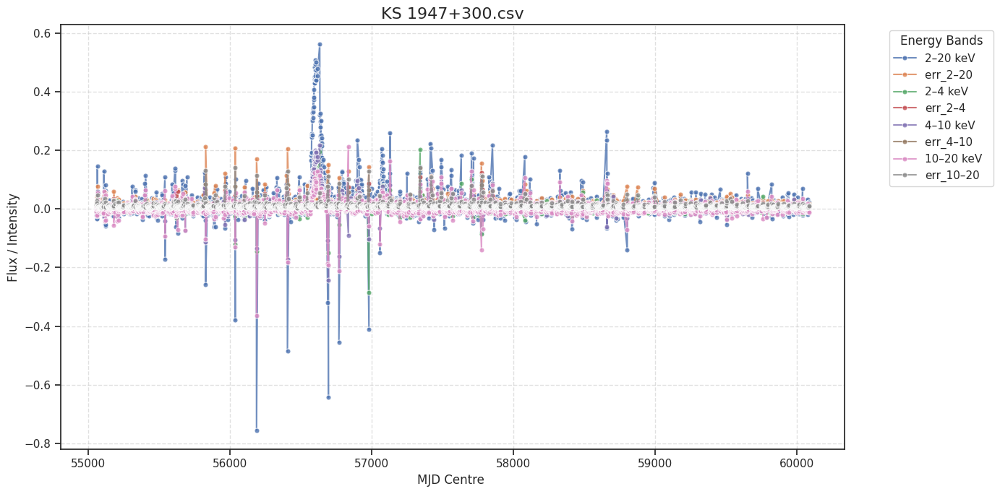

/content/raw_data/NS/Aql X-1.xlsx - J1911+005_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,-0.005393,0.011553,-0.005489,0.004819,0.007228,0.005343,-0.009690,0.007206
1,55055.5,0.009185,0.009865,0.003246,0.004529,0.006698,0.004414,-0.002797,0.006171
2,55056.5,0.032594,0.010531,0.005729,0.005198,0.005062,0.004461,0.018566,0.006757
3,55057.5,0.005151,0.011517,0.010051,0.005381,-0.001552,0.004856,-0.000183,0.007533
4,55058.5,-0.016365,0.012206,-0.002046,0.005467,-0.001150,0.005176,-0.011902,0.008031
...,...,...,...,...,...,...,...,...,...
4020,59727.5,0.200354,0.022683,0.137524,0.016640,0.070305,0.010440,0.000939,0.010964
4021,59728.5,0.267197,0.025787,0.202698,0.019524,0.094540,0.011947,-0.010153,0.011666
4022,59729.5,0.401344,0.032632,0.281696,0.024089,0.148410,0.015293,-0.005063,0.014749
4023,59730.5,0.523760,0.043959,0.362391,0.033168,0.157871,0.019008,0.047440,0.021338


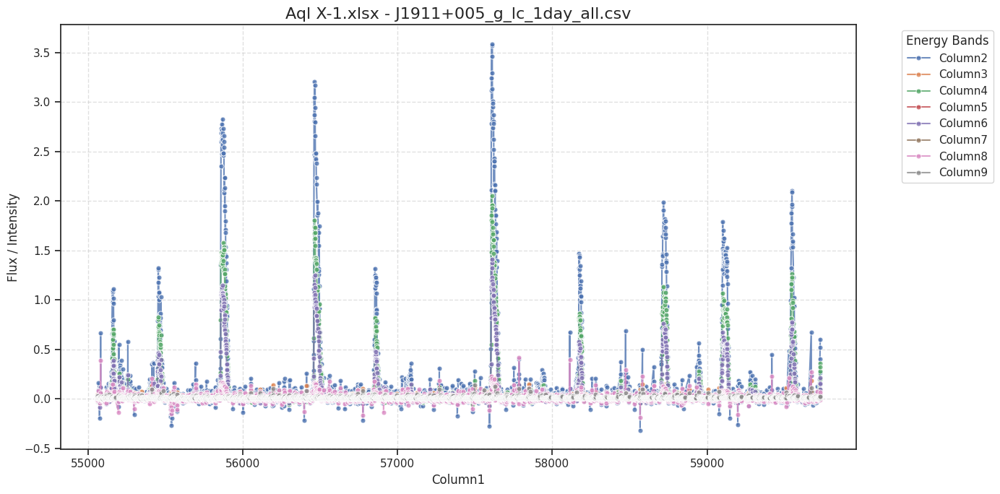

/content/raw_data/NS/RXS J180408.9-342.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,0.000834,0.017061,0.000240,0.008282,-0.001597,0.007016,0.002467,0.010647
1,55055.5,-0.023415,0.013452,-0.012574,0.006835,-0.007210,0.005578,-0.004822,0.008333
2,55056.5,-0.009900,0.008485,0.001798,0.004293,-0.003787,0.003646,-0.005910,0.005363
3,55057.5,-0.008389,0.007239,-0.002360,0.003280,-0.005990,0.003029,0.002327,0.004840
4,55058.5,0.000629,0.007753,0.005520,0.003584,0.001857,0.003383,-0.004590,0.005021
...,...,...,...,...,...,...,...,...,...
4162,60081.5,0.053751,0.013023,0.029938,0.008152,0.013307,0.005819,0.010964,0.007664
4163,60082.5,0.042808,0.013273,0.021785,0.007525,0.010984,0.005656,0.010961,0.008326
4164,60083.5,0.012307,0.009262,0.012041,0.005521,0.006024,0.004086,-0.004616,0.005430
4165,60084.5,0.028782,0.009284,0.014676,0.005536,0.008163,0.004106,0.006484,0.005495


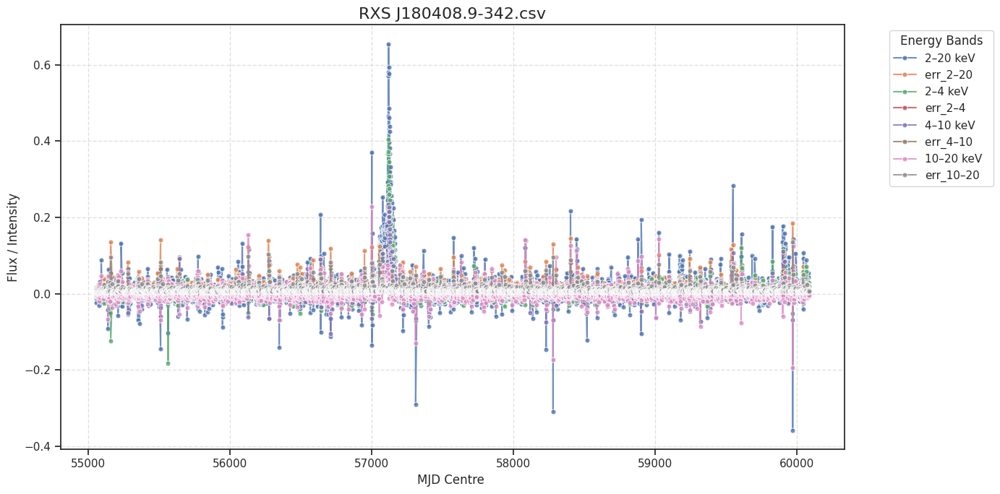

/content/raw_data/NS/XTE J1543-568.xlsx - J1544-567_g_lc_1day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,-0.022568,0.051313,0.017174,0.031831,0.006600,0.020738,-0.043890,0.031949
1,55054.5,0.027464,0.017286,0.017397,0.009294,-0.000323,0.007453,0.014882,0.010759
2,55055.5,0.005110,0.011534,0.012447,0.006225,-0.003893,0.004957,0.001244,0.007078
3,55056.5,0.015942,0.009481,-0.003493,0.004392,0.006538,0.004412,0.008327,0.005810
4,55057.5,0.014070,0.006653,0.004240,0.002909,0.005153,0.002877,0.004330,0.004391
...,...,...,...,...,...,...,...,...,...
4530,60078.5,-0.034746,0.036354,0.032362,0.017945,-0.025990,0.013405,-0.018941,0.024201
4531,60079.5,0.019369,0.020634,-0.005032,0.009177,-0.003267,0.008412,0.023024,0.013500
4532,60080.5,0.014131,0.016878,-0.000178,0.007871,0.011262,0.007539,-0.001179,0.010400
4533,60081.5,-0.005716,0.014805,-0.003603,0.006472,0.006615,0.006443,-0.010434,0.009586


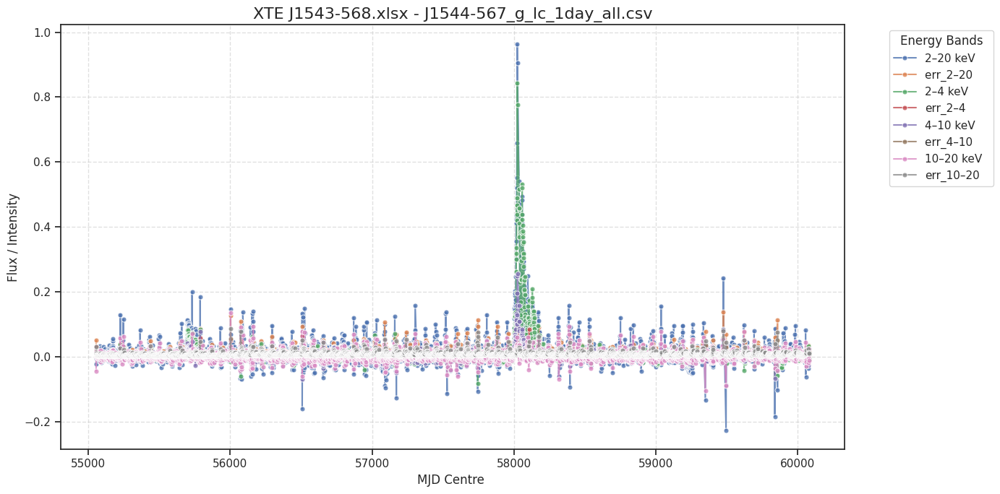

/content/raw_data/NS/Swift J0243.6+6124.xlsx - J0243+614_g_lc_1orb_all dat.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.40625,0.093981,0.058449,0.003445,0.028137,0.032889,0.027775,0.040261,0.034001
1,55055.15625,0.225293,0.169102,0.020858,0.049446,0.006718,0.064265,0.162876,0.124304
2,55055.34375,0.042893,0.060247,0.016812,0.016812,0.044851,0.034075,-0.028019,0.030659
3,55055.40625,0.269014,0.077260,0.033607,0.023764,0.069464,0.038299,0.129162,0.046490
4,55055.53125,0.032379,0.060175,0.011750,0.028628,-0.002037,0.026070,0.023222,0.037694
...,...,...,...,...,...,...,...,...,...
44812,59700.96875,0.044495,0.092591,-0.005302,0.022507,0.051097,0.032966,-0.016157,0.060838
44813,59701.03125,-0.152685,0.094493,-0.004878,0.034758,0.022111,0.035653,-0.137712,0.059152
44814,59701.09375,0.254125,0.106589,0.029245,0.034678,0.016360,0.035958,0.179300,0.071157
44815,59701.15625,-0.106416,0.106951,0.004723,0.030244,0.016682,0.040686,-0.112175,0.068717


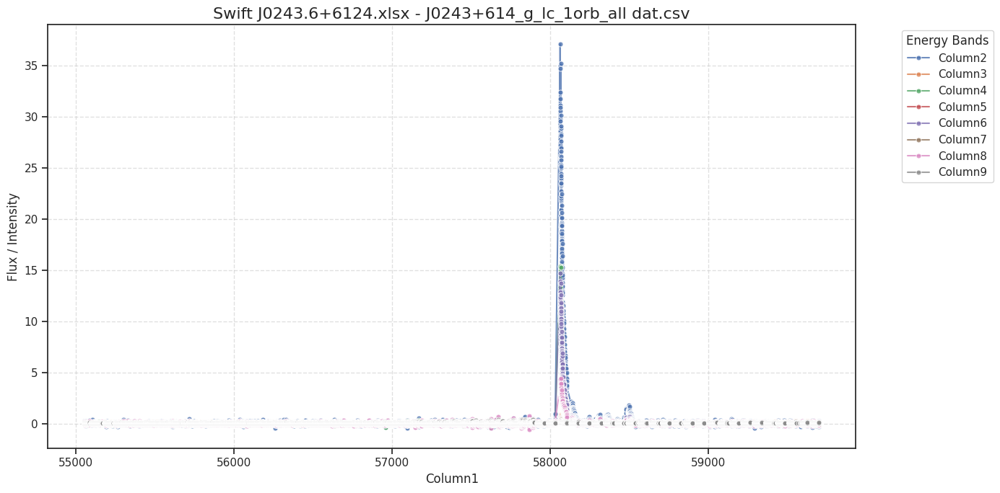

/content/raw_data/NS/XTE J1739-285.xlsx - J1739-284_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.049041,0.017466,0.006025,0.010107,0.019666,0.008560,0.013558,0.008938
1,55055.5,0.051107,0.015200,0.005593,0.009760,0.029206,0.007663,0.004879,0.006998
2,55056.5,0.035911,0.008979,0.013487,0.005653,0.017665,0.004244,0.001751,0.004768
3,55057.5,0.050777,0.007490,0.019818,0.004226,0.024311,0.003616,0.001783,0.004092
4,55058.5,0.051489,0.007756,0.012445,0.004382,0.026931,0.003735,0.003958,0.004252
...,...,...,...,...,...,...,...,...,...
4207,60081.5,0.041981,0.009373,0.026208,0.006558,0.014916,0.004403,0.002348,0.004832
4208,60082.5,0.039263,0.017441,0.022092,0.011482,0.013072,0.007973,0.004952,0.009820
4209,60083.5,0.021354,0.008288,0.007050,0.005146,0.011605,0.003935,0.000374,0.004509
4210,60084.5,0.030317,0.008735,0.016751,0.005681,0.010356,0.004277,0.003127,0.004337


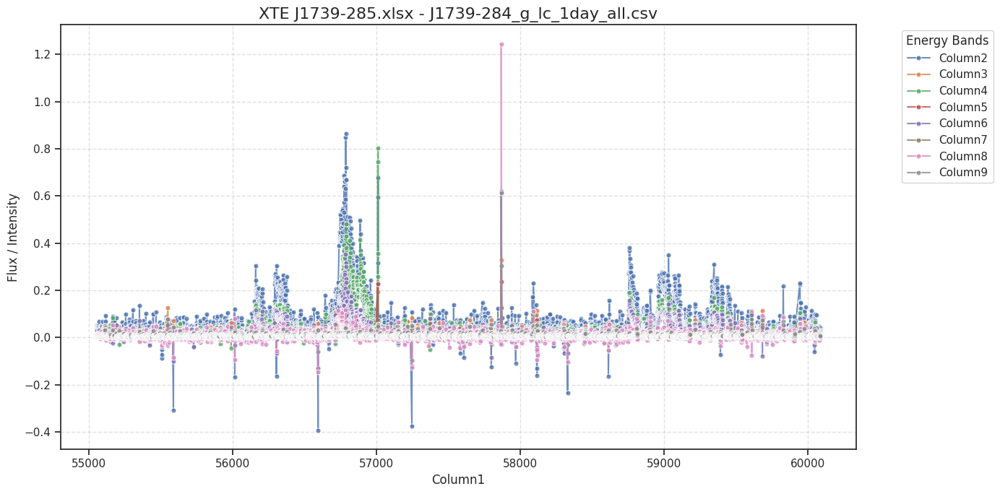

/content/raw_data/NS/XTE J1709-267.xlsx - J1709-266_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.001431,0.019260,-0.010998,0.007285,0.002854,0.008596,0.002451,0.012106
1,55055.5,0.035445,0.017082,0.003681,0.008040,0.007053,0.007171,0.019025,0.010869
2,55056.5,-0.007014,0.009975,0.001514,0.004943,-0.004133,0.004451,-0.002688,0.006134
3,55057.5,0.017727,0.007859,0.002848,0.003383,0.007522,0.003451,0.004744,0.005086
4,55058.5,0.010569,0.007753,0.000825,0.003401,0.005546,0.003386,0.001315,0.004989
...,...,...,...,...,...,...,...,...,...
4297,60081.5,0.009046,0.008427,-0.001722,0.004006,-0.000418,0.003648,0.010020,0.005638
4298,60082.5,-0.006577,0.008288,0.002604,0.003943,0.001603,0.003879,-0.009741,0.005288
4299,60083.5,0.013657,0.012273,0.015136,0.006626,0.000432,0.005308,0.000726,0.007934
4300,60084.5,-0.000188,0.009381,-0.002896,0.004199,-0.005050,0.003758,0.007088,0.006521


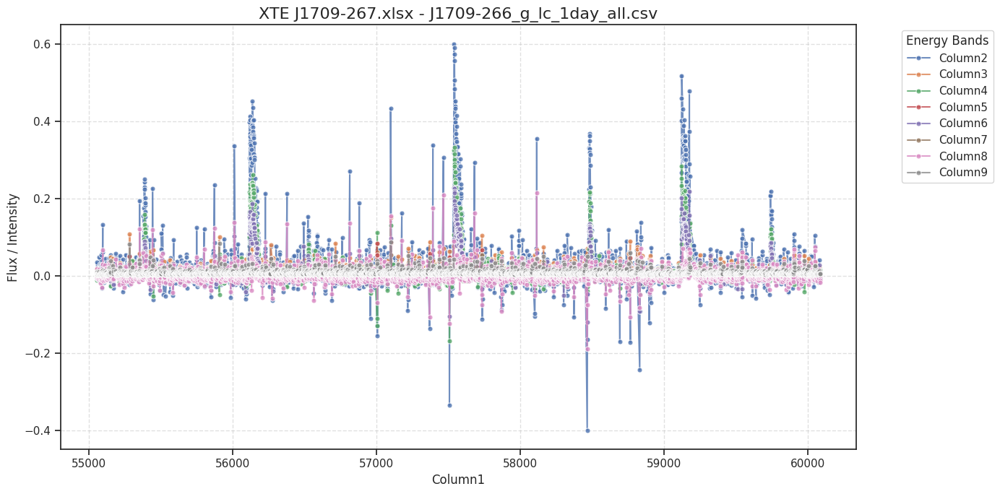

/content/raw_data/NS/4U 0115+63.xlsx - J0118+637_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.009043,0.018807,0.009822,0.012278,-0.000456,0.007943,0.002068,0.010906
1,55055.5,0.057243,0.017711,0.000390,0.006742,0.017223,0.007857,0.028844,0.011257
2,55056.5,0.043919,0.012575,0.008065,0.005541,0.007917,0.005252,0.024371,0.008159
3,55057.5,-0.006159,0.006401,-0.001526,0.002580,-0.002968,0.002675,-0.000743,0.004250
4,55058.5,-0.009552,0.005917,-0.000526,0.002448,-0.001343,0.002598,-0.006244,0.003820
...,...,...,...,...,...,...,...,...,...
3968,60064.5,0.111439,0.011503,0.022327,0.005122,0.042209,0.005129,0.029153,0.006587
3969,60065.5,0.089353,0.011025,0.016606,0.004894,0.034352,0.004693,0.022406,0.006469
3970,60066.5,0.064177,0.011298,0.013854,0.004920,0.033566,0.004964,0.004867,0.006426
3971,60067.5,0.055102,0.011894,0.017462,0.005329,0.016910,0.004665,0.014315,0.007182


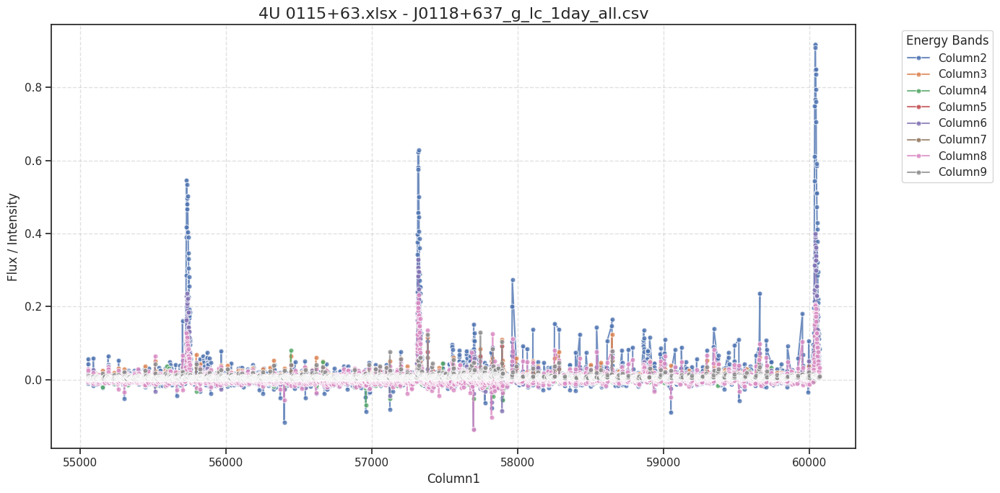

/content/raw_data/NS/V 0332+53.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,-0.002209,0.037665,0.007556,0.017576,0.004018,0.018683,-0.013621,0.020335
1,55055.5,0.060139,0.021821,0.008522,0.009103,0.013115,0.009504,0.031372,0.014424
2,55056.5,0.009803,0.015723,-0.005828,0.005711,0.001427,0.007145,0.011463,0.010456
3,55057.5,0.000043,0.008508,-0.003229,0.003233,-0.000547,0.003622,0.003741,0.005878
4,55058.5,0.000268,0.008236,-0.000090,0.003347,-0.001300,0.003444,0.001665,0.005661
...,...,...,...,...,...,...,...,...,...
3612,59729.5,-0.010803,0.022765,-0.003713,0.009574,-0.018740,0.009134,0.014249,0.014554
3613,59730.5,0.017859,0.019818,-0.003788,0.008815,-0.008346,0.008204,0.024681,0.012549
3614,59731.5,0.033087,0.017444,0.004668,0.007279,0.013025,0.007816,0.008389,0.010764
3615,59732.5,-0.016574,0.015368,-0.001440,0.006780,-0.001624,0.006696,-0.011941,0.009666


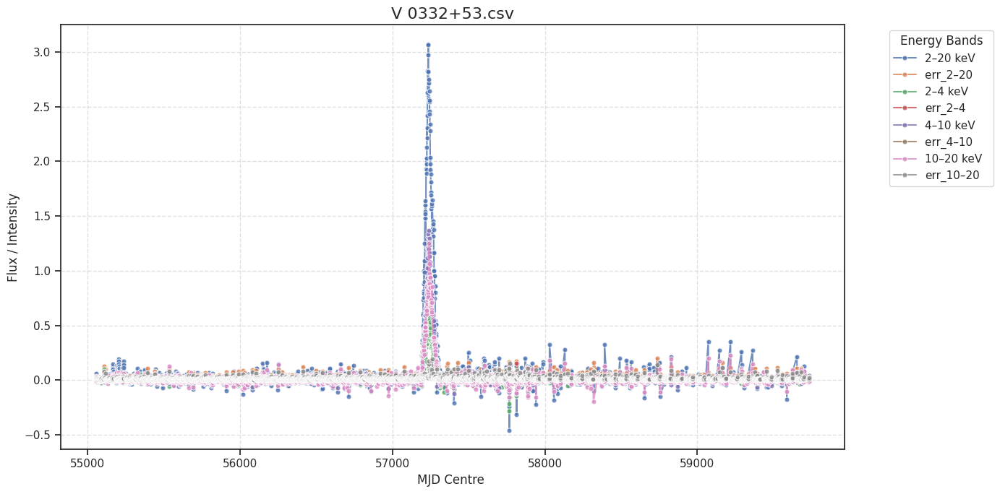

/content/raw_data/NS/GX 304-1.xlsx - J1301-616_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.038402,0.019947,0.018520,0.010282,0.018419,0.009653,-0.001359,0.011850
1,55055.5,0.075009,0.016119,0.031031,0.009012,0.036170,0.007737,0.003970,0.009361
2,55056.5,0.025945,0.010902,0.006088,0.005327,0.011947,0.005111,0.004408,0.006594
3,55057.5,0.032501,0.007269,0.018353,0.003447,0.015566,0.003270,-0.002770,0.004556
4,55058.5,0.059183,0.007530,0.018483,0.003571,0.022462,0.003438,0.012747,0.004677
...,...,...,...,...,...,...,...,...,...
4683,60069.5,0.018838,0.014263,0.006311,0.006235,0.006443,0.005921,0.005468,0.009023
4684,60070.5,0.037921,0.016300,0.000868,0.007101,0.008070,0.006692,0.021931,0.010342
4685,60071.5,0.015330,0.015572,0.001983,0.007463,0.003810,0.006237,0.008108,0.009859
4686,60072.5,0.045357,0.016543,0.004817,0.007600,0.007419,0.006338,0.025654,0.010706


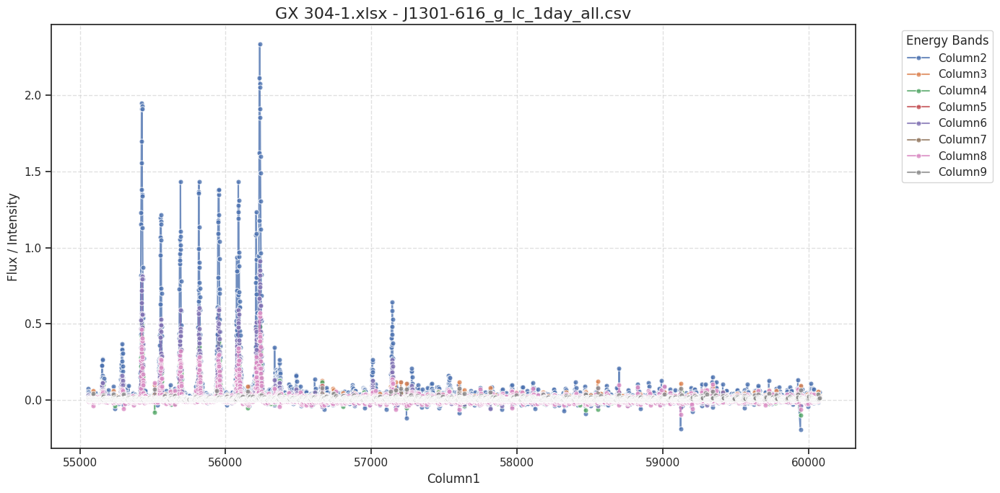

/content/raw_data/NS/NGC 6440.xlsx - J1748-203_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.017695,0.011737,0.008323,0.006419,0.008074,0.005290,-0.000953,0.006919
1,55055.5,0.017213,0.009718,0.000805,0.005040,0.007181,0.004282,0.005697,0.005949
2,55056.5,0.024054,0.007714,0.006773,0.003855,0.007201,0.003365,0.007825,0.004777
3,55057.5,0.021111,0.006853,0.000394,0.003086,0.006401,0.002964,0.010510,0.004350
4,55058.5,-0.000825,0.006924,-0.002300,0.003003,0.002746,0.003071,-0.003163,0.004325
...,...,...,...,...,...,...,...,...,...
4472,60081.5,0.006759,0.009324,0.003680,0.004656,0.002673,0.004312,-0.000727,0.005790
4473,60082.5,0.017192,0.006352,0.005432,0.003192,0.003933,0.002720,0.007254,0.004071
4474,60083.5,-0.003658,0.006565,-0.003601,0.003283,-0.001282,0.002841,0.000781,0.004183
4475,60084.5,-0.003503,0.006894,-0.003369,0.003401,0.001859,0.003134,-0.003782,0.004247


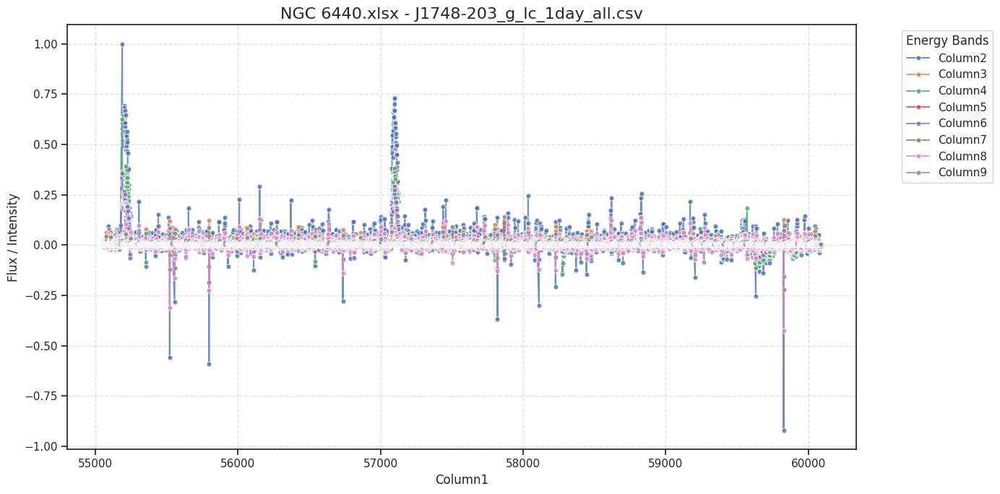

/content/raw_data/NS/IGR J18483-0311.xlsx - J1848-031_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.001007,0.007555,0.004119,0.004747,-0.000944,0.003088,-0.001318,0.004579
1,55055.5,0.029044,0.006710,0.006107,0.003880,0.010252,0.003064,0.008818,0.003850
2,55056.5,0.013885,0.006257,0.002824,0.003271,0.005829,0.002967,0.002603,0.003604
3,55057.5,0.014810,0.006568,0.002702,0.003232,0.003907,0.002880,0.007175,0.004183
4,55058.5,0.015446,0.007282,0.002778,0.003967,0.008709,0.003430,0.001400,0.004198
...,...,...,...,...,...,...,...,...,...
4392,60081.5,0.016306,0.005923,0.003972,0.003080,0.008781,0.002882,0.001073,0.003378
4393,60082.5,0.034734,0.006893,0.009380,0.003696,0.015365,0.003389,0.005618,0.003824
4394,60083.5,0.025365,0.006466,0.006480,0.003344,0.011973,0.003134,0.003255,0.003664
4395,60084.5,0.030098,0.007435,0.009170,0.004067,0.011237,0.003414,0.006901,0.004370


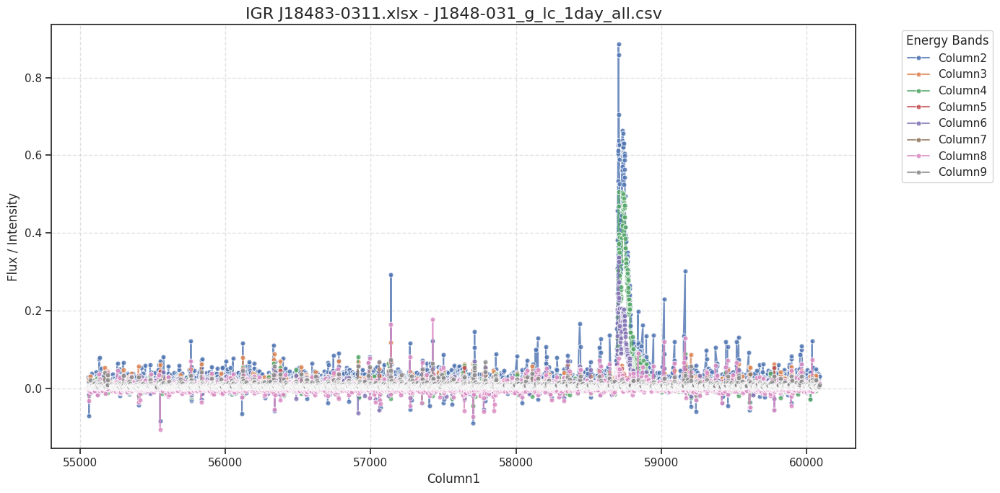

/content/raw_data/NS/SMC X-3.xlsx - J0052-724_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.000789,0.009030,-0.004299,0.003326,-0.003519,0.003933,0.008690,0.006317
1,55055.5,0.002267,0.007758,-0.003622,0.002798,0.002270,0.003745,0.002527,0.005090
2,55056.5,0.014831,0.007803,-0.000825,0.003184,0.007251,0.003473,0.006663,0.005197
3,55057.5,0.011898,0.007345,0.004457,0.003197,0.002493,0.003218,0.005238,0.005016
4,55058.5,0.002170,0.050682,0.011319,0.023133,-0.013146,0.020019,0.010437,0.035903
...,...,...,...,...,...,...,...,...,...
4705,60081.5,0.007477,0.005884,0.001109,0.002414,0.002135,0.002373,0.003116,0.003732
4706,60082.5,0.000072,0.005925,-0.000955,0.002497,-0.001639,0.002307,0.002276,0.003806
4707,60083.5,0.001019,0.005965,0.003097,0.002718,0.000297,0.002385,-0.001172,0.003745
4708,60084.5,0.005107,0.006216,0.003387,0.002733,0.001788,0.002608,0.000728,0.003827


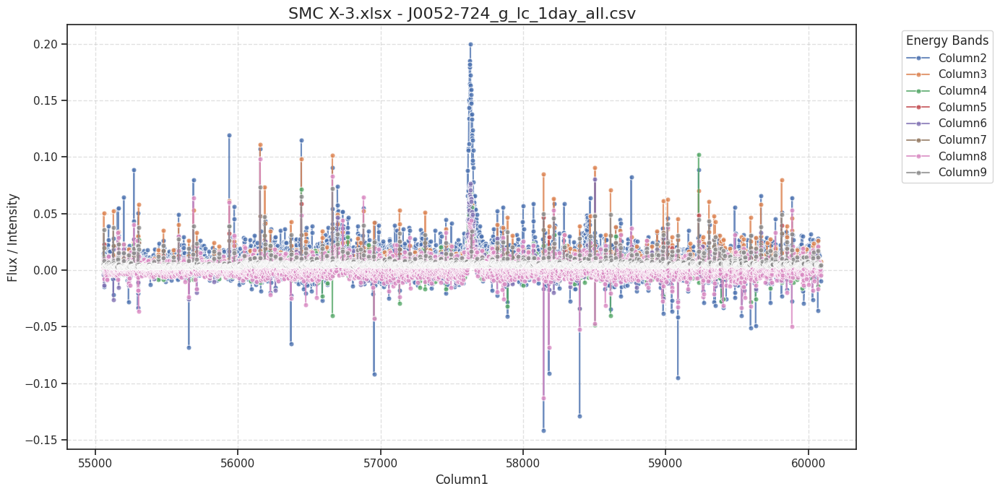

/content/raw_data/NS/2S 1417-624.xlsx - J1421-626_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55053.5,0.026635,0.053205,0.012390,0.020991,-0.010373,0.023449,0.018958,0.037160
1,55054.5,0.045882,0.016735,0.009348,0.009058,0.009193,0.007654,0.024765,0.010252
2,55055.5,0.001472,0.015206,-0.003443,0.007250,-0.004996,0.007129,0.010949,0.009425
3,55056.5,0.000361,0.010716,-0.000828,0.005147,-0.006280,0.004913,0.010310,0.006678
4,55057.5,-0.003684,0.007333,-0.005594,0.003125,-0.003494,0.003164,0.004382,0.004871
...,...,...,...,...,...,...,...,...,...
4683,60065.5,-0.017499,0.014335,0.007469,0.006682,-0.001717,0.005785,-0.017644,0.009116
4684,60066.5,0.017257,0.014937,0.010185,0.007046,-0.002682,0.006204,0.013855,0.009395
4685,60067.5,0.015549,0.014937,-0.004411,0.006630,-0.000163,0.006055,0.016647,0.009479
4686,60068.5,0.010791,0.014640,0.008610,0.007246,0.003955,0.005867,-0.001195,0.009144


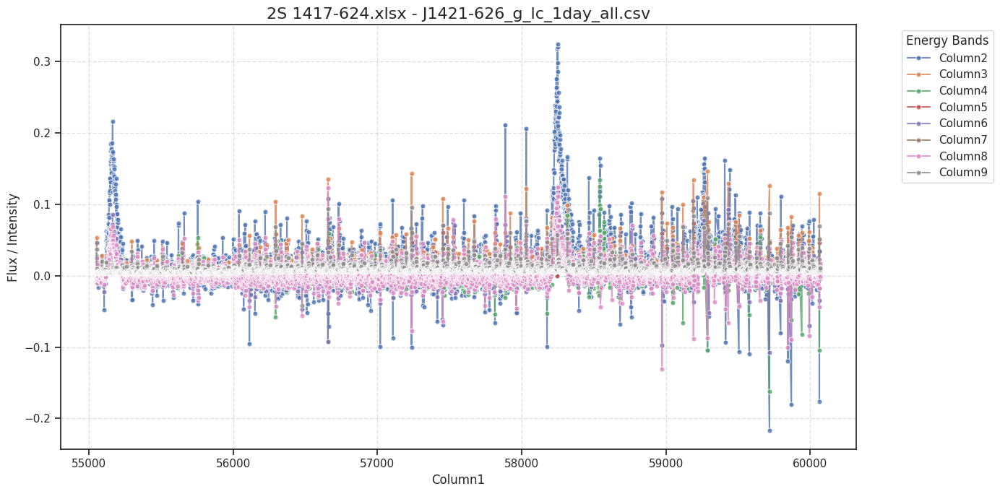

/content/raw_data/NS/XTE J1807-294.xlsx - J1806-294_g_lc_1day_all.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,0.021025,0.015872,0.017523,0.009095,0.002825,0.006796,0.004951,0.009451
1,55055.5,0.015773,0.012723,-0.001566,0.005696,0.007211,0.005637,0.006638,0.007932
2,55056.5,-0.001386,0.008146,0.003741,0.004232,0.000696,0.003617,-0.005119,0.004967
3,55057.5,0.012138,0.007381,0.001813,0.003460,0.005576,0.003250,0.002447,0.004668
4,55058.5,0.019131,0.007904,0.006414,0.003725,0.004969,0.003410,0.006027,0.005071
...,...,...,...,...,...,...,...,...,...
4154,60081.5,0.016012,0.016798,0.012558,0.009175,-0.002476,0.006997,0.008409,0.011089
4155,60082.5,0.019750,0.008397,0.009773,0.004736,0.004821,0.003665,0.004967,0.005093
4156,60083.5,0.018989,0.008236,0.006595,0.004577,0.009196,0.003788,0.000876,0.004823
4157,60084.5,0.019550,0.008847,0.001640,0.004537,0.008837,0.004080,0.005622,0.005341


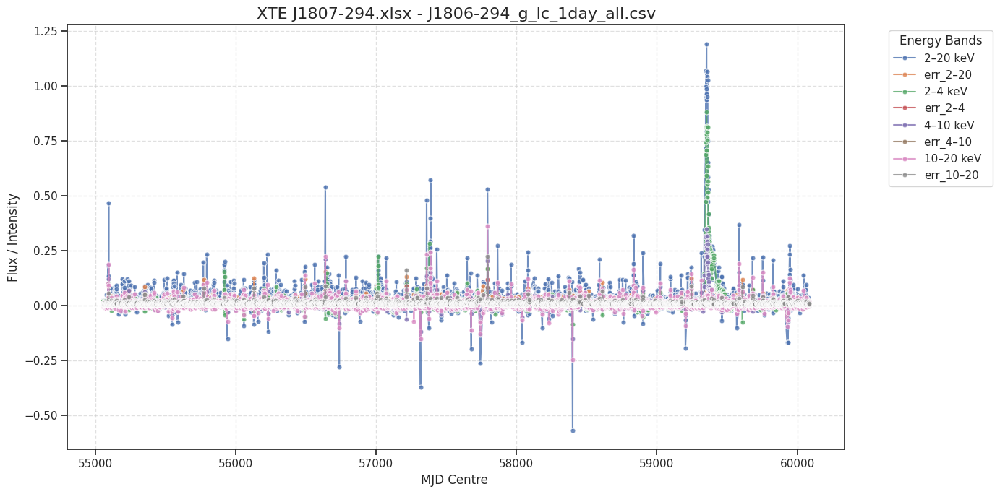

/content/raw_data/NS/4U 1901+03.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,0.005652,0.009037,-0.001208,0.004472,0.002838,0.004039,0.002397,0.005562
1,55055.5,0.001668,0.007449,-0.000932,0.003797,-0.001220,0.003223,0.003765,0.004657
2,55056.5,0.002471,0.007766,-0.003429,0.003510,-0.000182,0.003403,0.005215,0.004980
3,55057.5,-0.010571,0.007898,-0.001088,0.003938,-0.002253,0.003496,-0.005564,0.004896
4,55058.5,0.008251,0.009242,-0.000270,0.004343,-0.002184,0.003800,0.010405,0.006126
...,...,...,...,...,...,...,...,...,...
4219,60081.5,0.003571,0.007615,0.001783,0.004063,0.003656,0.003522,-0.003160,0.004480
4220,60082.5,0.005743,0.008033,0.003786,0.004137,0.001209,0.003680,0.000321,0.004803
4221,60083.5,0.005683,0.011941,0.000023,0.006436,-0.002776,0.005080,0.008512,0.007674
4222,60084.5,0.004333,0.010074,0.000328,0.005184,-0.001469,0.004442,0.006600,0.006558


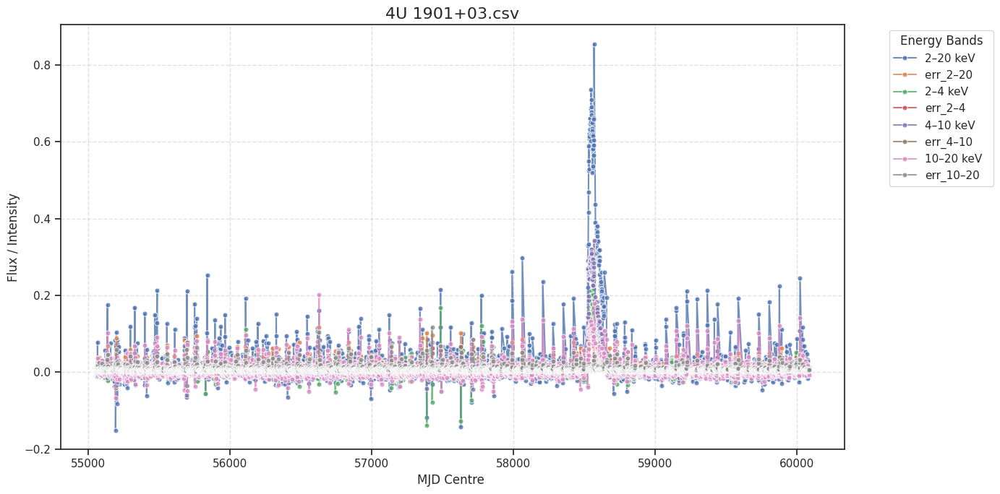

/content/raw_data/NS/EXO 1722-363.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55054.5,-0.051936,0.025686,-0.012938,0.012638,-0.013505,0.012112,-0.021006,0.014147
1,55055.5,0.017748,0.024557,-0.011513,0.013853,0.017871,0.011081,-0.001039,0.013483
2,55056.5,-0.001365,0.012095,-0.002911,0.006675,0.002898,0.005438,-0.004537,0.007211
3,55057.5,0.007592,0.009892,-0.000472,0.005217,-0.003116,0.004395,0.010925,0.006113
4,55058.5,-0.006774,0.010373,-0.007935,0.005081,0.003772,0.004685,-0.006266,0.006463
...,...,...,...,...,...,...,...,...,...
4226,60081.5,0.028398,0.014687,0.022677,0.008817,-0.005882,0.006877,0.019310,0.008509
4227,60082.5,0.000590,0.012605,-0.008173,0.007266,0.006879,0.006159,-0.003454,0.007098
4228,60083.5,0.016150,0.014950,-0.002647,0.008402,0.010219,0.006862,0.003180,0.009157
4229,60084.5,0.017988,0.022165,-0.006054,0.012686,-0.003294,0.009665,0.024305,0.013935


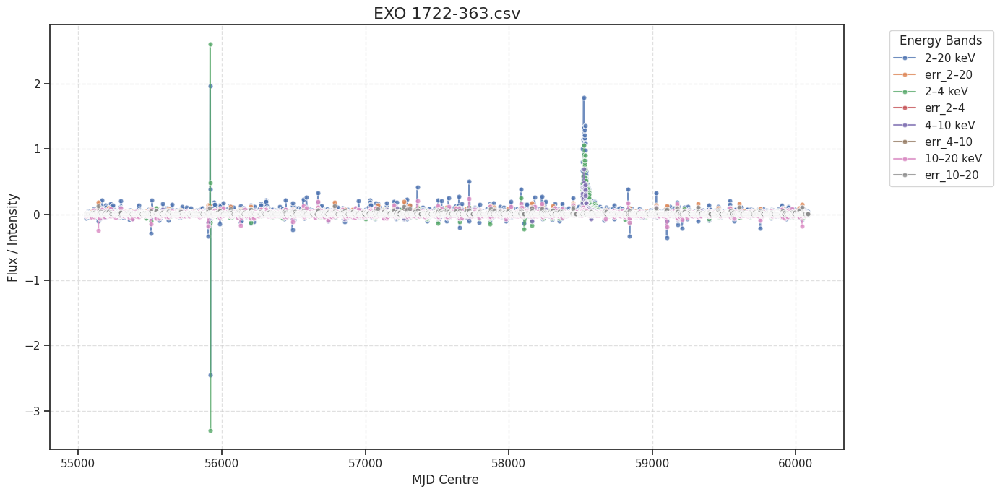

/content/raw_data/NS/4U 1624-490.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,0.133067,0.101341,0.032151,0.048711,0.093651,0.051991,-0.023900,0.053018
1,55054.5,0.171086,0.029865,0.052708,0.015858,0.073107,0.014334,0.023407,0.015918
2,55055.5,0.171793,0.022582,0.051581,0.011959,0.078330,0.010848,0.020960,0.011919
3,55056.5,0.151029,0.012824,0.044570,0.006964,0.067675,0.006422,0.022176,0.006889
4,55057.5,0.134158,0.013431,0.040243,0.006894,0.071679,0.006605,0.005002,0.007869
...,...,...,...,...,...,...,...,...,...
4161,60081.5,0.180606,0.029447,0.076057,0.017313,0.077830,0.014236,0.019439,0.016109
4162,60082.5,0.215728,0.044720,0.079790,0.027753,0.083425,0.021574,0.044593,0.024724
4163,60083.5,0.137436,0.027922,0.056816,0.015986,0.068603,0.014493,0.000372,0.014163
4164,60084.5,0.174838,0.018662,0.056353,0.010881,0.074414,0.009310,0.030623,0.010158


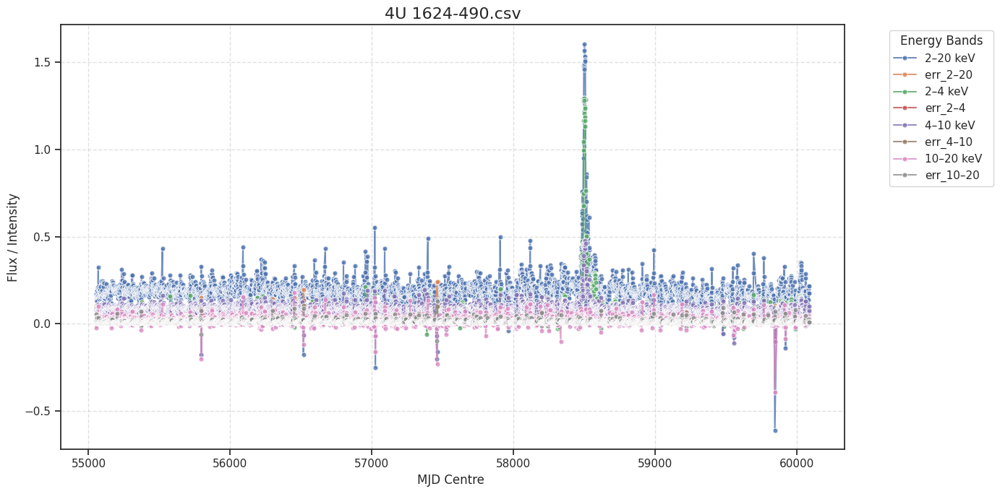

/content/raw_data/NS/GRO J1008-57l.csv


,MJD Centre,2–20 keV,err_2–20,2–4 keV,err_2–4,4–10 keV,err_4–10,10–20 keV,err_10–20
0,55053.5,-0.018411,0.043185,-0.027394,0.007908,-0.005539,0.017349,0.004203,0.031876
1,55054.5,0.041958,0.016330,0.014362,0.007510,0.016049,0.007766,0.009281,0.009992
2,55055.5,0.028156,0.012874,0.006253,0.006633,0.010249,0.005832,0.008043,0.007960
3,55056.5,0.013042,0.009734,-0.001242,0.004288,0.003105,0.004380,0.008284,0.006366
4,55057.5,0.004334,0.007021,-0.004609,0.002899,0.002700,0.003123,0.004245,0.004727
...,...,...,...,...,...,...,...,...,...
4382,59711.5,0.026150,0.019468,0.009140,0.009180,0.012396,0.007956,0.004459,0.012359
4383,59712.5,0.122117,0.046162,0.035274,0.022365,0.006126,0.016979,0.074116,0.030475
4384,59713.5,0.045326,0.019178,0.016988,0.008906,0.016674,0.007276,0.008208,0.012626
4385,59714.5,0.023804,0.019398,0.012619,0.008760,0.010874,0.007845,-0.001507,0.012324


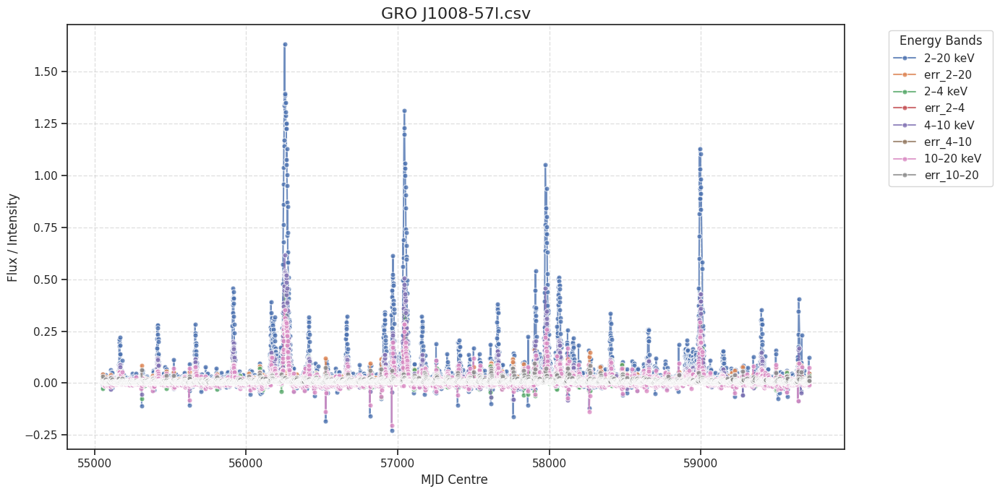

/content/raw_data/NS/Terzan 5.xlsx - J1748-248_g_lc_1day_all.csv


,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9
0,55054.5,0.102206,0.017516,0.047486,0.011698,0.035263,0.007993,0.014114,0.009112
1,55055.5,0.095738,0.014556,0.047739,0.010253,0.040979,0.007071,0.003693,0.006724
2,55056.5,0.088940,0.009833,0.048727,0.006212,0.029229,0.004410,0.009811,0.005439
3,55057.5,0.086887,0.008231,0.044777,0.004973,0.032102,0.003789,0.010557,0.004603
4,55058.5,0.080390,0.008434,0.043484,0.005015,0.027717,0.003820,0.009224,0.004782
...,...,...,...,...,...,...,...,...,...
4254,60081.5,0.011361,0.014791,0.001219,0.006945,0.005840,0.006678,0.001254,0.009687
4255,60082.5,0.025146,0.008186,0.019215,0.005095,0.006550,0.003556,0.001422,0.004832
4256,60083.5,0.049904,0.008419,0.021267,0.005151,0.016550,0.003799,0.009807,0.004779
4257,60084.5,0.046427,0.008517,0.024713,0.005349,0.020330,0.004039,0.000343,0.004564


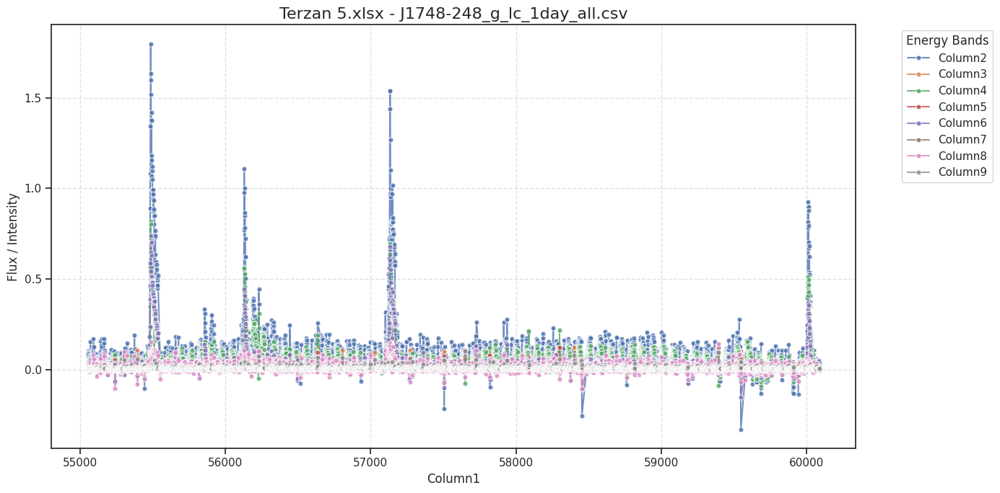

In [ ]:
for fpath in glob("/content/raw_data/NS/*.csv"):
  print(fpath)
  df = pd.read_csv(fpath)
  cols = df.columns
  display(df)

  plot_multi_series(df, x_col=cols[0], y_cols=cols[1:], title=fpath.split("/")[-1])


In [ ]:

def extract_features(filepath, label):

    df = pd.read_csv(filepath)

    # Assign proper column names
    df.columns = [
        "MJD",
        "I_total",
        "err_I_total",
        "I_soft",
        "err_I_soft",
        "I_mid",
        "err_I_mid",
        "I_hard",
        "err_I_hard"
    ]

    # =========================
    # PAPER FILTERING RULES
    # =========================

    # Remove invalid count rates
    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    # Remove large error points
    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    # Remove background dominated points (paper threshold)
    df = df[df["I_total"] >= 0.05]

    # =========================
    # Compute Hardness Ratio
    # =========================

    HR = df["I_hard"] / df["I_soft"]

    # Compute HR error (paper formula)
    HR_err = HR * np.sqrt(
        (df["err_I_soft"] / df["I_soft"])**2 +
        (df["err_I_hard"] / df["I_hard"])**2
    )

    # Remove unreliable HR points
    valid = HR_err / HR < 1

    HR = HR[valid]
    Intensity = df["I_total"][valid]

    # Convert to numpy arrays
    HR = HR.values
    Intensity = Intensity.values

    features = {}

    # =========================
    # HID HARDNESS FEATURES
    # =========================

    features["HR_mean"] = np.mean(HR)
    features["HR_std"] = np.std(HR)
    features["HR_min"] = np.min(HR)
    features["HR_max"] = np.max(HR)
    features["HR_skew"] = skew(HR)
    features["HR_kurtosis"] = kurtosis(HR)

    # =========================
    # HID INTENSITY FEATURES
    # =========================

    features["I_mean"] = np.mean(Intensity)
    features["I_std"] = np.std(Intensity)
    features["I_min"] = np.min(Intensity)
    features["I_max"] = np.max(Intensity)

    # =========================
    # HID AREA (Convex Hull)
    # =========================

    if len(HR) > 3:
        points = np.column_stack((HR, Intensity))
        try:
            hull = ConvexHull(points)
            features["hid_area"] = hull.volume
        except:
            features["hid_area"] = 0
    else:
        features["hid_area"] = 0

    # =========================
    # HR–Intensity Correlation
    # =========================

    if len(HR) > 1:
        features["corr_hr_int"] = np.corrcoef(HR, Intensity)[0, 1]
    else:
        features["corr_hr_int"] = 0

    # =========================
    # Metadata
    # =========================

    features["source"] = filepath.split("/")[-1].replace(".csv", "")
    features["label"] = label

    return features


# =========================
# BUILD DATASET
# =========================

all_features = []

# Black holes
for file in glob.glob("raw_data/BH/*.csv"):
    all_features.append(extract_features(file, "BH"))

# Neutron stars
for file in glob.glob("raw_data/NS/*.csv"):
    all_features.append(extract_features(file, "NS"))

df_final = pd.DataFrame(all_features)

df_final.to_csv("final_ml_dataset.csv", index=False)

print("Dataset created successfully")



Dataset created successfully


In [ ]:
df_final.head()

,HR_mean,HR_std,HR_min,HR_max,HR_skew,HR_kurtosis,I_mean,I_std,I_min,I_max,hid_area,corr_hr_int,source,label
0,1.084064,1.502344,0.002936,7.573148,1.880132,3.173406,0.301543,0.450362,0.051571,2.039196,8.455760,-0.267684,MAXI J1910-057 day_all,BH
1,1.002314,0.912545,0.006850,7.083855,1.924120,5.577735,0.172621,0.257661,0.050005,1.605938,6.429081,-0.234678,XTEJ1752-223_g_lc_1day_all,BH
2,0.955600,1.237949,0.014279,6.566571,1.992027,4.329168,0.119651,0.096795,0.050175,0.530421,1.577191,-0.279037,MAXI J1543-564day_all,BH
3,1.049892,1.196271,0.009197,6.316250,1.449966,1.827040,1.471414,2.349551,0.050026,9.630128,30.411193,-0.453105,MAXI J1348-632l,BH
4,0.515575,0.604046,0.009103,4.169000,2.265302,6.314300,0.443992,0.631874,0.050165,6.717911,14.041695,-0.341471,4U 1630-472. J1634-473l,BH


In [ ]:
df_final.describe()

,HR_mean,HR_std,HR_min,HR_max,HR_skew,HR_kurtosis,I_mean,I_std,I_min,I_max,hid_area,corr_hr_int
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1.095996,1.063751,0.088872,7.463958,2.401978,9.976619,0.527305,0.750731,0.051800,4.114559,14.199087,-0.308530
std,0.443864,0.372439,0.119636,2.024895,0.922567,10.455903,0.788840,1.448163,0.008214,8.366007,26.969270,0.143334
min,0.408161,0.273017,0.001834,3.056503,1.155816,0.630767,0.110571,0.043464,0.050000,0.199693,0.291546,-0.547917
25%,0.894223,0.810689,0.009711,6.356763,1.751762,3.576917,0.155954,0.128182,0.050042,0.875706,2.978372,-0.394161
50%,1.049892,1.133902,0.019110,7.573148,2.283287,7.115642,0.207152,0.227078,0.050175,1.208515,5.051450,-0.333466
75%,1.372577,1.323409,0.156322,8.739848,2.749296,11.501467,0.434449,0.463967,0.050489,2.239124,9.316128,-0.255168
max,2.150287,1.694962,0.472115,11.586122,4.996684,47.934992,3.342715,6.205945,0.095995,37.089325,124.885970,0.117531



================ DATASET SUMMARY ================
Total sources: 31
BH: 11
NS: 20

================ MODEL COMPARISON (LOOCV) ================


Logistic Regression
Accuracy: 0.6452
ROC-AUC: 0.6409
Confusion Matrix:
[[14  6]
 [ 5  6]]
Classification Report:
              precision    recall  f1-score   support

          NS       0.74      0.70      0.72        20
          BH       0.50      0.55      0.52        11

    accuracy                           0.65        31
   macro avg       0.62      0.62      0.62        31
weighted avg       0.65      0.65      0.65        31


Linear SVM
Accuracy: 0.5806
ROC-AUC: 0.5227
Confusion Matrix:
[[13  7]
 [ 6  5]]
Classification Report:
              precision    recall  f1-score   support

          NS       0.68      0.65      0.67        20
          BH       0.42      0.45      0.43        11

    accuracy                           0.58        31
   macro avg       0.55      0.55      0.55        31
weighted avg       0.59      0.58     

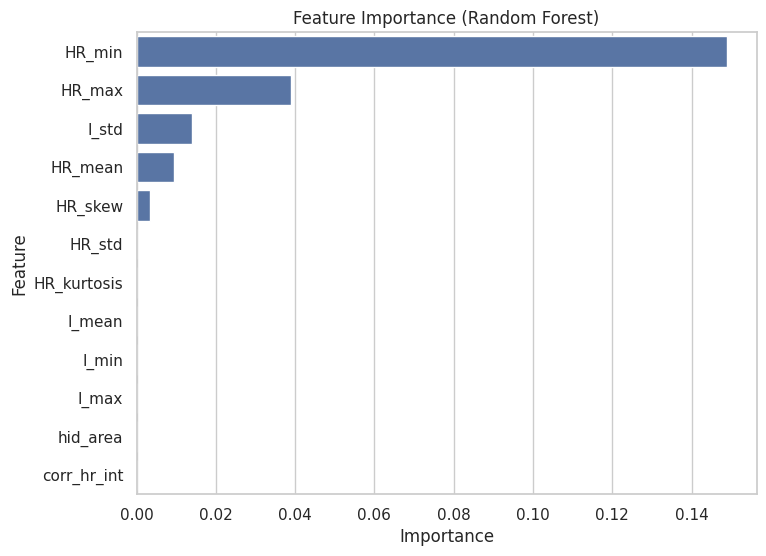

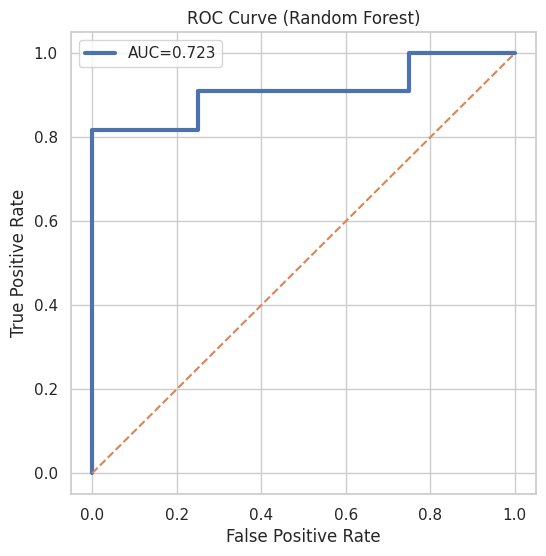


================ PIPELINE COMPLETE ================


In [ ]:
# ============================================================
# PUBLICATION-QUALITY HID-ONLY CLASSIFICATION PIPELINE
# DISPLAY ONLY VERSION (NO SAVING)
# ==========================================================

# ============================================================
# PARAMETERS
# ============================================================

DATA_PATH = "final_ml_dataset.csv"

BOOTSTRAP_ITER = 1000

RANDOM_STATE = 7


# ============================================================
# 1. LOAD DATA
# ============================================================

df = pd.read_csv(DATA_PATH)

df = df[df["label"].isin(["BH","NS"])].reset_index(drop=True)

print("\n================ DATASET SUMMARY ================")
print("Total sources:", len(df))
print("BH:", (df["label"]=="BH").sum())
print("NS:", (df["label"]=="NS").sum())


# ============================================================
# 2. STRICT HID FEATURES ONLY
# ============================================================

features = [

    "HR_mean",
    "HR_std",
    "HR_min",
    "HR_max",
    "HR_skew",
    "HR_kurtosis",

    "I_mean",
    "I_std",
    "I_min",
    "I_max",

    "hid_area",
    "corr_hr_int"

]

X = df[features]

y = (df["label"]=="BH").astype(int)


# ============================================================
# 3. DEFINE MODELS
# ============================================================

models = {

    "Logistic Regression": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            penalty="l2",
            solver="liblinear",
            random_state=RANDOM_STATE
        ))
    ]),

    "Linear SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="linear",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ]),

    "RBF SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="rbf",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ]),

    "Random Forest": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("model", RandomForestClassifier(
            n_estimators=100,
            max_depth=3,
            random_state=RANDOM_STATE
        ))
    ])

}


# ============================================================
# 4. LOOCV EVALUATION
# ============================================================

loo = LeaveOneOut()

results = []

print("\n================ MODEL COMPARISON (LOOCV) ================\n")

for name, pipeline in models.items():

    y_pred = cross_val_predict(pipeline, X, y, cv=loo)

    y_proba = cross_val_predict(
        pipeline,
        X,
        y,
        cv=loo,
        method="predict_proba"
    )[:,1]

    acc = accuracy_score(y, y_pred)

    auc = roc_auc_score(y, y_proba)

    print(f"\n{name}")
    print("Accuracy:", round(acc,4))
    print("ROC-AUC:", round(auc,4))
    print("Confusion Matrix:")
    print(confusion_matrix(y, y_pred))

    print("Classification Report:")
    print(classification_report(y, y_pred, target_names=["NS","BH"]))

    results.append({
        "Model": name,
        "Accuracy": acc,
        "ROC-AUC": auc
    })


results_df = pd.DataFrame(results)

results_df = results_df.sort_values("Accuracy", ascending=False)

print("\n================ FINAL SUMMARY TABLE ================")
print(results_df)


# ============================================================
# 5. SELECT BEST MODEL
# ============================================================

best_model_name = results_df.iloc[0]["Model"]

best_pipeline = models[best_model_name]

print("\nBest model:", best_model_name)

best_pipeline.fit(X, y)


# ============================================================
# 6. BOOTSTRAP UNCERTAINTY
# ============================================================

bootstrap_scores = []

for i in range(BOOTSTRAP_ITER):

    idx = np.random.choice(len(X), len(X), replace=True)

    X_boot = X.iloc[idx]
    y_boot = y.iloc[idx]

    if len(np.unique(y_boot)) < 2:
        continue

    best_pipeline.fit(X_boot, y_boot)

    pred = best_pipeline.predict(X)

    score = accuracy_score(y, pred)

    bootstrap_scores.append(score)


bootstrap_mean = np.mean(bootstrap_scores)

bootstrap_std = np.std(bootstrap_scores)

print("\n================ BOOTSTRAP UNCERTAINTY ================")
print("Accuracy:", round(bootstrap_mean,4), "+/-", round(bootstrap_std,4))


# ============================================================
# 7. PERMUTATION IMPORTANCE
# ============================================================

print("\n================ PERMUTATION IMPORTANCE ================")

X_imputed = best_pipeline.named_steps["imputer"].transform(X)

if "scaler" in best_pipeline.named_steps:
    X_imputed = best_pipeline.named_steps["scaler"].transform(X_imputed)

model = best_pipeline.named_steps["model"]

perm = permutation_importance(
    model,
    X_imputed,
    y,
    n_repeats=1000,
    random_state=RANDOM_STATE
)

perm_df = pd.DataFrame({
    "Feature": features,
    "Importance": perm.importances_mean,
    "Std": perm.importances_std
}).sort_values("Importance", ascending=False)

print(perm_df)


# ============================================================
# 8. FEATURE IMPORTANCE PLOT
# ============================================================

plt.figure(figsize=(8,6))

sns.barplot(
    data=perm_df,
    x="Importance",
    y="Feature"
)

plt.title(f"Feature Importance ({best_model_name})")

plt.show()


# ============================================================
# 9. ROC CURVE
# ============================================================

y_proba = best_pipeline.predict_proba(X)[:,1]

fpr, tpr, _ = roc_curve(y, y_proba)

plt.figure(figsize=(6,6))

plt.plot(fpr, tpr, linewidth=3, label=f"AUC={results_df.iloc[0]['ROC-AUC']:.3f}")

plt.plot([0,1],[0,1],'--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

plt.title(f"ROC Curve ({best_model_name})")

plt.legend()

plt.show()


# ============================================================
# PIPELINE COMPLETE
# ============================================================

print("\n================ PIPELINE COMPLETE ================")



================ DATASET SUMMARY ================
label
NS    20
BH    11
Name: count, dtype: int64
Total: 31

================ MODEL COMPARISON (LOOCV) ================


Logistic Regression
Accuracy: 0.6452
ROC-AUC: 0.6409
Confusion Matrix:
[[14  6]
 [ 5  6]]
Classification Report:
              precision    recall  f1-score   support

          NS       0.74      0.70      0.72        20
          BH       0.50      0.55      0.52        11

    accuracy                           0.65        31
   macro avg       0.62      0.62      0.62        31
weighted avg       0.65      0.65      0.65        31


Linear Discriminant Analysis
Accuracy: 0.4839
ROC-AUC: 0.5273
Confusion Matrix:
[[12  8]
 [ 8  3]]
Classification Report:
              precision    recall  f1-score   support

          NS       0.60      0.60      0.60        20
          BH       0.27      0.27      0.27        11

    accuracy                           0.48        31
   macro avg       0.44      0.44      0.44   

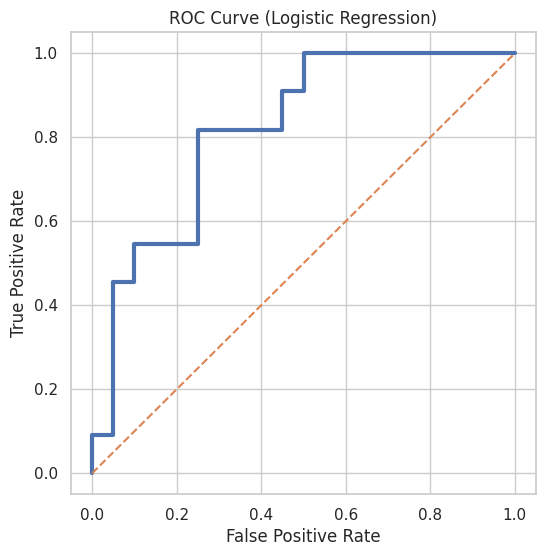


================ PIPELINE COMPLETE ================


In [ ]:
# ============================================================
# PUBLICATION-QUALITY PIPELINE FOR SMALL DATASET (N=31)
# Scientifically correct models only
# ============================================================




# ============================================================
# PARAMETERS
# ============================================================

DATA_PATH = "final_ml_dataset.csv"

BOOTSTRAP_ITER = 1000

RANDOM_STATE = 42


# ============================================================
# LOAD DATA
# ============================================================

df = pd.read_csv(DATA_PATH)

df = df[df["label"].isin(["BH","NS"])].reset_index(drop=True)

print("\n================ DATASET SUMMARY ================")
print(df["label"].value_counts())
print("Total:", len(df))


# ============================================================
# FEATURES (STRICT HID ONLY)
# ============================================================

features = [

    "HR_mean",
    "HR_std",
    "HR_min",
    "HR_max",
    "HR_skew",
    "HR_kurtosis",

    "I_mean",
    "I_std",
    "I_min",
    "I_max",

    "hid_area",
    "corr_hr_int"

]

X = df[features]

y = (df["label"]=="BH").astype(int)


# ============================================================
# DEFINE SCIENTIFICALLY APPROPRIATE MODELS
# ============================================================

models = {

    "Logistic Regression": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            penalty="l2",
            C=1.0,
            solver="liblinear",
            random_state=RANDOM_STATE
        ))
    ]),

    "Linear Discriminant Analysis": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LinearDiscriminantAnalysis())
    ]),

    "Gaussian Naive Bayes": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("model", GaussianNB())
    ]),

    "Linear SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="linear",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ])

}


# ============================================================
# LOOCV COMPARISON
# ============================================================

loo = LeaveOneOut()

results = []

print("\n================ MODEL COMPARISON (LOOCV) ================\n")

for name, pipeline in models.items():

    y_pred = cross_val_predict(pipeline, X, y, cv=loo)

    y_proba = cross_val_predict(
        pipeline,
        X,
        y,
        cv=loo,
        method="predict_proba"
    )[:,1]

    acc = accuracy_score(y, y_pred)

    auc = roc_auc_score(y, y_proba)

    print(f"\n{name}")
    print("Accuracy:", round(acc,4))
    print("ROC-AUC:", round(auc,4))
    print("Confusion Matrix:")
    print(confusion_matrix(y, y_pred))
    print("Classification Report:")
    print(classification_report(y, y_pred, target_names=["NS","BH"]))

    results.append({
        "Model": name,
        "Accuracy": acc,
        "ROC-AUC": auc
    })


results_df = pd.DataFrame(results)

results_df = results_df.sort_values("Accuracy", ascending=False)

print("\n================ FINAL SUMMARY TABLE ================")
print(results_df)


# ============================================================
# SELECT BEST MODEL
# ============================================================

best_model_name = results_df.iloc[0]["Model"]

best_pipeline = models[best_model_name]

print("\nBest model:", best_model_name)

best_pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP UNCERTAINTY
# ============================================================

bootstrap_scores = []

for i in range(BOOTSTRAP_ITER):

    idx = np.random.choice(len(X), len(X), replace=True)

    X_boot = X.iloc[idx]
    y_boot = y.iloc[idx]

    if len(np.unique(y_boot)) < 2:
        continue

    best_pipeline.fit(X_boot, y_boot)

    pred = best_pipeline.predict(X)

    score = accuracy_score(y, pred)

    bootstrap_scores.append(score)


print("\n================ BOOTSTRAP UNCERTAINTY ================")
print("Accuracy:",
      round(np.mean(bootstrap_scores),4),
      "+/-",
      round(np.std(bootstrap_scores),4))


# ============================================================
# PERMUTATION IMPORTANCE
# ============================================================

print("\n================ PERMUTATION IMPORTANCE ================")

X_imp = best_pipeline.named_steps["imputer"].transform(X)

if "scaler" in best_pipeline.named_steps:
    X_imp = best_pipeline.named_steps["scaler"].transform(X_imp)

model = best_pipeline.named_steps["model"]

perm = permutation_importance(
    model,
    X_imp,
    y,
    n_repeats=1000,
    random_state=RANDOM_STATE
)

perm_df = pd.DataFrame({
    "Feature": features,
    "Importance": perm.importances_mean
}).sort_values("Importance", ascending=False)

print(perm_df)


# ============================================================
# ROC CURVE
# ============================================================

y_proba = best_pipeline.predict_proba(X)[:,1]

fpr, tpr, _ = roc_curve(y, y_proba)

plt.figure(figsize=(6,6))

plt.plot(fpr, tpr, linewidth=3)

plt.plot([0,1],[0,1],'--')

plt.title(f"ROC Curve ({best_model_name})")

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.show()


print("\n================ PIPELINE COMPLETE ================")


# 2nd iteration

In [ ]:



# ============================================================
# FEATURE EXTRACTION FUNCTION (PAPER-ALIGNED)
# ============================================================

def extract_features(filepath, label):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD",
        "I_total",
        "err_I_total",
        "I_soft",
        "err_I_soft",
        "I_mid",
        "err_I_mid",
        "I_hard",
        "err_I_hard"
    ]

    # =========================
    # PAPER FILTERING RULES
    # =========================

    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    if len(df) < 10:
        return None

    # =========================
    # HARDNESS RATIO
    # =========================

    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"] / df["I_soft"])**2 +
        (df["err_I_hard"] / df["I_hard"])**2
    )

    valid = HR_err / HR < 1

    HR = HR[valid].values
    Intensity = df["I_total"][valid].values
    Err = df["err_I_total"][valid].values

    if len(HR) < 10:
        return None

    features = {}

    # ============================================================
    # 1. STATE FRACTIONS
    # ============================================================

    hard = np.sum(HR >= 0.2)
    soft = np.sum(HR < 0.2)

    total = len(HR)

    features["hard_fraction"] = hard / total
    features["soft_fraction"] = soft / total

    # ============================================================
    # 2. BASIC HR FEATURE
    # ============================================================

    features["HR_mean"] = np.mean(HR)

    # ============================================================
    # 3. OUTBURST DETECTION (CORRECTED)
    # ============================================================

    # Gaussian smoothing (paper-inspired)
    smooth = gaussian_filter1d(Intensity, sigma=5)

    # 🔥 CORRECTED dynamic threshold (paper-aligned)
    threshold = np.median(smooth) + 0.5 * np.mean(Err)

    above = smooth > threshold

    durations = []
    current = 0

    for val in above:
        if val:
            current += 1
        else:
            if current >= 15:
                durations.append(current)
            current = 0

    if current >= 15:
        durations.append(current)

    durations = np.array(durations)

    # ============================================================
    # 4. OUTBURST FEATURES
    # ============================================================

    if len(durations) > 0:

        features["mean_outburst_duration"] = np.mean(durations)
        features["median_outburst_duration"] = np.median(durations)
        features["max_outburst_duration"] = np.max(durations)
        features["num_outbursts"] = len(durations)

        # Region fractions
        r1 = np.sum((durations >= 15) & (durations < 60))
        r2 = np.sum((durations >= 60) & (durations < 100))
        r3 = np.sum((durations >= 100) & (durations < 200))
        r4 = np.sum(durations >= 200)

        total_d = len(durations)

        features["frac_15_60"] = r1 / total_d
        features["frac_60_100"] = r2 / total_d
        features["frac_100_200"] = r3 / total_d
        features["frac_200_plus"] = r4 / total_d

    else:
        features["mean_outburst_duration"] = 0
        features["median_outburst_duration"] = 0
        features["max_outburst_duration"] = 0
        features["num_outbursts"] = 0

        features["frac_15_60"] = 0
        features["frac_60_100"] = 0
        features["frac_100_200"] = 0
        features["frac_200_plus"] = 0

    # ============================================================
    # METADATA
    # ============================================================

    features["source"] = filepath.split("/")[-1].replace(".csv", "")
    features["label"] = label

    return features


# ============================================================
# BUILD DATASET
# ============================================================

all_features = []

for file in glob.glob("raw_data/BH/*.csv"):
    feat = extract_features(file, "BH")
    if feat:
        all_features.append(feat)

for file in glob.glob("raw_data/NS/*.csv"):
    feat = extract_features(file, "NS")
    if feat:
        all_features.append(feat)

df_final = pd.DataFrame(all_features)

print("\nDataset Created")
print(df_final.head())


Dataset Created
   hard_fraction  soft_fraction   HR_mean  mean_outburst_duration  \
0       0.714286       0.285714  1.049892               65.500000   
1       0.809249       0.190751  0.981302               41.500000   
2       0.573535       0.426465  0.515575              139.666667   
3       0.703063       0.296937  0.408161              136.600000   
4       0.625899       0.374101  1.099317               67.000000   

   median_outburst_duration  max_outburst_duration  num_outbursts  frac_15_60  \
0                      65.5                     92              2    0.500000   
1                      41.5                     46              2    1.000000   
2                      91.0                    406              9    0.111111   
3                     122.0                    225              5    0.000000   
4                      67.0                     67              1    0.000000   

   frac_60_100  frac_100_200  frac_200_plus  \
0     0.500000      0.000000      

In [ ]:
df_final.head()

,hard_fraction,soft_fraction,HR_mean,mean_outburst_duration,median_outburst_duration,max_outburst_duration,num_outbursts,frac_15_60,frac_60_100,frac_100_200,frac_200_plus,source,label
0,0.714286,0.285714,1.049892,65.500000,65.5,92,2,0.500000,0.500000,0.000000,0.000000,MAXI J1348-632l,BH
1,0.809249,0.190751,0.981302,41.500000,41.5,46,2,1.000000,0.000000,0.000000,0.000000,GS 1354-64day_all,BH
2,0.573535,0.426465,0.515575,139.666667,91.0,406,9,0.111111,0.444444,0.222222,0.222222,4U 1630-472. J1634-473l,BH
3,0.703063,0.296937,0.408161,136.600000,122.0,225,5,0.000000,0.400000,0.400000,0.200000,GRS 1739-278.xlsx - J1742-277_g_lc_1day_all,BH
4,0.625899,0.374101,1.099317,67.000000,67.0,67,1,0.000000,1.000000,0.000000,0.000000,4U 1543-475day_all,BH


In [ ]:



# ============================================================
# PARAMETERS
# ============================================================

BOOTSTRAP_ITER = 1000
RANDOM_STATE = 42


# ============================================================
# LOAD DATA (USE YOUR df_final)
# ============================================================

df = df_final.copy()

print("\n================ DATASET SUMMARY ================")
print(df["label"].value_counts())
print("Total:", len(df))


# ============================================================
# FEATURES (STRICT PAPER FEATURES)
# ============================================================

features = [

    "hard_fraction",
    "soft_fraction",
    "HR_mean",

    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",

    "num_outbursts",

    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus"
]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# DEFINE MODELS
# ============================================================

models = {

    "Logistic Regression": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            penalty="l2",
            solver="liblinear",
            random_state=RANDOM_STATE
        ))
    ]),

    "Linear SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="linear",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ]),

    "RBF SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="rbf",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ]),

    "KNN": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", KNeighborsClassifier(
            n_neighbors=3   # small dataset → small k
        ))
    ])
}


# ============================================================
# LOOCV EVALUATION
# ============================================================

loo = LeaveOneOut()

results = []

print("\n================ MODEL COMPARISON (LOOCV) ================\n")

for name, pipeline in models.items():

    y_pred = cross_val_predict(pipeline, X, y, cv=loo)

    y_proba = cross_val_predict(
        pipeline,
        X,
        y,
        cv=loo,
        method="predict_proba"
    )[:, 1]

    acc = accuracy_score(y, y_pred)
    auc = roc_auc_score(y, y_proba)

    print(f"\n{name}")
    print("Accuracy:", round(acc, 4))
    print("ROC-AUC:", round(auc, 4))

    print("Confusion Matrix:")
    print(confusion_matrix(y, y_pred))

    print("Classification Report:")
    print(classification_report(y, y_pred, target_names=["NS", "BH"]))

    results.append({
        "Model": name,
        "Accuracy": acc,
        "ROC-AUC": auc
    })


# ============================================================
# SUMMARY TABLE
# ============================================================

results_df = pd.DataFrame(results)
results_df = results_df.sort_values("Accuracy", ascending=False)

print("\n================ FINAL SUMMARY TABLE ================")
print(results_df)


# ============================================================
# BEST MODEL SELECTION
# ============================================================

best_model_name = results_df.iloc[0]["Model"]
best_pipeline = models[best_model_name]

print("\nBest Model:", best_model_name)

best_pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP UNCERTAINTY
# ============================================================

bootstrap_scores = []

for _ in range(BOOTSTRAP_ITER):

    idx = np.random.choice(len(X), len(X), replace=True)

    Xb = X.iloc[idx]
    yb = y.iloc[idx]

    if len(np.unique(yb)) < 2:
        continue

    best_pipeline.fit(Xb, yb)

    pred = best_pipeline.predict(X)

    score = accuracy_score(y, pred)

    bootstrap_scores.append(score)

print("\n================ BOOTSTRAP RESULTS ================")
print("Accuracy:", round(np.mean(bootstrap_scores), 4),
      "+/-", round(np.std(bootstrap_scores), 4))


# ============================================================
# PERMUTATION IMPORTANCE (BEST MODEL ONLY)
# ============================================================

print("\n================ PERMUTATION IMPORTANCE ================")

X_transformed = best_pipeline.named_steps["imputer"].transform(X)

if "scaler" in best_pipeline.named_steps:
    X_transformed = best_pipeline.named_steps["scaler"].transform(X_transformed)

model = best_pipeline.named_steps["model"]

perm = permutation_importance(
    model,
    X_transformed,
    y,
    n_repeats=1000,
    random_state=RANDOM_STATE
)

perm_df = pd.DataFrame({
    "Feature": features,
    "Importance": perm.importances_mean
}).sort_values("Importance", ascending=False)

print(perm_df)


# ============================================================
# PIPELINE COMPLETE
# ============================================================

print("\n================ PIPELINE COMPLETE ================")


================ DATASET SUMMARY ================
label
NS    20
BH    11
Name: count, dtype: int64
Total: 31

================ MODEL COMPARISON (LOOCV) ================


Logistic Regression
Accuracy: 0.6129
ROC-AUC: 0.7182
Confusion Matrix:
[[14  6]
 [ 6  5]]
Classification Report:
              precision    recall  f1-score   support

          NS       0.70      0.70      0.70        20
          BH       0.45      0.45      0.45        11

    accuracy                           0.61        31
   macro avg       0.58      0.58      0.58        31
weighted avg       0.61      0.61      0.61        31


Linear SVM
Accuracy: 0.6129
ROC-AUC: 0.3227
Confusion Matrix:
[[14  6]
 [ 6  5]]
Classification Report:
              precision    recall  f1-score   support

          NS       0.70      0.70      0.70        20
          BH       0.45      0.45      0.45        11

    accuracy                           0.61        31
   macro avg       0.58      0.58      0.58        31
weighted a

Dataset size: 31

========== LR ==========
Best Threshold: 0.562
Optimized Accuracy: 0.742
Bootstrap: 0.762 +/- 0.043

========== SVM ==========
Best Threshold: inf
Optimized Accuracy: 0.645
Bootstrap: 0.645 +/- 0.0

========== KNN ==========
Best Threshold: inf
Optimized Accuracy: 0.645
Bootstrap: 0.645 +/- 0.0

Final Results:
  Model  Accuracy           Std
0    LR  0.741935  4.316587e-02
1   SVM  0.645161  1.110223e-16
2   KNN  0.645161  1.110223e-16


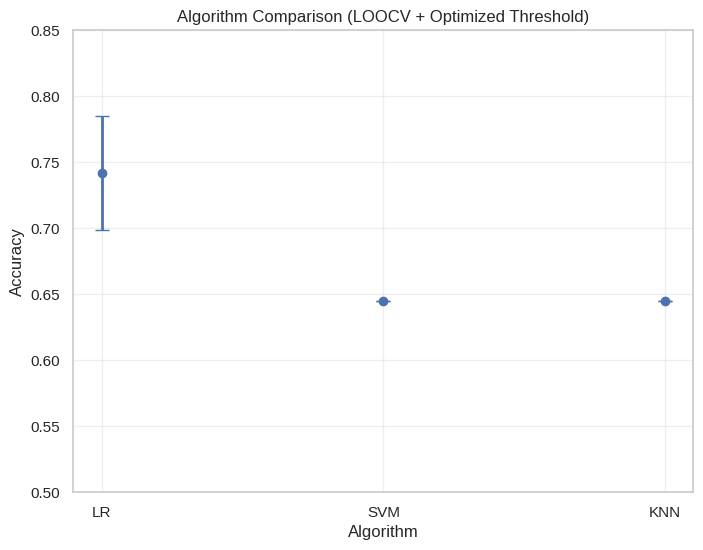

In [ ]:
# ============================================================
# PUBLICATION-QUALITY MODEL COMPARISON PLOT
# (LR, SVM, KNN with optimized threshold + bootstrap error bars)
# ============================================================

# ============================================================
# LOAD DATA
# ============================================================

df = df_final.copy() # Changed to use df_final from memory

df = df[df["label"].isin(["BH","NS"])].reset_index(drop=True)

X = df.drop(columns=["label","source"])
y = (df["label"]=="BH").astype(int)

print("Dataset size:", len(df))


# ============================================================
# DEFINE MODELS
# ============================================================

models = {

    "LR": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            class_weight="balanced",
            solver="liblinear",
            random_state=42
        ))
    ]),

    "SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="linear",
            probability=True,
            class_weight="balanced",
            random_state=42
        ))
    ]),

    "KNN": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", KNeighborsClassifier(n_neighbors=5))
    ])
}


# ============================================================
# FUNCTION: FIND BEST THRESHOLD
# ============================================================

def find_best_threshold(y_true, y_proba):

    fpr, tpr, thresholds = roc_curve(y_true, y_proba)

    best_acc = 0
    best_thresh = 0.5

    for t in thresholds:
        preds = (y_proba >= t).astype(int)
        acc = accuracy_score(y_true, preds)

        if acc > best_acc:
            best_acc = acc
            best_thresh = t

    return best_thresh, best_acc


# ============================================================
# FUNCTION: BOOTSTRAP ERROR
# ============================================================

def bootstrap_accuracy(model, X, y, threshold, n_iter=500):

    scores = []

    for _ in range(n_iter):

        idx = np.random.choice(len(X), len(X), replace=True)

        Xb = X.iloc[idx]
        yb = y.iloc[idx]

        if len(np.unique(yb)) < 2:
            continue

        model.fit(Xb, yb)

        prob = model.predict_proba(X)[:,1]
        pred = (prob >= threshold).astype(int)

        scores.append(accuracy_score(y, pred))

    return np.mean(scores), np.std(scores)


# ============================================================
# MAIN LOOP
# ============================================================

loo = LeaveOneOut()

results = []

for name, model in models.items():

    print(f"\n========== {name} ==========")

    # LOOCV probabilities
    y_proba = cross_val_predict(
        model, X, y,
        cv=loo,
        method="predict_proba"
    )[:,1]

    # Find best threshold
    best_thresh, best_acc = find_best_threshold(y, y_proba)

    print("Best Threshold:", round(best_thresh,3))
    print("Optimized Accuracy:", round(best_acc,3))

    # Bootstrap error bars
    model.fit(X, y)
    mean_acc, std_acc = bootstrap_accuracy(model, X, y, best_thresh)

    print("Bootstrap:", round(mean_acc,3), "+/-", round(std_acc,3))

    results.append({
        "Model": name,
        "Accuracy": best_acc,
        "Std": std_acc
    })


# ============================================================
# CREATE DATAFRAME
# ============================================================

results_df = pd.DataFrame(results)

print("\nFinal Results:")
print(results_df)


# ============================================================
# PLOT (PUBLICATION STYLE)
# ============================================================

plt.figure(figsize=(8,6))

plt.errorbar(
    results_df["Model"],
    results_df["Accuracy"],
    yerr=results_df["Std"],
    fmt='o',
    capsize=5,
    linewidth=2
)

plt.ylabel("Accuracy")
plt.xlabel("Algorithm")
plt.title("Algorithm Comparison (LOOCV + Optimized Threshold)")

plt.ylim(0.5, 0.85)

plt.grid(alpha=0.3)
plt.style.use("seaborn-v0_8-whitegrid")

plt.show()

In [ ]:
# ============================================================
# PUBLICATION-READY LOGISTIC REGRESSION (BALANCED)
# ============================================================

# ============================================================
# DATA
# ============================================================

df = df_final.copy()

features = [

    "hard_fraction",
    "soft_fraction",
    "HR_mean",

    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",

    "num_outbursts",

    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus"
]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# MODEL (BALANCED LR)
# ============================================================

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        solver="liblinear",
        class_weight="balanced",   # 🔥 KEY CHANGE
        random_state=42
    ))
])


# ============================================================
# LOOCV PREDICTIONS
# ============================================================

loo = LeaveOneOut()

y_pred = cross_val_predict(pipeline, X, y, cv=loo)

y_proba = cross_val_predict(
    pipeline,
    X,
    y,
    cv=loo,
    method="predict_proba"
)[:, 1]


# ============================================================
# BASIC RESULTS
# ============================================================

print("\n================ BASE RESULTS ================")

print("Accuracy:", accuracy_score(y, y_pred))
print("ROC-AUC:", roc_auc_score(y, y_proba))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

print("\nClassification Report:")
print(classification_report(y, y_pred, target_names=["NS", "BH"]))


# ============================================================
# 🔥 THRESHOLD OPTIMIZATION (IMPORTANT)
# ============================================================

fpr, tpr, thresholds = roc_curve(y, y_proba)

j_scores = tpr - fpr
best_idx = np.argmax(j_scores)

best_threshold = thresholds[best_idx]

print("\n================ THRESHOLD OPTIMIZATION ================")
print("Best Threshold:", best_threshold)


# Apply new threshold
y_pred_opt = (y_proba >= best_threshold).astype(int)

print("\nResults with Optimized Threshold:")

print("Accuracy:", accuracy_score(y, y_pred_opt))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred_opt))

print("\nClassification Report:")
print(classification_report(y, y_pred_opt, target_names=["NS", "BH"]))


# ============================================================
# TRAIN FINAL MODEL
# ============================================================

pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP UNCERTAINTY
# ============================================================

bootstrap_scores = []

for _ in range(1000):

    idx = np.random.choice(len(X), len(X), replace=True)

    Xb = X.iloc[idx]
    yb = y.iloc[idx]

    if len(np.unique(yb)) < 2:
        continue

    pipeline.fit(Xb, yb)

    pred = pipeline.predict(X)

    score = accuracy_score(y, pred)

    bootstrap_scores.append(score)

print("\n================ BOOTSTRAP RESULTS ================")
print("Accuracy:", np.mean(bootstrap_scores),
      "+/-", np.std(bootstrap_scores))


# ============================================================
# FEATURE COEFFICIENTS (INTERPRETABLE!)
# ============================================================

coeffs = pipeline.named_steps["model"].coef_[0]

coef_df = pd.DataFrame({
    "Feature": features,
    "Coefficient": coeffs,
    "Abs Importance": np.abs(coeffs)
}).sort_values("Abs Importance", ascending=False)

print("\n================ FEATURE COEFFICIENTS ================")
print(coef_df)


# ============================================================
# DONE
# ============================================================

print("\nPipeline Complete.")


================ BASE RESULTS ================
Accuracy: 0.6774193548387096
ROC-AUC: 0.7318181818181818

Confusion Matrix:
[[12  8]
 [ 2  9]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.86      0.60      0.71        20
          BH       0.53      0.82      0.64        11

    accuracy                           0.68        31
   macro avg       0.69      0.71      0.67        31
weighted avg       0.74      0.68      0.68        31


================ THRESHOLD OPTIMIZATION ================
Best Threshold: 0.5618202766072714

Results with Optimized Threshold:
Accuracy: 0.7419354838709677

Confusion Matrix:
[[14  6]
 [ 2  9]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.88      0.70      0.78        20
          BH       0.60      0.82      0.69        11

    accuracy                           0.74        31
   macro avg       0.74      0.76      0.74        31
weighted avg   


================ CALIBRATION CURVE ================


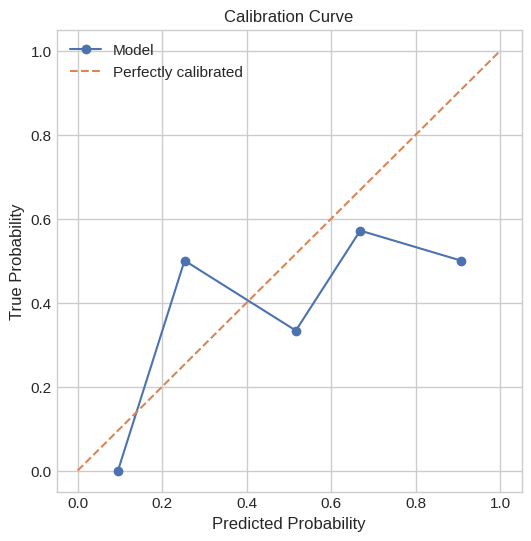


================ LEARNING CURVE ================


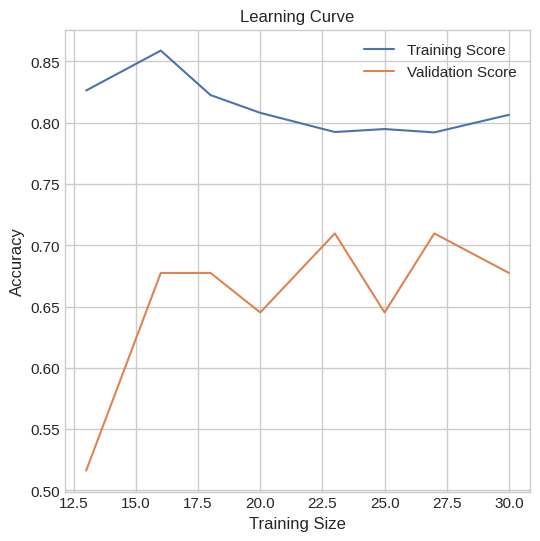


================ FEATURE ABLATION STUDY ================
State Only           → Accuracy: 0.6774
Duration Only        → Accuracy: 0.5806
Full Model           → Accuracy: 0.6774

================ MINIMAL MODEL ================
Minimal Model Accuracy: 0.6774193548387096

================ MISCLASSIFICATION ANALYSIS ================

Misclassified Sources:
                                               source  true  pred   prob_BH
1                                   GS 1354-64day_all     1     0  0.336589
6                          XTEJ1752-223_g_lc_1day_all     1     0  0.220657
12                                         4U 1901+03     0     1  0.635274
13       XTE J1709-267.xlsx - J1709-266_g_lc_1day_all     0     1  0.775342
14       XTE J1739-285.xlsx - J1739-284_g_lc_1day_all     0     1  0.830501
20  Swift J0243.6+6124.xlsx - J0243+614_g_lc_1orb_...     0     1  0.999975
22     IGR J18483-0311.xlsx - J1848-031_g_lc_1day_all     0     1  0.911300
24                                  

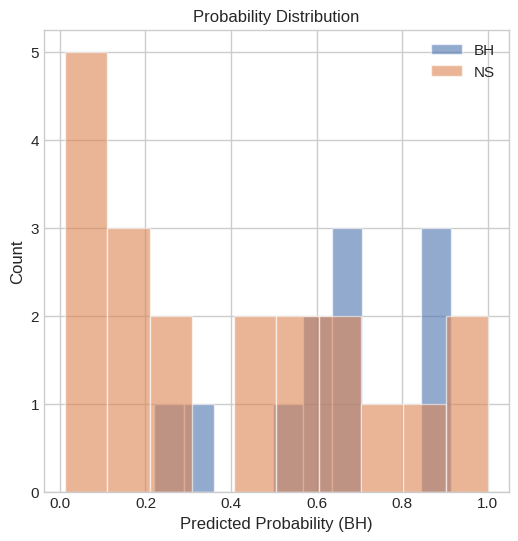


================ ALL ANALYSIS COMPLETE ================


In [ ]:
# ============================================================
# ADDITIONAL ANALYSIS (PUBLICATION QUALITY)
# ============================================================




# ============================================================
# 🔥 1. CALIBRATION CURVE
# ============================================================

print("\n================ CALIBRATION CURVE ================")

prob_true, prob_pred = calibration_curve(y, y_proba, n_bins=5)

plt.figure(figsize=(6,6))
plt.plot(prob_pred, prob_true, marker='o', label="Model")
plt.plot([0,1],[0,1],'--', label="Perfectly calibrated")

plt.xlabel("Predicted Probability")
plt.ylabel("True Probability")
plt.title("Calibration Curve")

plt.legend()
plt.show()


# ============================================================
# 🔥 2. LEARNING CURVE
# ============================================================

print("\n================ LEARNING CURVE ================")

train_sizes, train_scores, test_scores = learning_curve(
    pipeline,
    X,
    y,
    cv=LeaveOneOut(),
    scoring='accuracy',
    train_sizes=np.linspace(0.3, 1.0, 10)
)

train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(6,6))
plt.plot(train_sizes, train_mean, label="Training Score")
plt.plot(train_sizes, test_mean, label="Validation Score")

plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve")

plt.legend()
plt.show()


# ============================================================
# 🔥 3. FEATURE ABLATION STUDY
# ============================================================

print("\n================ FEATURE ABLATION STUDY ================")

# Model builder
def build_model():
    return Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            solver="liblinear",
            class_weight="balanced"
        ))
    ])

# Different feature sets
feature_sets = {

    "State Only": [
        "hard_fraction", "soft_fraction"
    ],

    "Duration Only": [
        "mean_outburst_duration",
        "median_outburst_duration",
        "max_outburst_duration",
        "num_outbursts",
        "frac_15_60",
        "frac_60_100",
        "frac_100_200",
        "frac_200_plus"
    ],

    "Full Model": [
        "hard_fraction",
        "soft_fraction",
        "HR_mean",
        "mean_outburst_duration",
        "median_outburst_duration",
        "max_outburst_duration",
        "num_outbursts",
        "frac_15_60",
        "frac_60_100",
        "frac_100_200",
        "frac_200_plus"
    ]
}

for name, feats in feature_sets.items():

    X_sub = df[feats]

    model = build_model()

    y_pred_sub = cross_val_predict(model, X_sub, y, cv=LeaveOneOut())

    acc = accuracy_score(y, y_pred_sub)

    print(f"{name:20s} → Accuracy: {acc:.4f}")


# ============================================================
# 🔥 4. MINIMAL MODEL
# ============================================================

print("\n================ MINIMAL MODEL ================")

minimal_features = [
    "hard_fraction",
    "HR_mean",
    "mean_outburst_duration"
]

X_min = df[minimal_features]

model = build_model()

y_pred_min = cross_val_predict(model, X_min, y, cv=LeaveOneOut())

acc_min = accuracy_score(y, y_pred_min)

print("Minimal Model Accuracy:", acc_min)


# ============================================================
# 🔥 5. MISCLASSIFICATION ANALYSIS
# ============================================================

print("\n================ MISCLASSIFICATION ANALYSIS ================")

df_analysis = df.copy()

df_analysis["true"] = y
df_analysis["pred"] = y_pred_opt
df_analysis["prob_BH"] = y_proba

misclassified = df_analysis[df_analysis["true"] != df_analysis["pred"]]

print("\nMisclassified Sources:")
print(misclassified[["source", "true", "pred", "prob_BH"]])


# ============================================================
# 🔥 6. PROBABILITY DISTRIBUTION
# ============================================================

print("\n================ PROBABILITY DISTRIBUTION ================")

plt.figure(figsize=(6,6))

plt.hist(df_analysis[df_analysis["true"]==1]["prob_BH"],
         bins=10, alpha=0.6, label="BH")

plt.hist(df_analysis[df_analysis["true"]==0]["prob_BH"],
         bins=10, alpha=0.6, label="NS")

plt.xlabel("Predicted Probability (BH)")
plt.ylabel("Count")

plt.title("Probability Distribution")
plt.legend()

plt.show()


# ============================================================
# DONE
# ============================================================

print("\n================ ALL ANALYSIS COMPLETE ================")


Training samples: 31

================ MODEL PERFORMANCE ================
Accuracy: 0.7419354838709677
ROC-AUC: 0.7318181818181818

================ CANDIDATE RESULTS ================
                                               source     P(BH) Classification
4   bhc_MAXI J1803-298.xlsx - J1803-298_g_lc_1day_...  0.976132      Strong BH
8   bhc_MAXI J1535-571.xlsx - J1535-572_g_lc_1day_...  0.708749      Strong BH
3   bhc_EXO 1846-031.xlsx - J1849-030_g_lc_1day_al...  0.694043      Ambiguous
9   bhc_MAXI J1305-704.xlsx - J1306-704_g_lc_1day_...  0.628634      Ambiguous
0   bhc_MAXI J1659-152.xlsx - J1659-152_g_lc_1day_...  0.565103      Ambiguous
7    bhc_MAXI J1631-479.xlsx - J1631-478_g_lc_1day...  0.504364      Ambiguous
6   bh_GRS 1739-278.xlsx - J1742-277_g_lc_1day_all...  0.485059      Ambiguous
1   bhc_Swift J1728.9-3613.xlsx - J1728-362_g_lc_1...  0.454537      Ambiguous
5   bhc_MAXI J1836-194.xlsx - J1835-193_g_lc_1day_...  0.222342      Strong NS
2   bhc_H 1743-322.xlsx -

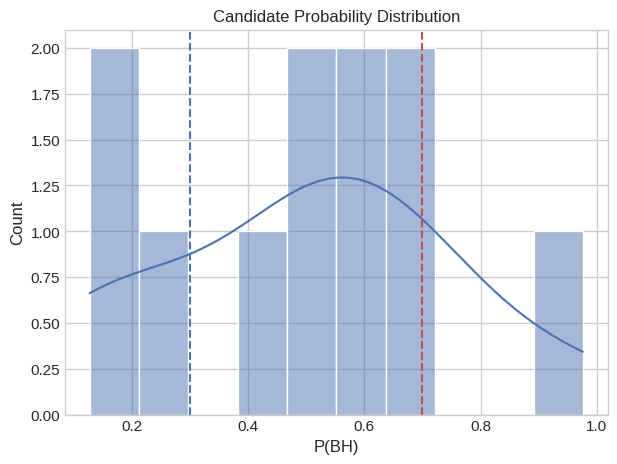

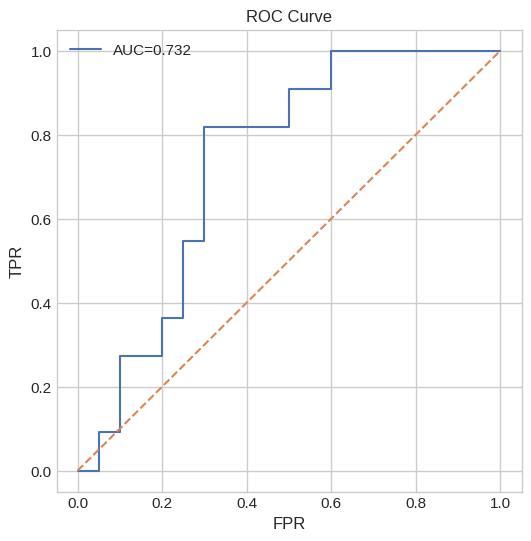

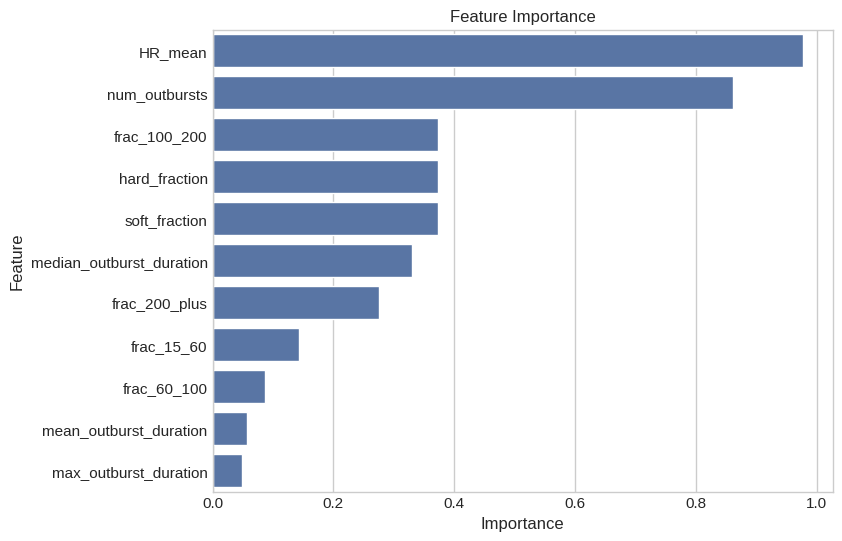

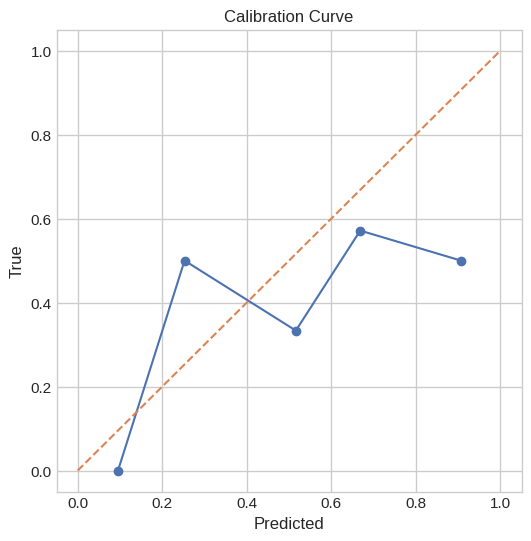


================ PIPELINE COMPLETE ================


In [ ]:



# ============================================================
# ☢️ DEFINE FEATURES (CRITICAL)
# ============================================================

FEATURES = [
    "hard_fraction",
    "soft_fraction",
    "HR_mean",
    "num_outbursts",
    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",
    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus"
]


# ============================================================
# ☢️ FEATURE EXTRACTION FUNCTION
# ============================================================

def extract_features(filepath):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD","I_total","err_I_total",
        "I_soft","err_I_soft",
        "I_mid","err_I_mid",
        "I_hard","err_I_hard"
    ]

    # ---------------- FILTERING ----------------
    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    # ---------------- HR ----------------
    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"]/df["I_soft"])**2 +
        (df["err_I_hard"]/df["I_hard"])**2
    )

    valid = (HR_err / HR) < 1

    HR = HR[valid].values
    I = df["I_total"][valid].values
    t = df["MJD"][valid].values

    # ---------------- STATE FRACTIONS ----------------
    hard = HR >= 0.2
    soft = HR < 0.2

    hard_fraction = np.sum(hard) / len(HR)
    soft_fraction = np.sum(soft) / len(HR)

    # ---------------- OUTBURSTS ----------------
    smooth = gaussian_filter1d(I, sigma=2)

    threshold = np.median(smooth) + 0.5*np.std(smooth)

    mask = smooth > threshold

    durations = []
    start = None

    for i in range(len(mask)):
        if mask[i] and start is None:
            start = t[i]
        elif not mask[i] and start is not None:
            durations.append(t[i-1] - start)
            start = None

    durations = np.array(durations)

    if len(durations) == 0:
        durations = np.array([0])

    # ---------------- REGION FRACTIONS ----------------
    frac_15_60 = np.mean((durations>=15)&(durations<60))
    frac_60_100 = np.mean((durations>=60)&(durations<100))
    frac_100_200 = np.mean((durations>=100)&(durations<200))
    frac_200_plus = np.mean(durations>=200)

    return {
        "hard_fraction": hard_fraction,
        "soft_fraction": soft_fraction,
        "HR_mean": np.mean(HR),
        "num_outbursts": len(durations),
        "mean_outburst_duration": np.mean(durations),
        "median_outburst_duration": np.median(durations),
        "max_outburst_duration": np.max(durations),
        "frac_15_60": frac_15_60,
        "frac_60_100": frac_60_100,
        "frac_100_200": frac_100_200,
        "frac_200_plus": frac_200_plus
    }


# ============================================================
# ☢️ LOAD TRAINING DATA
# ============================================================

train_df = df_final.copy()

X_train = train_df[FEATURES]
y_train = (train_df["label"]=="BH").astype(int)

print("\nTraining samples:", len(X_train))


# ============================================================
# ☢️ MODEL
# ============================================================

model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        class_weight="balanced",
        solver="liblinear",
        random_state=42
    ))
])


# ============================================================
# ☢️ LOOCV EVALUATION
# ============================================================

loo = LeaveOneOut()

y_proba = cross_val_predict(
    model, X_train, y_train,
    cv=loo,
    method="predict_proba"
)[:,1]

OPTIMAL_THRESHOLD = 0.56
y_pred = (y_proba >= OPTIMAL_THRESHOLD).astype(int)

print("\n================ MODEL PERFORMANCE ================")
print("Accuracy:", accuracy_score(y_train, y_pred))
print("ROC-AUC:", roc_auc_score(y_train, y_proba))


# ============================================================
# ☢️ TRAIN FINAL MODEL
# ============================================================

model.fit(X_train, y_train)


# ============================================================
# ☢️ LOAD CANDIDATES
# ============================================================

candidate_files = glob.glob("/content/raw_data/CBHS/*.csv")

cand_features = []
names = []

for f in candidate_files:
    cand_features.append(extract_features(f))
    names.append(f.split("/")[-1])

cand_df = pd.DataFrame(cand_features)
cand_df["source"] = names

X_cand = cand_df[FEATURES]


# ============================================================
# ☢️ PREDICTION
# ============================================================

probs = model.predict_proba(X_cand)[:,1]

cand_df["P(BH)"] = probs

def classify(p):
    if p > 0.7:
        return "Strong BH"
    elif p < 0.3:
        return "Strong NS"
    else:
        return "Ambiguous"

cand_df["Classification"] = cand_df["P(BH)"].apply(classify)

cand_df = cand_df.sort_values("P(BH)", ascending=False)

print("\n================ CANDIDATE RESULTS ================")
print(cand_df[["source","P(BH)","Classification"]])


# ============================================================
# ☢️ PLOT 1: PROBABILITY DISTRIBUTION
# ============================================================

plt.figure(figsize=(7,5))
sns.histplot(cand_df["P(BH)"], bins=10, kde=True)

plt.axvline(0.7, color='r', linestyle='--')
plt.axvline(0.3, color='b', linestyle='--')

plt.title("Candidate Probability Distribution")
plt.xlabel("P(BH)")
plt.show()


# ============================================================
# ☢️ PLOT 2: ROC CURVE
# ============================================================

fpr, tpr, _ = roc_curve(y_train, y_proba)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"AUC={roc_auc_score(y_train,y_proba):.3f}")
plt.plot([0,1],[0,1],'--')

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve")

plt.legend()
plt.show()


# ============================================================
# ☢️ PLOT 3: FEATURE IMPORTANCE
# ============================================================

coeff = model.named_steps["clf"].coef_[0]

imp = pd.DataFrame({
    "Feature": FEATURES,
    "Importance": np.abs(coeff)
}).sort_values("Importance", ascending=False)

plt.figure(figsize=(8,6))
sns.barplot(data=imp, x="Importance", y="Feature")

plt.title("Feature Importance")
plt.show()


# ============================================================
# ☢️ PLOT 4: CALIBRATION
# ============================================================

prob_true, prob_pred = calibration_curve(y_train, y_proba, n_bins=5)

plt.figure(figsize=(6,6))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0,1],[0,1],'--')

plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Calibration Curve")

plt.show()


# ============================================================
# ☢️ DONE
# ============================================================

print("\n================ PIPELINE COMPLETE ================")

#3rd iteration

#### Peak features using KDE

In [ ]:



# ============================================================
# FEATURE EXTRACTION FUNCTION (FINAL CORRECT VERSION)
# ============================================================

def extract_features(filepath, label):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD",
        "I_total",
        "err_I_total",
        "I_soft",
        "err_I_soft",
        "I_mid",
        "err_I_mid",
        "I_hard",
        "err_I_hard"
    ]

    # =========================
    # FILTERING (PAPER-ALIGNED)
    # =========================

    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    if len(df) < 10:
        return None

    # =========================
    # HARDNESS RATIO
    # =========================

    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"] / df["I_soft"])**2 +
        (df["err_I_hard"] / df["I_hard"])**2
    )

    valid = HR_err / HR < 1

    HR = HR[valid].values
    Intensity = df["I_total"][valid].values
    Err = df["err_I_total"][valid].values

    if len(HR) < 10:
        return None

    features = {}

    # ============================================================
    # 1. STATE FRACTIONS
    # ============================================================

    hard = np.sum(HR >= 0.2)
    soft = np.sum(HR < 0.2)

    total = len(HR)

    features["hard_fraction"] = hard / total
    features["soft_fraction"] = soft / total

    # ============================================================
    # 2. BASIC HR FEATURE
    # ============================================================

    features["HR_mean"] = np.mean(HR)

    # ============================================================
    # 🔥 3. KDE PEAK FEATURES (CORRECTED)
    # ============================================================

    try:
        if len(HR) > 20:

            # 🔥 LOG SCALE (VERY IMPORTANT)
            HR_log = np.log10(HR)

            # 🔥 CONTROLLED SMOOTHING
            kde = gaussian_kde(HR_log, bw_method=0.4)

            x_grid = np.linspace(min(HR_log), max(HR_log), 300)
            density = kde(x_grid)

            # 🔥 PEAK DETECTION (TUNED)
            peaks, properties = find_peaks(
                                            density,
                                            prominence=0.01,      # higher threshold
                                            distance=20           # avoid nearby fake peaks
                                        )

            num_peaks = len(peaks)
            features["num_peaks"] = num_peaks

            if num_peaks >= 2:
                peak_positions = np.sort(x_grid[peaks])

                features["peak_separation"] = peak_positions[-1] - peak_positions[0]

                prominences = properties["prominences"]
                features["peak_prominence"] = np.mean(prominences)

            else:
                features["peak_separation"] = 0
                features["peak_prominence"] = 0

        else:
            features["num_peaks"] = 0
            features["peak_separation"] = 0
            features["peak_prominence"] = 0

    except:
        features["num_peaks"] = 0
        features["peak_separation"] = 0
        features["peak_prominence"] = 0

    # ============================================================
    # 4. OUTBURST DETECTION
    # ============================================================

    smooth = gaussian_filter1d(Intensity, sigma=5)

    threshold = np.median(smooth) + 0.5 * np.mean(Err)

    above = smooth > threshold

    durations = []
    current = 0

    for val in above:
        if val:
            current += 1
        else:
            if current >= 15:
                durations.append(current)
            current = 0

    if current >= 15:
        durations.append(current)

    durations = np.array(durations)

    # ============================================================
    # 5. OUTBURST FEATURES
    # ============================================================

    if len(durations) > 0:

        features["mean_outburst_duration"] = np.mean(durations)
        features["median_outburst_duration"] = np.median(durations)
        features["max_outburst_duration"] = np.max(durations)
        features["num_outbursts"] = len(durations)

        r1 = np.sum((durations >= 15) & (durations < 60))
        r2 = np.sum((durations >= 60) & (durations < 100))
        r3 = np.sum((durations >= 100) & (durations < 200))
        r4 = np.sum(durations >= 200)

        total_d = len(durations)

        features["frac_15_60"] = r1 / total_d
        features["frac_60_100"] = r2 / total_d
        features["frac_100_200"] = r3 / total_d
        features["frac_200_plus"] = r4 / total_d

    else:
        features["mean_outburst_duration"] = 0
        features["median_outburst_duration"] = 0
        features["max_outburst_duration"] = 0
        features["num_outbursts"] = 0

        features["frac_15_60"] = 0
        features["frac_60_100"] = 0
        features["frac_100_200"] = 0
        features["frac_200_plus"] = 0

    # ============================================================
    # METADATA
    # ============================================================

    features["source"] = filepath.split("/")[-1].replace(".csv", "")
    features["label"] = label

    return features


# ============================================================
# BUILD DATASET
# ============================================================

all_features = []

for file in glob.glob("raw_data/BH/*.csv"):
    feat = extract_features(file, "BH")
    if feat:
        all_features.append(feat)

for file in glob.glob("raw_data/NS/*.csv"):
    feat = extract_features(file, "NS")
    if feat:
        all_features.append(feat)

df_final = pd.DataFrame(all_features)

print("\nDataset Created")



Dataset Created


In [ ]:
df_final

,hard_fraction,soft_fraction,HR_mean,num_peaks,peak_separation,peak_prominence,mean_outburst_duration,median_outburst_duration,max_outburst_duration,num_outbursts,frac_15_60,frac_60_100,frac_100_200,frac_200_plus,source,label
0,0.809249,0.190751,0.981302,1,0.000000,0.000000,41.500000,41.5,46,2,1.000000,0.000000,0.000000,0.000000,GS 1354-64day_all,BH
1,0.637255,0.362745,0.955600,2,0.952848,0.207809,40.000000,40.0,40,1,1.000000,0.000000,0.000000,0.000000,MAXI J1543-564day_all,BH
2,0.966197,0.033803,1.068287,2,0.704606,0.592558,164.000000,164.0,164,1,0.000000,0.000000,1.000000,0.000000,GRS 1716-249day_all,BH
3,0.645788,0.354212,0.641410,2,1.271627,0.303923,113.500000,108.0,159,4,0.000000,0.500000,0.500000,0.000000,GX 339-4,BH
4,0.703063,0.296937,0.408161,1,0.000000,0.000000,136.600000,122.0,225,5,0.000000,0.400000,0.400000,0.200000,GRS 1739-278.xlsx - J1742-277_g_lc_1day_all,BH
5,0.672131,0.327869,1.084064,1,0.000000,0.000000,67.000000,67.0,67,1,0.000000,1.000000,0.000000,0.000000,MAXI J1910-057 day_all,BH
6,0.899793,0.100207,1.002314,2,1.643402,0.398107,58.500000,40.0,137,4,0.750000,0.000000,0.250000,0.000000,XTEJ1752-223_g_lc_1day_all,BH
7,0.573535,0.426465,0.515575,1,0.000000,0.000000,139.666667,91.0,406,9,0.111111,0.444444,0.222222,0.222222,4U 1630-472. J1634-473l,BH
8,0.714286,0.285714,1.049892,2,1.546488,0.245922,65.500000,65.5,92,2,0.500000,0.500000,0.000000,0.000000,MAXI J1348-632l,BH
9,0.625899,0.374101,1.099317,2,2.385185,0.161127,67.000000,67.0,67,1,0.000000,1.000000,0.000000,0.000000,4U 1543-475day_all,BH


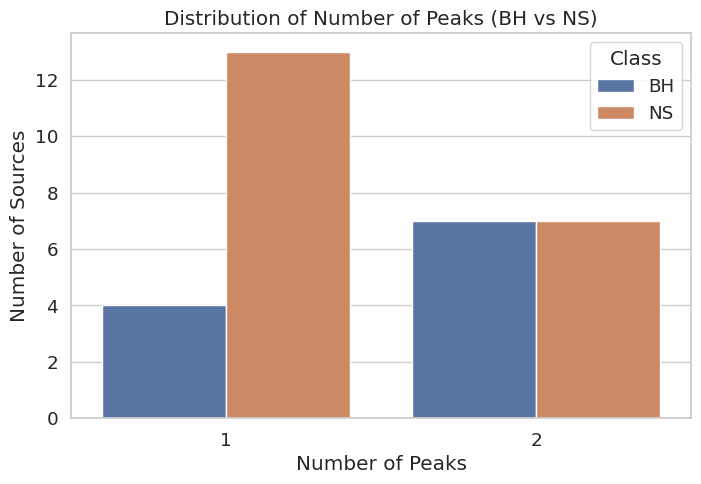


================ PEAK DISTRIBUTION TABLE ================

num_peaks         1         2
label                        
BH         0.363636  0.636364
NS         0.650000  0.350000


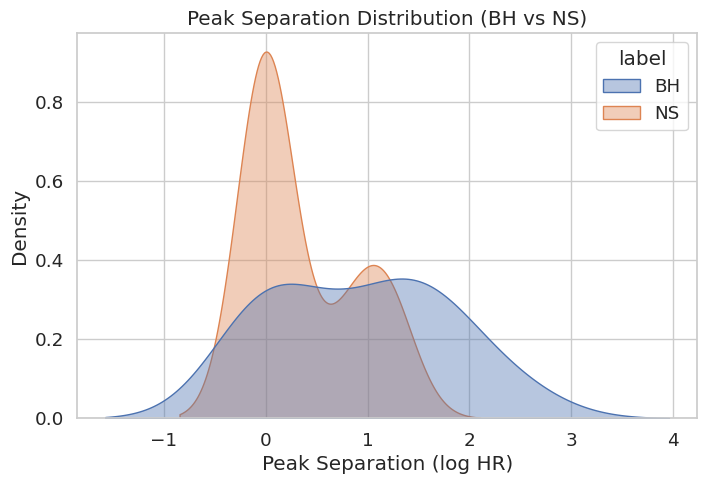

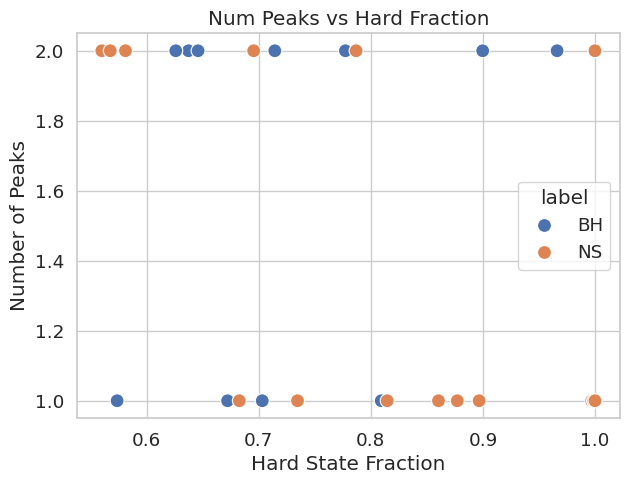

In [ ]:
# Ensure clean style
sns.set(style="whitegrid", font_scale=1.2)

# ============================================================
# 1. COUNT DISTRIBUTION (BAR PLOT)
# ============================================================

plt.figure(figsize=(8,5))

sns.countplot(
    data=df_final,
    x="num_peaks",
    hue="label"
)

plt.title("Distribution of Number of Peaks (BH vs NS)")
plt.xlabel("Number of Peaks")
plt.ylabel("Number of Sources")

plt.legend(title="Class")

plt.show()


# ============================================================
# 2. FRACTION TABLE (VERY IMPORTANT FOR INTERPRETATION)
# ============================================================

print("\n================ PEAK DISTRIBUTION TABLE ================\n")

table = pd.crosstab(df_final["label"], df_final["num_peaks"], normalize="index")

print(table)


# ============================================================
# 3. KDE PLOT OF PEAK SEPARATION (OPTIONAL)
# ============================================================

plt.figure(figsize=(8,5))

sns.kdeplot(
    data=df_final,
    x="peak_separation",
    hue="label",
    fill=True,
    common_norm=False,
    alpha=0.4
)

plt.title("Peak Separation Distribution (BH vs NS)")
plt.xlabel("Peak Separation (log HR)")
plt.ylabel("Density")

plt.show()


# ============================================================
# 4. SCATTER: PEAKS VS HARD FRACTION
# ============================================================

plt.figure(figsize=(7,5))

sns.scatterplot(
    data=df_final,
    x="hard_fraction",
    y="num_peaks",
    hue="label",
    s=100
)

plt.title("Num Peaks vs Hard Fraction")
plt.xlabel("Hard State Fraction")
plt.ylabel("Number of Peaks")

plt.show()

Dataset size: 31

========== LR ==========
Best Threshold: 0.852
Optimized Accuracy: 0.71
Bootstrap: 0.753 +/- 0.042

========== SVM ==========
Best Threshold: inf
Optimized Accuracy: 0.645
Bootstrap: 0.645 +/- 0.0

========== KNN ==========
Best Threshold: inf
Optimized Accuracy: 0.645
Bootstrap: 0.645 +/- 0.0

Final Results:
  Model  Accuracy           Std
0    LR  0.709677  4.183407e-02
1   SVM  0.645161  1.110223e-16
2   KNN  0.645161  1.110223e-16


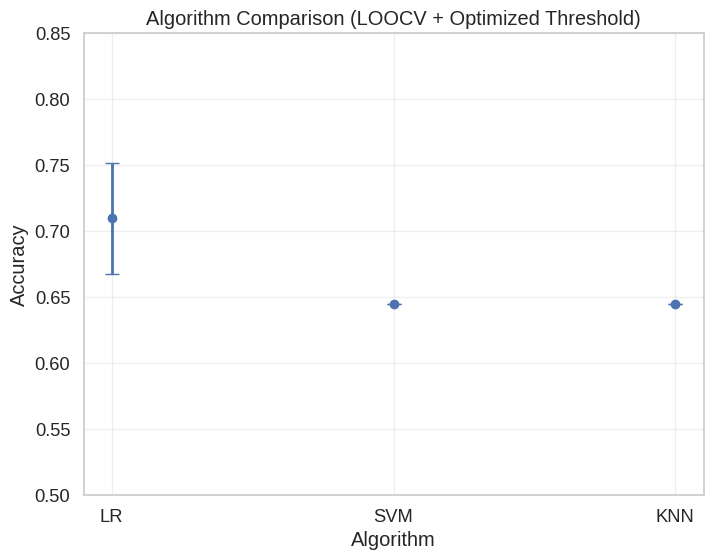

In [ ]:
# ============================================================
# PUBLICATION-QUALITY MODEL COMPARISON PLOT
# (LR, SVM, KNN with optimized threshold + bootstrap error bars)
# ============================================================


# ============================================================
# LOAD DATA
# ============================================================

df = df_final.copy() # Changed to use df_final from memory

df = df[df["label"].isin(["BH","NS"])].reset_index(drop=True)

X = df.drop(columns=["label","source"])
y = (df["label"]=="BH").astype(int)

print("Dataset size:", len(df))


# ============================================================
# DEFINE MODELS
# ============================================================

models = {

    "LR": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            class_weight="balanced",
            solver="liblinear",
            random_state=42
        ))
    ]),

    "SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="linear",
            probability=True,
            class_weight="balanced",
            random_state=42
        ))
    ]),

    "KNN": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", KNeighborsClassifier(n_neighbors=5))
    ])
}


# ============================================================
# FUNCTION: FIND BEST THRESHOLD
# ============================================================

def find_best_threshold(y_true, y_proba):

    fpr, tpr, thresholds = roc_curve(y_true, y_proba)

    best_acc = 0
    best_thresh = 0.5

    for t in thresholds:
        preds = (y_proba >= t).astype(int)
        acc = accuracy_score(y_true, preds)

        if acc > best_acc:
            best_acc = acc
            best_thresh = t

    return best_thresh, best_acc


# ============================================================
# FUNCTION: BOOTSTRAP ERROR
# ============================================================

def bootstrap_accuracy(model, X, y, threshold, n_iter=500):

    scores = []

    for _ in range(n_iter):

        idx = np.random.choice(len(X), len(X), replace=True)

        Xb = X.iloc[idx]
        yb = y.iloc[idx]

        if len(np.unique(yb)) < 2:
            continue

        model.fit(Xb, yb)

        prob = model.predict_proba(X)[:,1]
        pred = (prob >= threshold).astype(int)

        scores.append(accuracy_score(y, pred))

    return np.mean(scores), np.std(scores)


# ============================================================
# MAIN LOOP
# ============================================================

loo = LeaveOneOut()

results = []

for name, model in models.items():

    print(f"\n========== {name} ==========")

    # LOOCV probabilities
    y_proba = cross_val_predict(
        model, X, y,
        cv=loo,
        method="predict_proba"
    )[:,1]

    # Find best threshold
    best_thresh, best_acc = find_best_threshold(y, y_proba)

    print("Best Threshold:", round(best_thresh,3))
    print("Optimized Accuracy:", round(best_acc,3))

    # Bootstrap error bars
    model.fit(X, y)
    mean_acc, std_acc = bootstrap_accuracy(model, X, y, best_thresh)

    print("Bootstrap:", round(mean_acc,3), "+/-", round(std_acc,3))

    results.append({
        "Model": name,
        "Accuracy": best_acc,
        "Std": std_acc
    })


# ============================================================
# CREATE DATAFRAME
# ============================================================

results_df = pd.DataFrame(results)

print("\nFinal Results:")
print(results_df)


# ============================================================
# PLOT (PUBLICATION STYLE)
# ============================================================

plt.figure(figsize=(8,6))

plt.errorbar(
    results_df["Model"],
    results_df["Accuracy"],
    yerr=results_df["Std"],
    fmt='o',
    capsize=5,
    linewidth=2
)

plt.ylabel("Accuracy")
plt.xlabel("Algorithm")
plt.title("Algorithm Comparison (LOOCV + Optimized Threshold)")

plt.ylim(0.5, 0.85)

plt.grid(alpha=0.3)
plt.style.use("seaborn-v0_8-whitegrid")

plt.show()

In [ ]:



# ============================================================
# DATA
# ============================================================

df = df_final.copy()

# ============================================================
# 🔥 FINAL FEATURE SET (CORE + PEAK FEATURES)
# ============================================================

features = [

    # -------------------------
    # CORE PHYSICS FEATURES
    # -------------------------
    "hard_fraction",
    "soft_fraction",
    "HR_mean",

    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",

    "num_outbursts",

    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus",

    # -------------------------
    # 🔥 NEW PEAK FEATURES
    # -------------------------
    "num_peaks",
    "peak_separation",
    "peak_prominence",
 ]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# MODEL
# ============================================================

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        solver="liblinear",
        class_weight="balanced",
        random_state=42
    ))
])


# ============================================================
# LOOCV
# ============================================================

loo = LeaveOneOut()

y_pred = cross_val_predict(pipeline, X, y, cv=loo)

y_proba = cross_val_predict(
    pipeline,
    X,
    y,
    cv=loo,
    method="predict_proba"
)[:, 1]


# ============================================================
# BASE RESULTS
# ============================================================

print("\n================ BASE RESULTS ================")

print("Accuracy:", accuracy_score(y, y_pred))
print("ROC-AUC:", roc_auc_score(y, y_proba))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

print("\nClassification Report:")
print(classification_report(y, y_pred, target_names=["NS", "BH"]))


# ============================================================
# 🔥 THRESHOLD OPTIMIZATION (Youden’s J)
# ============================================================

fpr, tpr, thresholds = roc_curve(y, y_proba)

j_scores = tpr - fpr
best_idx = np.argmax(j_scores)

best_threshold = thresholds[best_idx]

print("\n================ THRESHOLD OPTIMIZATION ================")
print("Best Threshold:", best_threshold)


# Apply threshold
y_pred_opt = (y_proba >= best_threshold).astype(int)

print("\nResults with Optimized Threshold:")

print("Accuracy:", accuracy_score(y, y_pred_opt))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred_opt))

print("\nClassification Report:")
print(classification_report(y, y_pred_opt, target_names=["NS", "BH"]))


# ============================================================
# TRAIN FINAL MODEL
# ============================================================

pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP
# ============================================================

bootstrap_scores = []

for _ in range(1000):

    idx = np.random.choice(len(X), len(X), replace=True)

    Xb = X.iloc[idx]
    yb = y.iloc[idx]

    if len(np.unique(yb)) < 2:
        continue

    pipeline.fit(Xb, yb)

    pred = pipeline.predict(X)

    score = accuracy_score(y, pred)

    bootstrap_scores.append(score)

print("\n================ BOOTSTRAP RESULTS ================")
print("Accuracy:", np.mean(bootstrap_scores),
      "+/-", np.std(bootstrap_scores))


# ============================================================
# FEATURE IMPORTANCE (INTERPRETABLE)
# ============================================================

coeffs = pipeline.named_steps["model"].coef_[0]

coef_df = pd.DataFrame({
    "Feature": features,
    "Coefficient": coeffs,
    "Abs Importance": np.abs(coeffs)
}).sort_values("Abs Importance", ascending=False)

print("\n================ FEATURE COEFFICIENTS ================")
print(coef_df)


# ============================================================
# EXTRA: SORT BY PHYSICAL INTERPRETATION
# ============================================================

print("\nTop Important Features:")
print(coef_df.head(8))


# ============================================================
# DONE
# ============================================================

print("\nPipeline Complete.")


================ BASE RESULTS ================
Accuracy: 0.5483870967741935
ROC-AUC: 0.6727272727272727

Confusion Matrix:
[[11  9]
 [ 5  6]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.69      0.55      0.61        20
          BH       0.40      0.55      0.46        11

    accuracy                           0.55        31
   macro avg       0.54      0.55      0.54        31
weighted avg       0.59      0.55      0.56        31


================ THRESHOLD OPTIMIZATION ================
Best Threshold: 0.3046044509682431

Results with Optimized Threshold:
Accuracy: 0.6451612903225806

Confusion Matrix:
[[10 10]
 [ 1 10]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.91      0.50      0.65        20
          BH       0.50      0.91      0.65        11

    accuracy                           0.65        31
   macro avg       0.70      0.70      0.65        31
weighted avg   

In [ ]:


# ============================================================
# DATA
# ============================================================

df = df_final.copy()

features = [

    # -------------------------
    # CORE FEATURES
    # -------------------------
    "hard_fraction",
    "soft_fraction",
    "HR_mean",

    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",

    "num_outbursts",

    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus",

    # -------------------------
    # ONLY PEAK FEATURE
    # -------------------------
    "num_peaks"
]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# MODEL
# ============================================================

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        solver="liblinear",
        class_weight="balanced",
        random_state=42
    ))
])


# ============================================================
# LOOCV
# ============================================================

loo = LeaveOneOut()

y_pred = cross_val_predict(pipeline, X, y, cv=loo)

y_proba = cross_val_predict(
    pipeline,
    X,
    y,
    cv=loo,
    method="predict_proba"
)[:, 1]


# ============================================================
# BASE RESULTS
# ============================================================

print("\n================ BASE RESULTS ================")

print("Accuracy:", accuracy_score(y, y_pred))
print("ROC-AUC:", roc_auc_score(y, y_proba))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

print("\nClassification Report:")
print(classification_report(y, y_pred, target_names=["NS", "BH"]))


# ============================================================
# THRESHOLD OPTIMIZATION
# ============================================================

fpr, tpr, thresholds = roc_curve(y, y_proba)

j_scores = tpr - fpr
best_idx = np.argmax(j_scores)
best_threshold = thresholds[best_idx]

print("\n================ THRESHOLD OPTIMIZATION ================")
print("Best Threshold:", best_threshold)

y_pred_opt = (y_proba >= best_threshold).astype(int)

print("\nOptimized Accuracy:", accuracy_score(y, y_pred_opt))


# ============================================================
# FINAL MODEL
# ============================================================

pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP
# ============================================================

bootstrap_scores = []

for _ in range(500):

    idx = np.random.choice(len(X), len(X), replace=True)

    Xb = X.iloc[idx]
    yb = y.iloc[idx]

    if len(np.unique(yb)) < 2:
        continue

    pipeline.fit(Xb, yb)

    pred = pipeline.predict(X)
    bootstrap_scores.append(accuracy_score(y, pred))

print("\n================ BOOTSTRAP RESULTS ================")
print("Accuracy:", np.mean(bootstrap_scores),
      "+/-", np.std(bootstrap_scores))


# ============================================================
# FEATURE IMPORTANCE
# ============================================================

coeffs = pipeline.named_steps["model"].coef_[0]

coef_df = pd.DataFrame({
    "Feature": features,
    "Coefficient": coeffs,
    "Abs Importance": np.abs(coeffs)
}).sort_values("Abs Importance", ascending=False)

print("\n================ FEATURE IMPORTANCE ================")
print(coef_df)


print("\nPipeline Complete.")


================ BASE RESULTS ================
Accuracy: 0.6129032258064516
ROC-AUC: 0.6727272727272727

Confusion Matrix:
[[11  9]
 [ 3  8]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.79      0.55      0.65        20
          BH       0.47      0.73      0.57        11

    accuracy                           0.61        31
   macro avg       0.63      0.64      0.61        31
weighted avg       0.67      0.61      0.62        31


================ THRESHOLD OPTIMIZATION ================
Best Threshold: 0.5783677900433748

Optimized Accuracy: 0.6774193548387096

================ BOOTSTRAP RESULTS ================
Accuracy: 0.7598064516129032 +/- 0.04403059195713513

================ FEATURE IMPORTANCE ================
                     Feature  Coefficient  Abs Importance
11                 num_peaks     1.276976        1.276976
2                    HR_mean    -1.038206        1.038206
7                 frac_15_60    -0.7866

In [ ]:
# ============================================================
# FINAL MODEL (CLEAN FEATURES: no soft_fraction, no peak_position)
# ============================================================


# ============================================================
# DATA
# ============================================================

df = df_final.copy()

features = [

    # -------------------------
    # CORE FEATURES
    # -------------------------
    "hard_fraction",
    "HR_mean",

    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",

    "num_outbursts",

    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus",

    # -------------------------
    # PEAK FEATURE
    # -------------------------
    "num_peaks"
]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# MODEL
# ============================================================

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        solver="liblinear",
        class_weight="balanced",
        random_state=42
    ))
])


# ============================================================
# LOOCV
# ============================================================

loo = LeaveOneOut()

y_pred = cross_val_predict(pipeline, X, y, cv=loo)

y_proba = cross_val_predict(
    pipeline,
    X,
    y,
    cv=loo,
    method="predict_proba"
)[:, 1]


# ============================================================
# BASE RESULTS
# ============================================================

print("\n================ BASE RESULTS ================")

print("Accuracy:", accuracy_score(y, y_pred))
print("ROC-AUC:", roc_auc_score(y, y_proba))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

print("\nClassification Report:")
print(classification_report(y, y_pred, target_names=["NS", "BH"]))


# ============================================================
# THRESHOLD OPTIMIZATION
# ============================================================

fpr, tpr, thresholds = roc_curve(y, y_proba)

j_scores = tpr - fpr
best_idx = np.argmax(j_scores)
best_threshold = thresholds[best_idx]

print("\n================ THRESHOLD OPTIMIZATION ================")
print("Best Threshold:", best_threshold)


y_pred_opt = (y_proba >= best_threshold).astype(int)

print("\nOptimized Accuracy:", accuracy_score(y, y_pred_opt))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred_opt))

print("\nClassification Report:")
print(classification_report(y, y_pred_opt, target_names=["NS", "BH"]))


# ============================================================
# FINAL MODEL TRAIN
# ============================================================

pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP
# ============================================================

bootstrap_scores = []

for _ in range(500):

    idx = np.random.choice(len(X), len(X), replace=True)

    Xb = X.iloc[idx]
    yb = y.iloc[idx]

    if len(np.unique(yb)) < 2:
        continue

    pipeline.fit(Xb, yb)

    pred = pipeline.predict(X)
    bootstrap_scores.append(accuracy_score(y, pred))

print("\n================ BOOTSTRAP RESULTS ================")
print("Accuracy:", np.mean(bootstrap_scores),
      "+/-", np.std(bootstrap_scores))


# ============================================================
# FEATURE IMPORTANCE
# ============================================================

coeffs = pipeline.named_steps["model"].coef_[0]

coef_df = pd.DataFrame({
    "Feature": features,
    "Coefficient": coeffs,
    "Abs Importance": np.abs(coeffs)
}).sort_values("Abs Importance", ascending=False)

print("\n================ FEATURE IMPORTANCE ================")
print(coef_df)


print("\nPipeline Complete.")


================ BASE RESULTS ================
Accuracy: 0.6451612903225806
ROC-AUC: 0.6727272727272727

Confusion Matrix:
[[12  8]
 [ 3  8]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.80      0.60      0.69        20
          BH       0.50      0.73      0.59        11

    accuracy                           0.65        31
   macro avg       0.65      0.66      0.64        31
weighted avg       0.69      0.65      0.65        31


================ THRESHOLD OPTIMIZATION ================
Best Threshold: 0.23050278699387083

Optimized Accuracy: 0.6451612903225806

Confusion Matrix:
[[10 10]
 [ 1 10]]

Classification Report:
              precision    recall  f1-score   support

          NS       0.91      0.50      0.65        20
          BH       0.50      0.91      0.65        11

    accuracy                           0.65        31
   macro avg       0.70      0.70      0.65        31
weighted avg       0.76      0.65     


Training samples: 31

================ MODEL PERFORMANCE ================
Accuracy: 0.6774193548387096
ROC-AUC: 0.6727272727272727

================ CANDIDATE RESULTS ================
                                               source     P(BH) Classification
5   bhc_MAXI J1305-704.xlsx - J1306-704_g_lc_1day_...  0.949013      Strong BH
3   bhc_MAXI J1803-298.xlsx - J1803-298_g_lc_1day_...  0.932893      Strong BH
6   bhc_EXO 1846-031.xlsx - J1849-030_g_lc_1day_al...  0.735614      Strong BH
8   bhc_MAXI J1535-571.xlsx - J1535-572_g_lc_1day_...  0.666861      Ambiguous
10  bh_GRS 1739-278.xlsx - J1742-277_g_lc_1day_all...  0.478207      Ambiguous
0   bhc_Swift J1728.9-3613.xlsx - J1728-362_g_lc_1...  0.450398      Ambiguous
4   bhc_MAXI J1848-015.xlsx - J1848-014_g_lc_1day_...  0.415028      Ambiguous
2   bhc_MAXI J1659-152.xlsx - J1659-152_g_lc_1day_...  0.355119      Ambiguous
1    bhc_MAXI J1631-479.xlsx - J1631-478_g_lc_1day...  0.351635      Ambiguous
7   bhc_H 1743-322.xlsx -

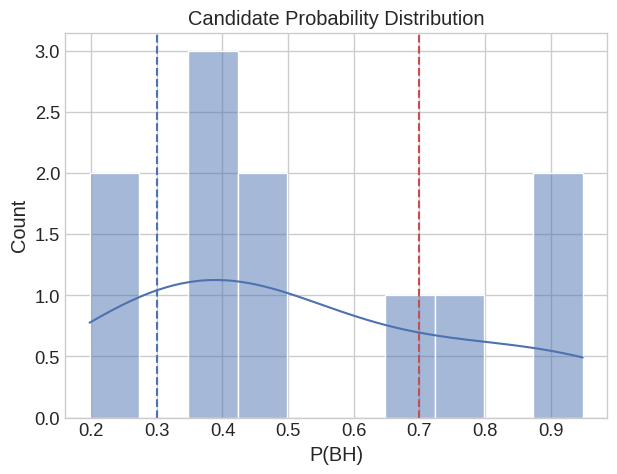

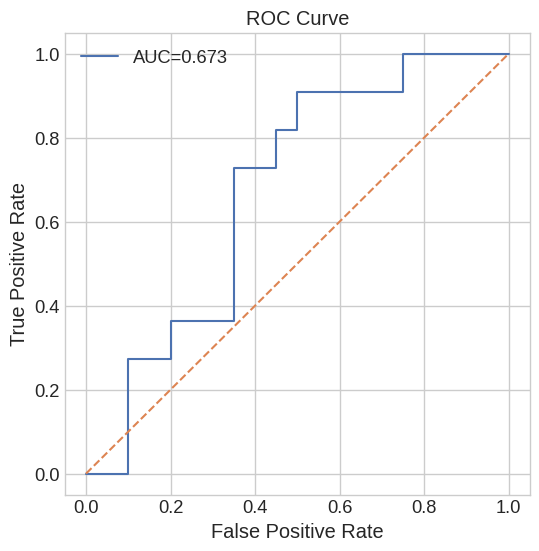

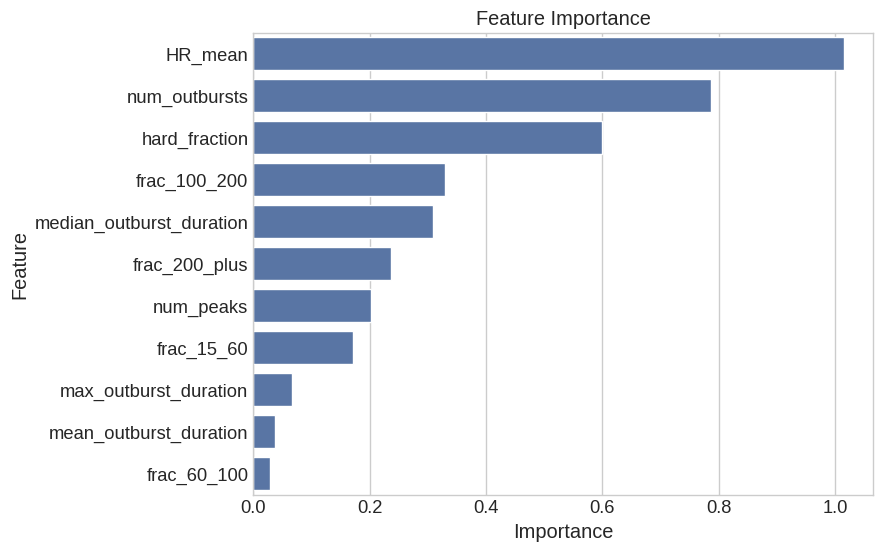

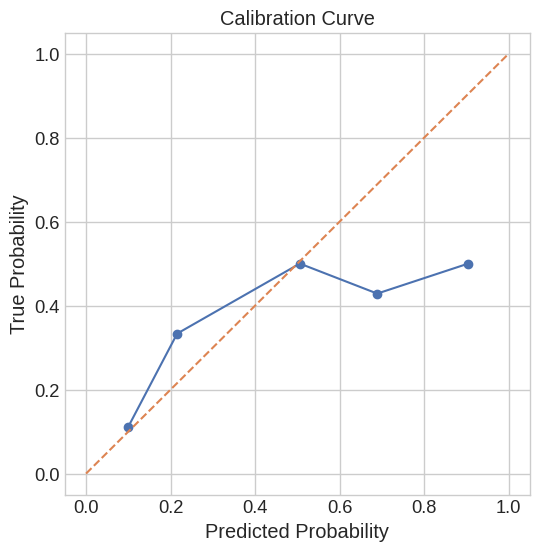


================ PIPELINE COMPLETE ================


In [ ]:
# ============================================================
# FINAL PUBLICATION PIPELINE (UPDATED WITH num_peaks)
# ============================================================


# ============================================================
# FEATURES
# ============================================================

FEATURES = [
    "hard_fraction",
    "HR_mean",
    "num_outbursts",
    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",
    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus",
    "num_peaks"   # ⭐ NEW
]


# ============================================================
# FEATURE EXTRACTION FUNCTION
# ============================================================

def extract_features(filepath):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD","I_total","err_I_total",
        "I_soft","err_I_soft",
        "I_mid","err_I_mid",
        "I_hard","err_I_hard"
    ]

    # ---------------- FILTERING ----------------
    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    if len(df) < 20:
        return None

    # ---------------- HARDNESS ----------------
    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"]/df["I_soft"])**2 +
        (df["err_I_hard"]/df["I_hard"])**2
    )

    valid = (HR_err / HR) < 1

    HR = HR[valid].values
    I = df["I_total"][valid].values
    t = df["MJD"][valid].values

    if len(HR) < 20:
        return None

    # ---------------- STATE FRACTION ----------------
    hard_fraction = np.mean(HR >= 0.2)

    # ---------------- OUTBURST DETECTION ----------------
    smooth = gaussian_filter1d(I, sigma=2)

    threshold = np.median(smooth) + 0.5*np.std(smooth)

    mask = smooth > threshold

    durations = []
    start = None

    for i in range(len(mask)):
        if mask[i] and start is None:
            start = t[i]
        elif not mask[i] and start is not None:
            durations.append(t[i-1] - start)
            start = None

    if start is not None:
        durations.append(t[-1] - start)

    durations = np.array(durations)

    if len(durations) == 0:
        durations = np.array([0])

    # ---------------- REGION FRACTIONS ----------------
    frac_15_60 = np.mean((durations>=15)&(durations<60))
    frac_60_100 = np.mean((durations>=60)&(durations<100))
    frac_100_200 = np.mean((durations>=100)&(durations<200))
    frac_200_plus = np.mean(durations>=200)

    # ---------------- PEAK FEATURE ----------------
    hist, bins = np.histogram(HR, bins=30)
    peaks, _ = find_peaks(hist, height=np.max(hist)*0.2, distance=2)
    num_peaks = len(peaks)

    return {
        "hard_fraction": hard_fraction,
        "HR_mean": np.mean(HR),
        "num_outbursts": len(durations),
        "mean_outburst_duration": np.mean(durations),
        "median_outburst_duration": np.median(durations),
        "max_outburst_duration": np.max(durations),
        "frac_15_60": frac_15_60,
        "frac_60_100": frac_60_100,
        "frac_100_200": frac_100_200,
        "frac_200_plus": frac_200_plus,
        "num_peaks": num_peaks
    }


# ============================================================
# LOAD TRAINING DATA
# ============================================================

train_df = df_final.copy()

X_train = train_df[FEATURES]
y_train = (train_df["label"]=="BH").astype(int)

print("\nTraining samples:", len(X_train))


# ============================================================
# MODEL
# ============================================================

model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        class_weight="balanced",
        solver="liblinear",
        random_state=42
    ))
])


# ============================================================
# LOOCV
# ============================================================

loo = LeaveOneOut()

y_proba = cross_val_predict(
    model, X_train, y_train,
    cv=loo,
    method="predict_proba"
)[:,1]

OPTIMAL_THRESHOLD = 0.56
y_pred = (y_proba >= OPTIMAL_THRESHOLD).astype(int)

print("\n================ MODEL PERFORMANCE ================")
print("Accuracy:", accuracy_score(y_train, y_pred))
print("ROC-AUC:", roc_auc_score(y_train, y_proba))


# ============================================================
# TRAIN FINAL MODEL
# ============================================================

model.fit(X_train, y_train)


# ============================================================
# LOAD CANDIDATES
# ============================================================

candidate_files = glob.glob("/content/raw_data/CBHS/*.csv")

cand_features = []
names = []

for f in candidate_files:
    feat = extract_features(f)
    if feat:
        cand_features.append(feat)
        names.append(f.split("/")[-1])

cand_df = pd.DataFrame(cand_features)
cand_df["source"] = names

X_cand = cand_df[FEATURES]


# ============================================================
# PREDICTION
# ============================================================

probs = model.predict_proba(X_cand)[:,1]

cand_df["P(BH)"] = probs

def classify(p):
    if p > 0.7:
        return "Strong BH"
    elif p < 0.3:
        return "Strong NS"
    else:
        return "Ambiguous"

cand_df["Classification"] = cand_df["P(BH)"].apply(classify)

cand_df = cand_df.sort_values("P(BH)", ascending=False)

print("\n================ CANDIDATE RESULTS ================")
print(cand_df[["source","P(BH)","Classification"]])


# ============================================================
# PLOT 1: PROBABILITY DISTRIBUTION
# ============================================================

plt.figure(figsize=(7,5))
sns.histplot(cand_df["P(BH)"], bins=10, kde=True)

plt.axvline(0.7, color='r', linestyle='--')
plt.axvline(0.3, color='b', linestyle='--')

plt.title("Candidate Probability Distribution")
plt.xlabel("P(BH)")
plt.show()


# ============================================================
# PLOT 2: ROC CURVE
# ============================================================

fpr, tpr, _ = roc_curve(y_train, y_proba)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"AUC={roc_auc_score(y_train,y_proba):.3f}")
plt.plot([0,1],[0,1],'--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")

plt.legend()
plt.show()


# ============================================================
# PLOT 3: FEATURE IMPORTANCE
# ============================================================

coeff = model.named_steps["clf"].coef_[0]

imp = pd.DataFrame({
    "Feature": FEATURES,
    "Importance": np.abs(coeff)
}).sort_values("Importance", ascending=False)

plt.figure(figsize=(8,6))
sns.barplot(data=imp, x="Importance", y="Feature")

plt.title("Feature Importance")
plt.show()


# ============================================================
# PLOT 4: CALIBRATION CURVE
# ============================================================

prob_true, prob_pred = calibration_curve(y_train, y_proba, n_bins=5)

plt.figure(figsize=(6,6))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0,1],[0,1],'--')

plt.xlabel("Predicted Probability")
plt.ylabel("True Probability")
plt.title("Calibration Curve")

plt.show()


# ============================================================
# DONE
# ============================================================

print("\n================ PIPELINE COMPLETE ================")

# Final iteration

In [ ]:



# ============================================================
# FEATURE EXTRACTION FUNCTION (PAPER-ALIGNED)
# ============================================================

def extract_features(filepath, label):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD",
        "I_total",
        "err_I_total",
        "I_soft",
        "err_I_soft",
        "I_mid",
        "err_I_mid",
        "I_hard",
        "err_I_hard"
    ]

    # =========================
    # PAPER FILTERING RULES
    # =========================

    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    if len(df) < 10:
        return None

    # =========================
    # HARDNESS RATIO
    # =========================

    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"] / df["I_soft"])**2 +
        (df["err_I_hard"] / df["I_hard"])**2
    )

    valid = HR_err / HR < 1

    HR = HR[valid].values
    Intensity = df["I_total"][valid].values
    Err = df["err_I_total"][valid].values

    if len(HR) < 10:
        return None

    features = {}

    # ============================================================
    # 1. STATE FRACTIONS
    # ============================================================

    hard = np.sum(HR >= 0.2)
    soft = np.sum(HR < 0.2)

    total = len(HR)

    features["hard_fraction"] = hard / total
    features["soft_fraction"] = soft / total

    # ============================================================
    # 2. BASIC HR FEATURE
    # ============================================================

    features["HR_mean"] = np.mean(HR)

    # ============================================================
    # 3. OUTBURST DETECTION (CORRECTED)
    # ============================================================

    # Gaussian smoothing (paper-inspired)
    smooth = gaussian_filter1d(Intensity, sigma=5)

    # 🔥 CORRECTED dynamic threshold (paper-aligned)
    threshold = np.median(smooth) + 0.5 * np.mean(Err)

    above = smooth > threshold

    durations = []
    current = 0

    for val in above:
        if val:
            current += 1
        else:
            if current >= 15:
                durations.append(current)
            current = 0

    if current >= 15:
        durations.append(current)

    durations = np.array(durations)

    # ============================================================
    # 4. OUTBURST FEATURES
    # ============================================================

    if len(durations) > 0:

        features["mean_outburst_duration"] = np.mean(durations)
        features["median_outburst_duration"] = np.median(durations)
        features["max_outburst_duration"] = np.max(durations)
        features["num_outbursts"] = len(durations)

        # Region fractions
        r1 = np.sum((durations >= 15) & (durations < 60))
        r2 = np.sum((durations >= 60) & (durations < 100))
        r3 = np.sum((durations >= 100) & (durations < 200))
        r4 = np.sum(durations >= 200)

        total_d = len(durations)

        features["frac_15_60"] = r1 / total_d
        features["frac_60_100"] = r2 / total_d
        features["frac_100_200"] = r3 / total_d
        features["frac_200_plus"] = r4 / total_d

    else:
        features["mean_outburst_duration"] = 0
        features["median_outburst_duration"] = 0
        features["max_outburst_duration"] = 0
        features["num_outbursts"] = 0

        features["frac_15_60"] = 0
        features["frac_60_100"] = 0
        features["frac_100_200"] = 0
        features["frac_200_plus"] = 0

    # ============================================================
    # METADATA
    # ============================================================

    features["source"] = filepath.split("/")[-1].replace(".csv", "")
    features["label"] = label

    return features


# ============================================================
# BUILD DATASET
# ============================================================

all_features = []

for file in glob.glob("raw_data/BH/*.csv"):
    feat = extract_features(file, "BH")
    if feat:
        all_features.append(feat)

for file in glob.glob("raw_data/NS/*.csv"):
    feat = extract_features(file, "NS")
    if feat:
        all_features.append(feat)

df_final = pd.DataFrame(all_features)

print("\nDataset Created")



Dataset Created


In [ ]:
df_final.head()


,hard_fraction,soft_fraction,HR_mean,mean_outburst_duration,median_outburst_duration,max_outburst_duration,num_outbursts,frac_15_60,frac_60_100,frac_100_200,frac_200_plus,source,label
0,0.714286,0.285714,1.049892,65.500000,65.5,92,2,0.500000,0.500000,0.000000,0.000000,MAXI J1348-632l,BH
1,0.637255,0.362745,0.955600,40.000000,40.0,40,1,1.000000,0.000000,0.000000,0.000000,MAXI J1543-564day_all,BH
2,0.672131,0.327869,1.084064,67.000000,67.0,67,1,0.000000,1.000000,0.000000,0.000000,MAXI J1910-057 day_all,BH
3,0.625899,0.374101,1.099317,67.000000,67.0,67,1,0.000000,1.000000,0.000000,0.000000,4U 1543-475day_all,BH
4,0.573535,0.426465,0.515575,139.666667,91.0,406,9,0.111111,0.444444,0.222222,0.222222,4U 1630-472. J1634-473l,BH


In [ ]:
# df_final.head()

Dataset size: 31

========== LR ==========
ROC-AUC: 0.732
Best Threshold: 0.562
Optimized Accuracy: 0.742
Bootstrap: 0.756 +/- 0.046

========== SVM ==========
ROC-AUC: 0.641
Best Threshold: 0.511
Optimized Accuracy: 0.677
Bootstrap: 0.714 +/- 0.074

========== KNN ==========
ROC-AUC: 0.67
Best Threshold: inf
Optimized Accuracy: 0.645
Bootstrap: 0.645 +/- 0.0

Final Results:
  Model  Accuracy           Std   ROC_AUC
0    LR  0.741935  4.624128e-02  0.731818
1   SVM  0.677419  7.392037e-02  0.640909
2   KNN  0.645161  1.110223e-16  0.670455


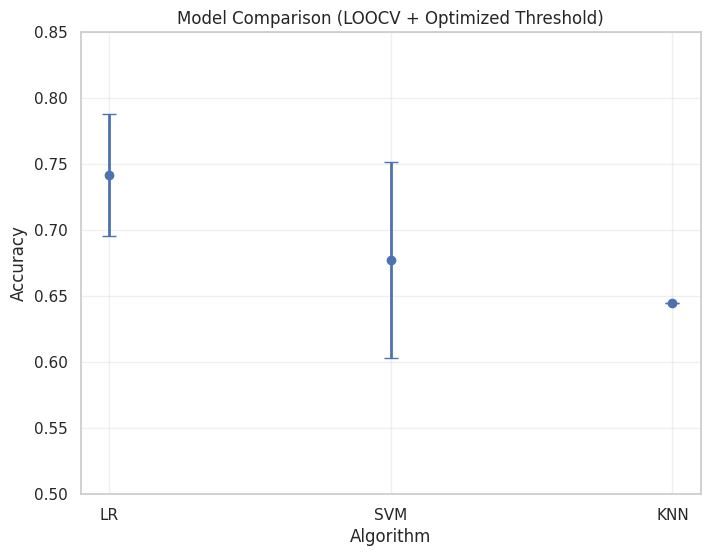

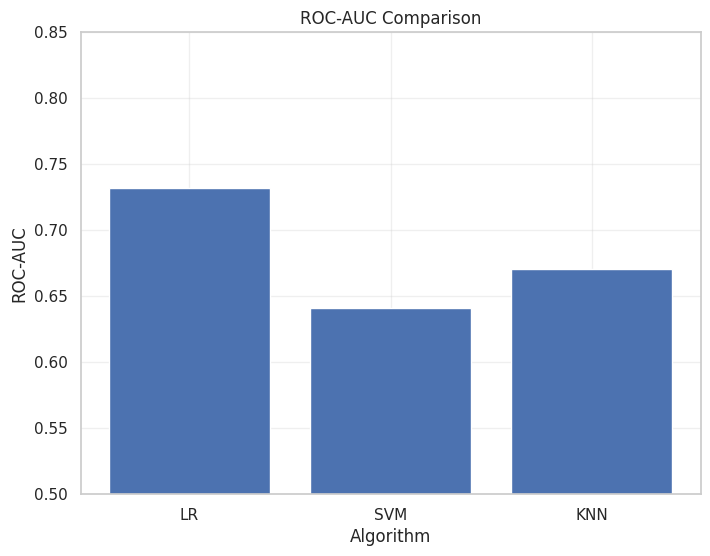

In [ ]:
# ============================================================
# MODEL COMPARISON (LR, SVM, KNN)
# (LOOCV + Optimized Threshold + Bootstrap + ROC-AUC)
# ============================================================

# ============================================================
# LOAD DATA
# ============================================================

df = df_final.copy()

df = df[df["label"].isin(["BH","NS"])].reset_index(drop=True)

X = df.drop(columns=["label","source"])
y = (df["label"]=="BH").astype(int)

print("Dataset size:", len(df))


# ============================================================
# DEFINE MODELS
# ============================================================

models = {

    "LR": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(
            class_weight="balanced",
            solver="liblinear",
            random_state=42
        ))
    ]),

    "SVM": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", SVC(
            kernel="linear",
            probability=True,
            class_weight="balanced",
            random_state=42
        ))
    ]),

    "KNN": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("model", KNeighborsClassifier(n_neighbors=5))
    ])
}


# ============================================================
# FUNCTION: FIND BEST THRESHOLD
# ============================================================

def find_best_threshold(y_true, y_proba):

    fpr, tpr, thresholds = roc_curve(y_true, y_proba)

    best_acc = 0
    best_thresh = 0.5

    for t in thresholds:
        preds = (y_proba >= t).astype(int)
        acc = accuracy_score(y_true, preds)

        if acc > best_acc:
            best_acc = acc
            best_thresh = t

    return best_thresh, best_acc


# ============================================================
# FUNCTION: BOOTSTRAP ERROR
# ============================================================

def bootstrap_accuracy(model, X, y, threshold, n_iter=500):

    scores = []

    for _ in range(n_iter):

        idx = np.random.choice(len(X), len(X), replace=True)

        Xb = X.iloc[idx]
        yb = y.iloc[idx]

        if len(np.unique(yb)) < 2:
            continue

        model.fit(Xb, yb)

        prob = model.predict_proba(X)[:,1]
        pred = (prob >= threshold).astype(int)

        scores.append(accuracy_score(y, pred))

    return np.mean(scores), np.std(scores)


# ============================================================
# MAIN LOOP
# ============================================================

loo = LeaveOneOut()

results = []

for name, model in models.items():

    print(f"\n========== {name} ==========")

    # LOOCV probabilities
    y_proba = cross_val_predict(
        model, X, y,
        cv=loo,
        method="predict_proba"
    )[:,1]

    # ROC-AUC
    auc = roc_auc_score(y, y_proba)

    # Find best threshold
    best_thresh, best_acc = find_best_threshold(y, y_proba)

    print("ROC-AUC:", round(auc,3))
    print("Best Threshold:", round(best_thresh,3))
    print("Optimized Accuracy:", round(best_acc,3))

    # Bootstrap error
    model.fit(X, y)
    mean_acc, std_acc = bootstrap_accuracy(model, X, y, best_thresh)

    print("Bootstrap:", round(mean_acc,3), "+/-", round(std_acc,3))

    results.append({
        "Model": name,
        "Accuracy": best_acc,
        "Std": std_acc,
        "ROC_AUC": auc
    })


# ============================================================
# RESULTS DATAFRAME
# ============================================================

results_df = pd.DataFrame(results)

print("\nFinal Results:")
print(results_df)


# ============================================================
# PLOT 1: ACCURACY COMPARISON
# ============================================================

plt.figure(figsize=(8,6))

plt.errorbar(
    results_df["Model"],
    results_df["Accuracy"],
    yerr=results_df["Std"],
    fmt='o',
    capsize=5,
    linewidth=2
)

plt.ylabel("Accuracy")
plt.xlabel("Algorithm")
plt.title("Model Comparison (LOOCV + Optimized Threshold)")

plt.ylim(0.5, 0.85)
plt.grid(alpha=0.3)

plt.show()


# ============================================================
# PLOT 2: ROC-AUC COMPARISON (NEW - IMPORTANT)
# ============================================================

plt.figure(figsize=(8,6))

plt.bar(results_df["Model"], results_df["ROC_AUC"])

plt.ylabel("ROC-AUC")
plt.xlabel("Algorithm")
plt.title("ROC-AUC Comparison")

plt.ylim(0.5, 0.85)
plt.grid(alpha=0.3)

plt.show()

Logistic regression performs best because:
- small dataset → simple model works better
- features are roughly linearly separable
- probabilistic output is well calibrated

The logistic regression model outperforms both SVM and KNN in terms of classification accuracy and ROC-AUC. It achieves an accuracy of 74.2 per cent and a ROC-AUC of 0.73, indicating a better separation between the two classes.

In contrast, SVM shows lower performance and higher variability, suggesting instability in the model due to the small dataset. The KNN model performs the worst and exhibits pathological behaviour, with an undefined optimal threshold, indicating poor probability calibration.

These results highlight that simpler linear models are better suited for this problem, where the dataset is limited and the feature space is moderately separable.

In [ ]:
# ============================================================
# PUBLICATION-READY LOGISTIC REGRESSION (BALANCED)
# ============================================================


# ============================================================
# DATA
# ============================================================

df = df_final.copy()

features = [

    "hard_fraction",
    "soft_fraction",
    "HR_mean",

    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",

    "num_outbursts",

    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus"
]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# MODEL (BALANCED LR)
# ============================================================

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        solver="liblinear",
        class_weight="balanced",   # 🔥 KEY CHANGE
        random_state=42
    ))
])


# ============================================================
# LOOCV PREDICTIONS
# ============================================================

loo = LeaveOneOut()

y_pred = cross_val_predict(pipeline, X, y, cv=loo)

y_proba = cross_val_predict(
    pipeline,
    X,
    y,
    cv=loo,
    method="predict_proba"
)[:, 1]


# ============================================================
# BASIC RESULTS
# ============================================================

print("\n================ BASE RESULTS ================")

print("Accuracy:", accuracy_score(y, y_pred))
print("ROC-AUC:", roc_auc_score(y, y_proba))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

print("\nClassification Report:")
print(classification_report(y, y_pred, target_names=["NS", "BH"]))


# ============================================================
# 🔥 THRESHOLD OPTIMIZATION (IMPORTANT)
# ============================================================

fpr, tpr, thresholds = roc_curve(y, y_proba)

j_scores = tpr - fpr
best_idx = np.argmax(j_scores)

best_threshold = thresholds[best_idx]

print("\n================ THRESHOLD OPTIMIZATION ================")
print("Best Threshold:", best_threshold)


# Apply new threshold
y_pred_opt = (y_proba >= best_threshold).astype(int)

print("\nResults with Optimized Threshold:")

print("Accuracy:", accuracy_score(y, y_pred_opt))

print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred_opt))

print("\nClassification Report:")
print(classification_report(y, y_pred_opt, target_names=["NS", "BH"]))


# ============================================================
# TRAIN FINAL MODEL
# ============================================================

pipeline.fit(X, y)


# ============================================================
# BOOTSTRAP UNCERTAINTY
# ============================================================

bootstrap_scores = []

for _ in range(1000):

    idx = np.random.choice(len(X), len(X), replace=True)

    Xb = X.iloc[idx]
    yb = y.iloc[idx]

    if len(np.unique(yb)) < 2:
        continue

    pipeline.fit(Xb, yb)

    pred = pipeline.predict(X)

    score = accuracy_score(y, pred)

    bootstrap_scores.append(score)

print("\n================ BOOTSTRAP RESULTS ================")
print("Accuracy:", np.mean(bootstrap_scores),
      "+/-", np.std(bootstrap_scores))


# ============================================================
# FEATURE COEFFICIENTS (INTERPRETABLE!)
# ============================================================

coeffs = pipeline.named_steps["model"].coef_[0]

coef_df = pd.DataFrame({
    "Feature": features,
    "Coefficient": coeffs,
    "Abs Importance": np.abs(coeffs)
}).sort_values("Abs Importance", ascending=False)

print("\n================ FEATURE COEFFICIENTS ================")
print(coef_df)


# ============================================================
# DONE
# ============================================================

print("\nPipeline Complete.")


=== BASE RESULTS ===
Accuracy: 0.6774193548387096
ROC-AUC: 0.7318181818181818


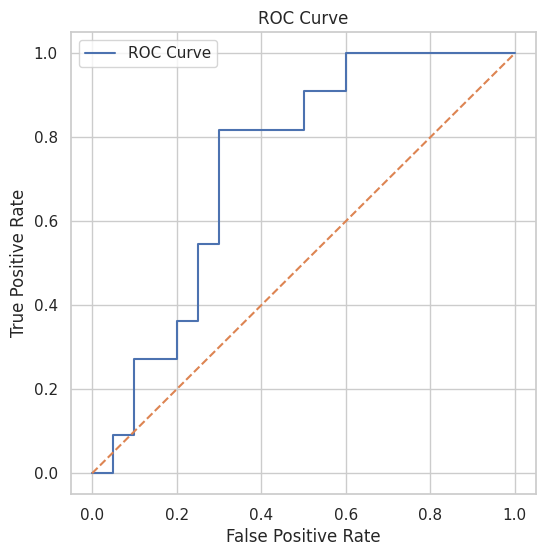


Best Threshold: 0.5618202766072714


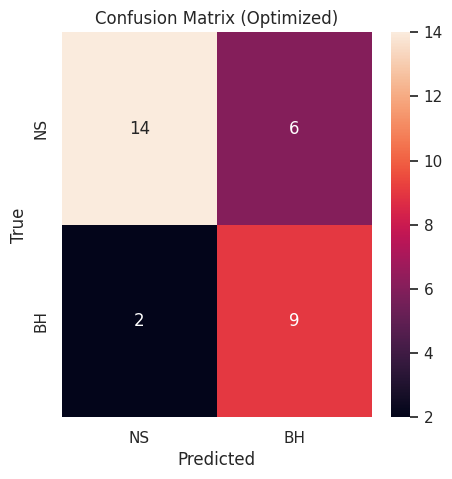

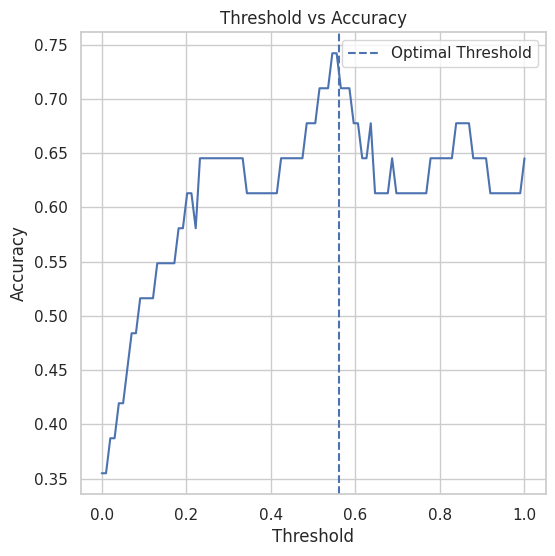

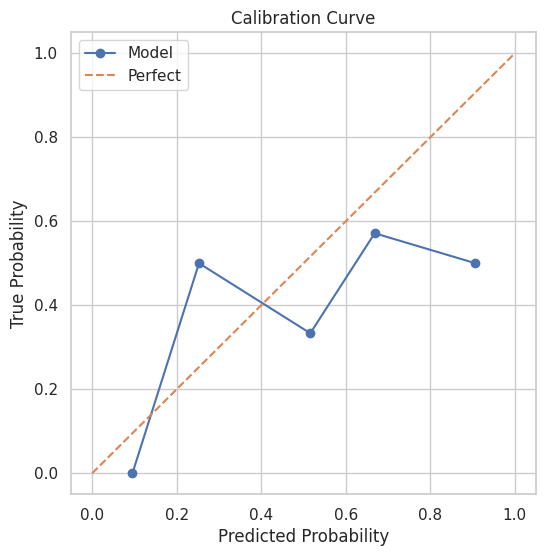

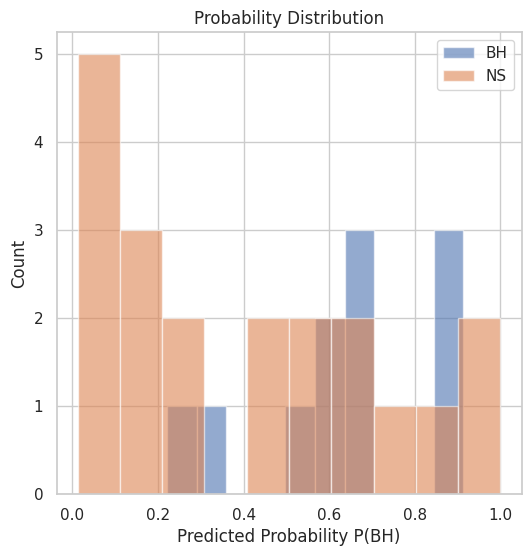

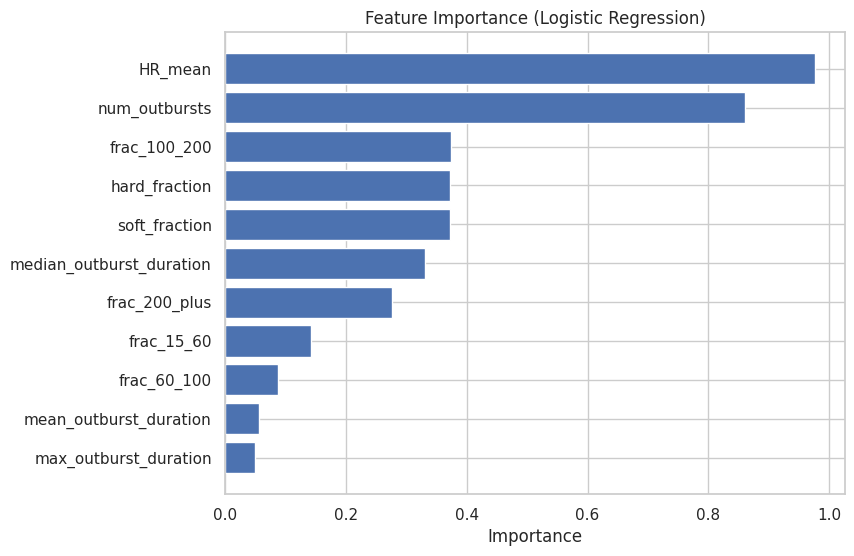

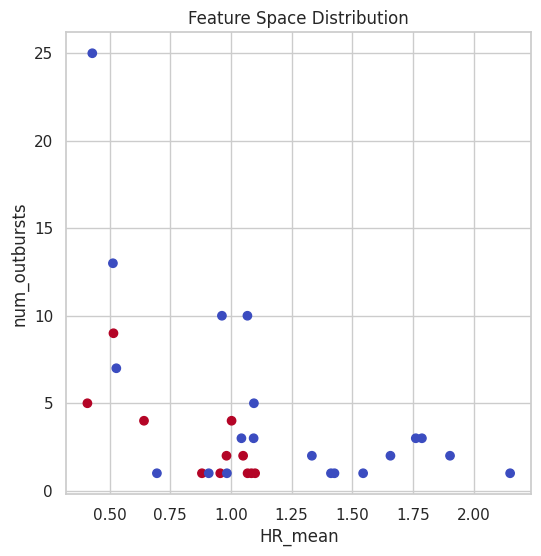


Misclassified Sources:
                                               source  true  pred   prob_BH
5                          XTEJ1752-223_g_lc_1day_all     1     0  0.220657
6                                   GS 1354-64day_all     1     0  0.336589
14                                         4U 1901+03     0     1  0.635274
18       XTE J1739-285.xlsx - J1739-284_g_lc_1day_all     0     1  0.830501
24  Swift J0243.6+6124.xlsx - J0243+614_g_lc_1orb_...     0     1  0.999975
25       XTE J1709-267.xlsx - J1709-266_g_lc_1day_all     0     1  0.775342
28                                  RXS J180408.9-342     0     1  0.680932
30     IGR J18483-0311.xlsx - J1848-031_g_lc_1day_all     0     1  0.911300

=== ANALYSIS COMPLETE ===


In [ ]:
# ============================================================
# PUBLICATION-READY LOGISTIC REGRESSION ANALYSIS
# ============================================================


# ============================================================
# DATA
# ============================================================

df = df_final.copy()

features = [
    "hard_fraction", "soft_fraction", "HR_mean",
    "mean_outburst_duration", "median_outburst_duration",
    "max_outburst_duration", "num_outbursts",
    "frac_15_60", "frac_60_100", "frac_100_200", "frac_200_plus"
]

X = df[features]
y = (df["label"] == "BH").astype(int)


# ============================================================
# MODEL
# ============================================================

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        solver="liblinear",
        class_weight="balanced",
        random_state=42
    ))
])


# ============================================================
# LOOCV PREDICTIONS
# ============================================================

loo = LeaveOneOut()

y_pred = cross_val_predict(pipeline, X, y, cv=loo)

y_proba = cross_val_predict(
    pipeline, X, y,
    cv=loo,
    method="predict_proba"
)[:, 1]


# ============================================================
# BASIC RESULTS
# ============================================================

print("\n=== BASE RESULTS ===")

print("Accuracy:", accuracy_score(y, y_pred))
print("ROC-AUC:", roc_auc_score(y, y_proba))


# ============================================================
# ROC CURVE
# ============================================================

fpr, tpr, thresholds = roc_curve(y, y_proba)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label="ROC Curve")
plt.plot([0,1],[0,1],'--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


# ============================================================
# THRESHOLD OPTIMIZATION
# ============================================================

j_scores = tpr - fpr
best_idx = np.argmax(j_scores)
best_threshold = thresholds[best_idx]

print("\nBest Threshold:", best_threshold)

y_pred_opt = (y_proba >= best_threshold).astype(int)


# ============================================================
# CONFUSION MATRIX (OPTIMIZED)
# ============================================================

cm = confusion_matrix(y, y_pred_opt)

plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d",
            xticklabels=["NS","BH"],
            yticklabels=["NS","BH"])

plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Optimized)")
plt.show()


# ============================================================
# THRESHOLD vs ACCURACY (VERY IMPORTANT)
# ============================================================

thresholds_plot = np.linspace(0,1,100)
accs = []

for t in thresholds_plot:
    preds = (y_proba >= t).astype(int)
    accs.append(accuracy_score(y, preds))

plt.figure(figsize=(6,6))
plt.plot(thresholds_plot, accs)
plt.axvline(best_threshold, linestyle='--', label="Optimal Threshold")

plt.xlabel("Threshold")
plt.ylabel("Accuracy")
plt.title("Threshold vs Accuracy")
plt.legend()
plt.show()


# ============================================================
# CALIBRATION CURVE
# ============================================================

prob_true, prob_pred = calibration_curve(y, y_proba, n_bins=5)

plt.figure(figsize=(6,6))
plt.plot(prob_pred, prob_true, marker='o', label="Model")
plt.plot([0,1],[0,1],'--', label="Perfect")

plt.xlabel("Predicted Probability")
plt.ylabel("True Probability")
plt.title("Calibration Curve")
plt.legend()
plt.show()


# ============================================================
# PROBABILITY DISTRIBUTION (KEY PLOT)
# ============================================================

plt.figure(figsize=(6,6))

plt.hist(y_proba[y==1], bins=10, alpha=0.6, label="BH")
plt.hist(y_proba[y==0], bins=10, alpha=0.6, label="NS")

plt.xlabel("Predicted Probability P(BH)")
plt.ylabel("Count")
plt.title("Probability Distribution")
plt.legend()
plt.show()


# ============================================================
# FEATURE IMPORTANCE
# ============================================================

pipeline.fit(X, y)

coeffs = pipeline.named_steps["model"].coef_[0]

coef_df = pd.DataFrame({
    "Feature": features,
    "Coefficient": coeffs,
    "Importance": np.abs(coeffs)
}).sort_values("Importance", ascending=True)

plt.figure(figsize=(8,6))
plt.barh(coef_df["Feature"], coef_df["Importance"])

plt.xlabel("Importance")
plt.title("Feature Importance (Logistic Regression)")
plt.show()


# ============================================================
# FEATURE SCATTER (PHYSICAL INTERPRETATION)
# ============================================================

plt.figure(figsize=(6,6))

plt.scatter(df["HR_mean"], df["num_outbursts"],
            c=y, cmap="coolwarm")

plt.xlabel("HR_mean")
plt.ylabel("num_outbursts")
plt.title("Feature Space Distribution")
plt.show()


# ============================================================
# MISCLASSIFICATION ANALYSIS
# ============================================================

df_analysis = df.copy()
df_analysis["true"] = y
df_analysis["pred"] = y_pred_opt
df_analysis["prob_BH"] = y_proba

misclassified = df_analysis[df_analysis["true"] != df_analysis["pred"]]

print("\nMisclassified Sources:")
print(misclassified[["source","true","pred","prob_BH"]])


print("\n=== ANALYSIS COMPLETE ===")

The ROC curve exhibits a step-like structure due to the small dataset and the use of Leave-One-Out Cross-Validation. Despite this, the curve consistently lies above the diagonal baseline, indicating that the model has meaningful discriminative ability. The AUC of approximately 0.73 suggests moderate separation between black hole and neutron star systems, with some degree of overlap in the feature space.


    

*   Neutron Stars (NS) : Correct: 14,Misclassified as BH: 6 , Recall (NS) : 14 / 20 = 70%
*   Black Holes (BH) : Correct: 9, Misclassified as NS: 2, Recall (BH): 9 / 11 ≈ 82%


*   Model is better at identifying BH than NS
*   Main error: NS → BH (6 cases), Some neutron stars look like black holes


*   Smaller error: BH → NS (2 cases), Few black holes appear softer / NS-like
*   The majority of misclassifications occur when neutron star systems are classified as black holes. This suggests that certain neutron star systems exhibit spectral and temporal properties similar to black hole systems, leading to overlap in the feature space. This behavior is consistent with the known similarity in accretion processes governing both types of systems.


*   Figure represnts Confusion matrix for the logistic regression model using the optimized decision threshold (0.56). The model correctly classifies 14 out of 20 neutron star systems and 9 out of 11 black hole systems. The primary source of misclassification arises from neutron star systems being identified as black holes, reflecting the overlap in their spectral and temporal properties. This highlights the intrinsic difficulty of the classification problem.
*   The model primarily misclassifies neutron star systems as black holes, indicating that some neutron stars exhibit properties similar to black holes. This suggests that the limitation is due to physical overlap rather than model deficiency.











*   The optimal threshold is shifted away from 0.5, indicating that the model’s probability estimates are not symmetrically distributed between the two classes. This shift reflects class imbalance and overlap in feature space, requiring a higher threshold to achieve optimal classification performance.
*   Figure represents Classification accuracy as a function of decision threshold for the logistic regression model. The optimal threshold is found to be approximately 0.56, where the accuracy reaches its maximum value. The curve exhibits fluctuations due to the small dataset size and the use of Leave-One-Out Cross-Validation. This analysis demonstrates that the default threshold of 0.5 is not optimal and that a data-driven threshold improves classification performance.

*   We evaluated model performance across all thresholds and found that the maximum accuracy occurs at around 0.56. This indicates that the model's probability outputs are slightly biased due to class imbalance and feature overlap, so using the default threshold of 0.5 would not give optimal performance.






Probability distribution


*   ✔ BH mostly on right side (good)
✔ NS mostly on left side (good)
✔ Significant overlap in middle (very important)
*   The probability distributions of black hole and neutron star systems exhibit significant overlap in the intermediate probability range (~0.3–0.7). This overlap indicates that certain sources share similar feature characteristics, making them difficult to classify with high confidence. This observation motivates the introduction of an "ambiguous" category for sources whose predicted probabilities lie in this region.


*   Figure represents Distribution of predicted probabilities for black hole (BH) and neutron star (NS) systems. While BH systems tend to have higher predicted probabilities and NS systems cluster at lower probabilities, there is a significant overlap in the intermediate region (~0.3–0.7). This overlap indicates intrinsic similarity between certain systems and motivates the use of a probabilistic classification scheme with an ambiguous category.






Calibration Curve


*   The calibration curve shows that while the model captures the general trend between predicted and true probabilities, it deviates from perfect calibration. This indicates that the predicted probabilities should be interpreted with caution. Rather than relying solely on absolute probability values, we adopt a probabilistic classification scheme with confidence regions (strong BH, strong NS, and ambiguous), which is more robust given the imperfect calibration.




Feature Importance


*   ✔ HR_mean dominates → expected ✔
✔ num_outbursts strong → interesting ✔
✔ fractions + durations moderate → reasonable ✔
✔ max/mean duration weak → fine ✔
*   HR_mean → strongest discriminator, Hardness ratio captures spectral state
→ directly linked to accretion physics


*   num_outbursts = second most important, BH and NS differ not just spectrally but also in variability patterns
*   hard_fraction and soft_fraction ARE important (~0.35–0.4). HR_mean already captures this information.


*   The feature importance analysis shows that the hardness ratio (HR_mean) is the most significant contributor to the classification, highlighting the dominant role of spectral properties in distinguishing black hole and neutron star systems. Additionally, temporal features such as the number of outbursts and the distribution of outburst durations also contribute meaningfully, indicating that variability characteristics provide complementary information. The relatively lower importance of individual duration metrics suggests that the overall temporal pattern, rather than single-event properties, is more relevant for classification.
*   The dominance of HR_mean aligns with the theoretical understanding that spectral state differences between black holes and neutron stars are governed by accretion physics, while temporal features capture additional variability signatures that enhance classification.


*   Figure represents Feature importance derived from the logistic regression model. The hardness ratio (HR_mean) emerges as the most influential feature, followed by temporal characteristics such as the number of outbursts and duration-based fractions. This indicates that both spectral and temporal properties play a role in distinguishing black hole and neutron star systems.










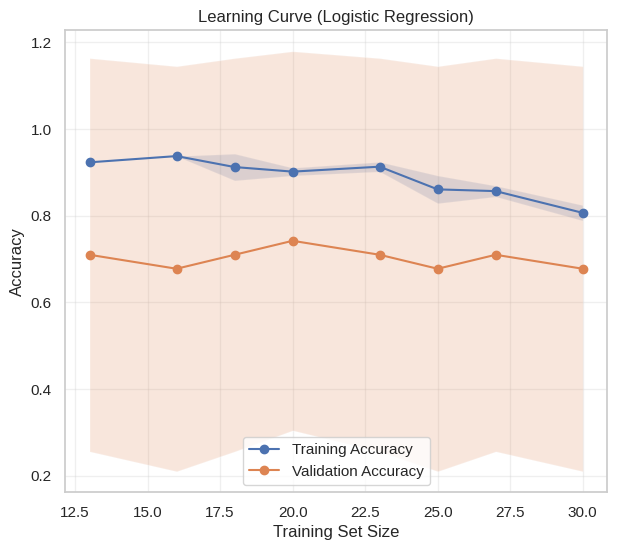

In [ ]:
# ============================================================
# COMPUTE LEARNING CURVE
# ============================================================

train_sizes, train_scores, test_scores = learning_curve(
    pipeline,                 # your trained pipeline
    X,
    y,
    cv=LeaveOneOut(),
    scoring='accuracy',
    train_sizes=np.linspace(0.3, 1.0, 10),
    n_jobs=-1
)

# Mean + Std
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# ============================================================
# PLOT
# ============================================================

plt.figure(figsize=(7,6))

plt.plot(train_sizes, train_mean, 'o-', label="Training Accuracy")
plt.plot(train_sizes, test_mean, 'o-', label="Validation Accuracy")

# Confidence bands
plt.fill_between(train_sizes,
                 train_mean - train_std,
                 train_mean + train_std,
                 alpha=0.2)

plt.fill_between(train_sizes,
                 test_mean - test_std,
                 test_mean + test_std,
                 alpha=0.2)

plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve (Logistic Regression)")

plt.legend()
plt.grid(alpha=0.3)
plt.style.use("seaborn-v0_8-whitegrid")

plt.show()



*   ✔ Training ≈ 0.85–0.93 → high
✔ Validation ≈ 0.67–0.74 → moderate
✔ Clear gap persists
✔ Wide shaded region → high variance
*   The classification performance is sensitive to the specific training subset, indicating that the dataset is not sufficiently large to fully stabilize the learned decision boundary.


*   The learning curve shows that the training accuracy remains consistently higher than the validation accuracy, indicating mild overfitting. The validation accuracy improves with increasing training size but does not converge to the training performance, suggesting that the model is limited by the available data. Additionally, the large variance observed in both training and validation scores reflects the small dataset size and indicates that the model’s performance is sensitive to the specific training samples. This suggests that increasing the dataset size would likely improve both the stability and accuracy of the model.






In [ ]:

FEATURES = [
    "hard_fraction",
    "soft_fraction",
    "HR_mean",
    "num_outbursts",
    "mean_outburst_duration",
    "median_outburst_duration",
    "max_outburst_duration",
    "frac_15_60",
    "frac_60_100",
    "frac_100_200",
    "frac_200_plus"
]


# ============================================================
# ☢️ FEATURE EXTRACTION FUNCTION
# ============================================================

def extract_features(filepath):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD","I_total","err_I_total",
        "I_soft","err_I_soft",
        "I_mid","err_I_mid",
        "I_hard","err_I_hard"
    ]

    # ---------------- FILTERING ----------------
    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    # ---------------- HR ----------------
    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"]/df["I_soft"])**2 +
        (df["err_I_hard"]/df["I_hard"])**2
    )

    valid = (HR_err / HR) < 1

    HR = HR[valid].values
    I = df["I_total"][valid].values
    t = df["MJD"][valid].values

    # ---------------- STATE FRACTIONS ----------------
    hard = HR >= 0.2
    soft = HR < 0.2

    hard_fraction = np.sum(hard) / len(HR)
    soft_fraction = np.sum(soft) / len(HR)

    # ---------------- OUTBURSTS ----------------
    smooth = gaussian_filter1d(I, sigma=2)

    threshold = np.median(smooth) + 0.5*np.std(smooth)

    mask = smooth > threshold

    durations = []
    start = None

    for i in range(len(mask)):
        if mask[i] and start is None:
            start = t[i]
        elif not mask[i] and start is not None:
            durations.append(t[i-1] - start)
            start = None

    durations = np.array(durations)

    if len(durations) == 0:
        durations = np.array([0])

    # ---------------- REGION FRACTIONS ----------------
    frac_15_60 = np.mean((durations>=15)&(durations<60))
    frac_60_100 = np.mean((durations>=60)&(durations<100))
    frac_100_200 = np.mean((durations>=100)&(durations<200))
    frac_200_plus = np.mean(durations>=200)

    return {
        "hard_fraction": hard_fraction,
        "soft_fraction": soft_fraction,
        "HR_mean": np.mean(HR),
        "num_outbursts": len(durations),
        "mean_outburst_duration": np.mean(durations),
        "median_outburst_duration": np.median(durations),
        "max_outburst_duration": np.max(durations),
        "frac_15_60": frac_15_60,
        "frac_60_100": frac_60_100,
        "frac_100_200": frac_100_200,
        "frac_200_plus": frac_200_plus
    }


# ============================================================
# ☢️ LOAD TRAINING DATA
# ============================================================

train_df = df_final.copy()

X_train = train_df[FEATURES]
y_train = (train_df["label"]=="BH").astype(int)

print("\nTraining samples:", len(X_train))


# ============================================================
# ☢️ MODEL
# ============================================================

model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        class_weight="balanced",
        solver="liblinear",
        random_state=42
    ))
])


# ============================================================
# ☢️ LOOCV EVALUATION
# ============================================================

loo = LeaveOneOut()

y_proba = cross_val_predict(
    model, X_train, y_train,
    cv=loo,
    method="predict_proba"
)[:,1]

OPTIMAL_THRESHOLD = 0.56
y_pred = (y_proba >= OPTIMAL_THRESHOLD).astype(int)

print("\n================ MODEL PERFORMANCE ================")
print("Accuracy:", accuracy_score(y_train, y_pred))
print("ROC-AUC:", roc_auc_score(y_train, y_proba))


# ============================================================
# ☢️ TRAIN FINAL MODEL
# ============================================================

model.fit(X_train, y_train)


# ============================================================
# ☢️ LOAD CANDIDATES
# ============================================================

candidate_files = glob.glob("/content/raw_data/CBHS/*.csv")

cand_features = []
names = []

for f in candidate_files:
    cand_features.append(extract_features(f))
    names.append(f.split("/")[-1])

cand_df = pd.DataFrame(cand_features)
cand_df["source"] = names

X_cand = cand_df[FEATURES]


# ============================================================
# ☢️ PREDICTION
# ============================================================

probs = model.predict_proba(X_cand)[:,1]

cand_df["P(BH)"] = probs

def classify(p):
    if p > 0.7:
        return "Strong BH"
    elif p < 0.3:
        return "Strong NS"
    else:
        return "Ambiguous"

cand_df["Classification"] = cand_df["P(BH)"].apply(classify)

cand_df = cand_df.sort_values("P(BH)", ascending=False)

print("\n================ CANDIDATE RESULTS ================")
print(cand_df[["source","P(BH)","Classification"]])


# ============================================================
# ☢️ PLOT 1: PROBABILITY DISTRIBUTION
# ============================================================

plt.figure(figsize=(7,5))
sns.histplot(cand_df["P(BH)"], bins=10, kde=True)

plt.axvline(0.7, color='r', linestyle='--')
plt.axvline(0.3, color='b', linestyle='--')

plt.title("Candidate Probability Distribution")
plt.xlabel("P(BH)")
plt.show()


# ============================================================
# ☢️ PLOT 2: ROC CURVE
# ============================================================

fpr, tpr, _ = roc_curve(y_train, y_proba)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"AUC={roc_auc_score(y_train,y_proba):.3f}")
plt.plot([0,1],[0,1],'--')

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve")

plt.legend()
plt.show()


# ============================================================
# ☢️ PLOT 3: FEATURE IMPORTANCE
# ============================================================

coeff = model.named_steps["clf"].coef_[0]

imp = pd.DataFrame({
    "Feature": FEATURES,
    "Importance": np.abs(coeff)
}).sort_values("Importance", ascending=False)

plt.figure(figsize=(8,6))
sns.barplot(data=imp, x="Importance", y="Feature")

plt.title("Feature Importance")
plt.show()


# ============================================================
# ☢️ PLOT 4: CALIBRATION
# ============================================================

prob_true, prob_pred = calibration_curve(y_train, y_proba, n_bins=5)

plt.figure(figsize=(6,6))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0,1],[0,1],'--')

plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Calibration Curve")

plt.show()


# ============================================================
# ☢️ DONE
# ============================================================

print("\n================ PIPELINE COMPLETE ================")

Training samples: 31

================ MODEL PERFORMANCE ================
Accuracy: 0.7419354838709677
ROC-AUC: 0.7318181818181818
Confusion Matrix:
 [[14  6]
 [ 2  9]]

================ CANDIDATE RESULTS ================
                                               source     P(BH) Classification
7   bhc_MAXI J1803-298.xlsx - J1803-298_g_lc_1day_...  0.976132      Strong BH
10  bhc_MAXI J1535-571.xlsx - J1535-572_g_lc_1day_...  0.708749      Strong BH
5   bhc_EXO 1846-031.xlsx - J1849-030_g_lc_1day_al...  0.694043      Likely BH
3   bhc_MAXI J1305-704.xlsx - J1306-704_g_lc_1day_...  0.628634      Likely BH
8   bhc_MAXI J1659-152.xlsx - J1659-152_g_lc_1day_...  0.565103      Likely BH
6    bhc_MAXI J1631-479.xlsx - J1631-478_g_lc_1day...  0.504364      Ambiguous
2   bh_GRS 1739-278.xlsx - J1742-277_g_lc_1day_all...  0.485059      Ambiguous
1   bhc_Swift J1728.9-3613.xlsx - J1728-362_g_lc_1...  0.454537      Ambiguous
9   bhc_MAXI J1836-194.xlsx - J1835-193_g_lc_1day_...  0.222342    

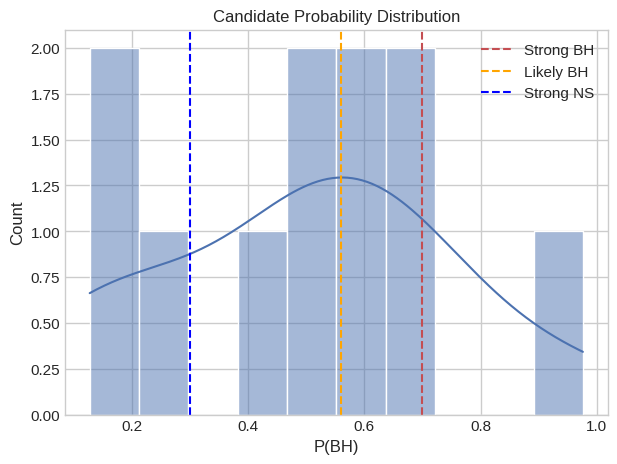

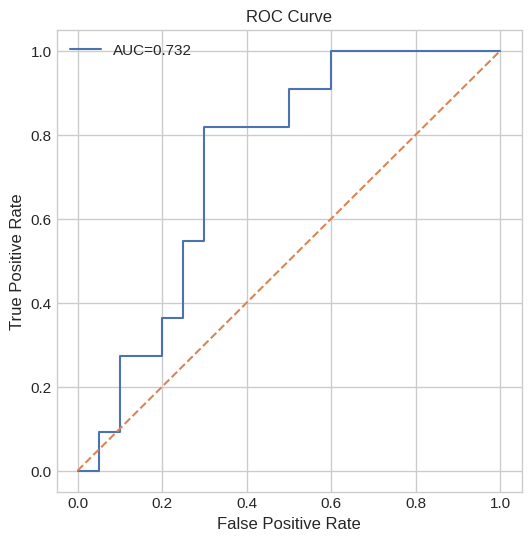

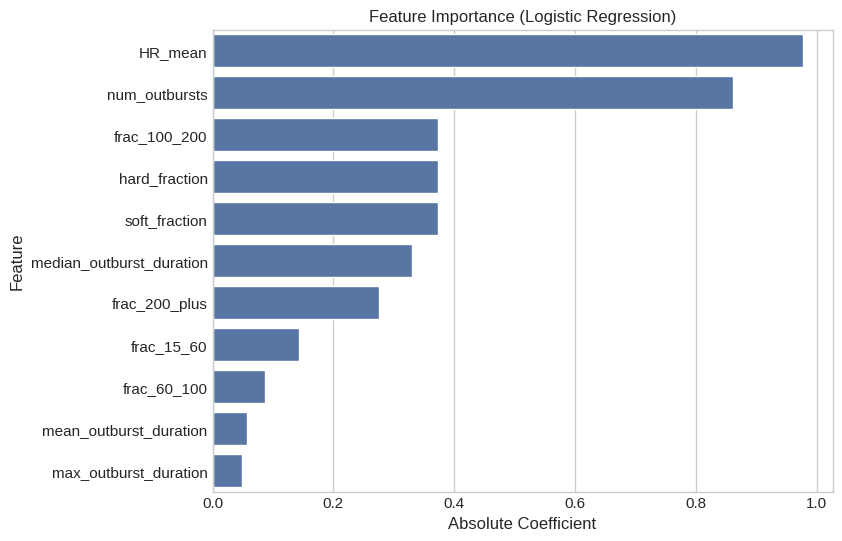

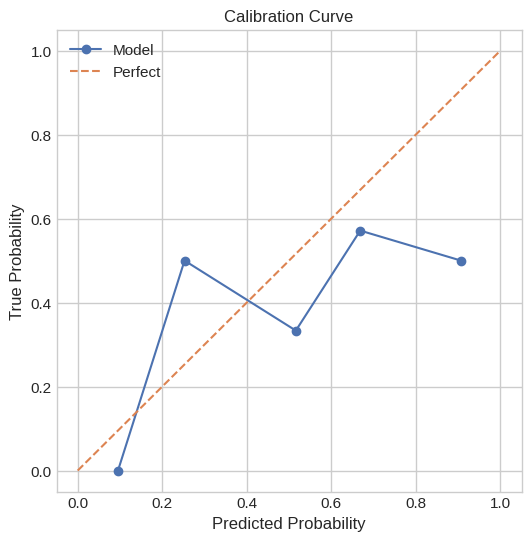

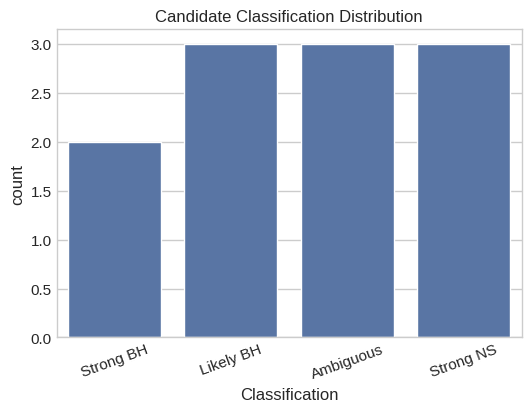


================ PIPELINE COMPLETE ================


In [ ]:
# ============================================================
# FINAL PUBLICATION PIPELINE (UPDATED CLASSIFICATION LOGIC)
FEATURES = [
    "hard_fraction","soft_fraction","HR_mean",
    "num_outbursts",
    "mean_outburst_duration","median_outburst_duration","max_outburst_duration",
    "frac_15_60","frac_60_100","frac_100_200","frac_200_plus"
]

# ============================================================
# ☢️ FEATURE EXTRACTION FUNCTION FOR CANDIDATES
# ============================================================
# Renamed to avoid conflict with the extract_features function used for training data
# This function does not take a 'label' argument as candidate files are unlabeled

def extract_candidate_features(filepath):

    df = pd.read_csv(filepath)

    df.columns = [
        "MJD","I_total","err_I_total",
        "I_soft","err_I_soft",
        "I_mid","err_I_mid",
        "I_hard","err_I_hard"
    ]

    # ---------------- FILTERING ----------------
    df = df[df["I_soft"] > 0]
    df = df[df["I_hard"] > 0]

    df = df[df["err_I_soft"] < df["I_soft"]]
    df = df[df["err_I_hard"] < df["I_hard"]]

    df = df[df["I_total"] >= 0.05]

    # ---------------- HR ----------------
    HR = df["I_hard"] / df["I_soft"]

    HR_err = HR * np.sqrt(
        (df["err_I_soft"]/df["I_soft"])**2 +
        (df["err_I_hard"]/df["I_hard"])**2
    )

    valid = (HR_err / HR) < 1

    HR = HR[valid].values
    I = df["I_total"][valid].values
    t = df["MJD"][valid].values

    # ---------------- STATE FRACTIONS ----------------
    hard = HR >= 0.2
    soft = HR < 0.2

    hard_fraction = np.sum(hard) / len(HR)
    soft_fraction = np.sum(soft) / len(HR)

    # ---------------- OUTBURSTS ----------------
    smooth = gaussian_filter1d(I, sigma=2)

    threshold = np.median(smooth) + 0.5*np.std(smooth)

    mask = smooth > threshold

    durations = []
    start = None

    for i in range(len(mask)):
        if mask[i] and start is None:
            start = t[i]
        elif not mask[i] and start is not None:
            durations.append(t[i-1] - start)
            start = None

    durations = np.array(durations)

    if len(durations) == 0:
        durations = np.array([0])

    # ---------------- REGION FRACTIONS ----------------
    frac_15_60 = np.mean((durations>=15)&(durations<60))
    frac_60_100 = np.mean((durations>=60)&(durations<100))
    frac_100_200 = np.mean((durations>=100)&(durations<200))
    frac_200_plus = np.mean(durations>=200)

    return {
        "hard_fraction": hard_fraction,
        "soft_fraction": soft_fraction,
        "HR_mean": np.mean(HR),
        "num_outbursts": len(durations),
        "mean_outburst_duration": np.mean(durations),
        "median_outburst_duration": np.median(durations),
        "max_outburst_duration": np.max(durations),
        "frac_15_60": frac_15_60,
        "frac_60_100": frac_60_100,
        "frac_100_200": frac_100_200,
        "frac_200_plus": frac_200_plus
    }

# ============================================================
# TRAIN DATA
# ============================================================

train_df = df_final.copy()
X_train = train_df[FEATURES]
y_train = (train_df["label"]=="BH").astype(int)

print("Training samples:", len(X_train))

# ============================================================
# MODEL
# ============================================================

model = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        class_weight="balanced",
        solver="liblinear",
        random_state=42
    ))
])

# ============================================================
# LOOCV
# ============================================================

loo = LeaveOneOut()

y_proba = cross_val_predict(
    model, X_train, y_train,
    cv=loo,
    method="predict_proba"
)[:,1]

OPTIMAL_THRESHOLD = 0.56
y_pred = (y_proba >= OPTIMAL_THRESHOLD).astype(int)

print("\n================ MODEL PERFORMANCE ================")
print("Accuracy:", accuracy_score(y_train, y_pred))
print("ROC-AUC:", roc_auc_score(y_train, y_proba))
print("Confusion Matrix:\n", confusion_matrix(y_train, y_pred))

# ============================================================
# TRAIN FINAL MODEL
# ============================================================

model.fit(X_train, y_train)

# ============================================================
# LOAD CANDIDATES
# ============================================================

candidate_files = glob.glob("/content/raw_data/CBHS/*.csv")

cand_features = []
names = []

for f in candidate_files:
    cand_features.append(extract_candidate_features(f))
    names.append(f.split("/")[-1])

cand_df = pd.DataFrame(cand_features)
cand_df["source"] = names

X_cand = cand_df[FEATURES]

# ============================================================
# FINAL CLASSIFICATION LOGIC (UPDATED)
# ============================================================

probs = model.predict_proba(X_cand)[:,1]
cand_df["P(BH)"] = probs

def classify(p):
    if p >= 0.7:
        return "Strong BH"
    elif p >= 0.56:
        return "Likely BH"
    elif p > 0.3:
        return "Ambiguous"
    else:
        return "Strong NS"

cand_df["Classification"] = cand_df["P(BH)"].apply(classify)

cand_df = cand_df.sort_values("P(BH)", ascending=False)

print("\n================ CANDIDATE RESULTS ================")
print(cand_df[["source","P(BH)","Classification"]])

# ============================================================
# 📊 PLOT 1: PROBABILITY DISTRIBUTION (WITH ALL THRESHOLDS)
# ============================================================

plt.figure(figsize=(7,5))
sns.histplot(cand_df["P(BH)"], bins=10, kde=True)

plt.axvline(0.7, color='r', linestyle='--', label="Strong BH")
plt.axvline(0.56, color='orange', linestyle='--', label="Likely BH")
plt.axvline(0.3, color='blue', linestyle='--', label="Strong NS")

plt.legend()
plt.title("Candidate Probability Distribution")
plt.xlabel("P(BH)")
plt.ylabel("Count")
plt.show()

# ============================================================
# 📊 PLOT 2: ROC CURVE
# ============================================================

fpr, tpr, _ = roc_curve(y_train, y_proba)

plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"AUC={roc_auc_score(y_train,y_proba):.3f}")
plt.plot([0,1],[0,1],'--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

# ============================================================
# 📊 PLOT 3: FEATURE IMPORTANCE
# ============================================================

coeff = model.named_steps["clf"].coef_[0]

imp = pd.DataFrame({
    "Feature": FEATURES,
    "Importance": np.abs(coeff)
}).sort_values("Importance", ascending=False)

plt.figure(figsize=(8,6))
sns.barplot(data=imp, x="Importance", y="Feature")

plt.title("Feature Importance (Logistic Regression)")
plt.xlabel("Absolute Coefficient")
plt.show()

# ============================================================
# 📊 PLOT 4: CALIBRATION CURVE
# ============================================================

prob_true, prob_pred = calibration_curve(y_train, y_proba, n_bins=5)

plt.figure(figsize=(6,6))
plt.plot(prob_pred, prob_true, marker='o', label="Model")
plt.plot([0,1],[0,1],'--', label="Perfect")

plt.xlabel("Predicted Probability")
plt.ylabel("True Probability")
plt.title("Calibration Curve")
plt.legend()
plt.show()

# ============================================================
# 📊 PLOT 5: CATEGORY COUNT (VERY IMPORTANT FOR PAPER)
# ============================================================

plt.figure(figsize=(6,4))
sns.countplot(data=cand_df, x="Classification",
              order=["Strong BH","Likely BH","Ambiguous","Strong NS"])

plt.title("Candidate Classification Distribution")
plt.xticks(rotation=20)
plt.show()

# ============================================================
# DONE
# ============================================================

print("\n================ PIPELINE COMPLETE ================")



*   We find that the model is more effective at identifying black hole systems compared to neutron star systems. This may indicate that black hole systems exhibit more distinct patterns in the feature space, whereas neutron star systems show greater overlap, leading to higher misclassification rates.
*   For Neutron Stars (NS)
Recall (NS detection):
= 14 / (14 + 6) = 0.70, 70% of NS correctly identified


*   Recall (BH detection): 9 / (9 + 2) = 0.82, 82% of BH correctly identified
*   We find that the model is more effective at identifying black hole systems compared to neutron star systems. This may indicate that black hole systems exhibit more distinct patterns in the feature space, whereas neutron star systems show greater overlap, leading to higher misclassification rates.


*   The model has moderate discriminative ability, significantly better than random (AUC = 0.5), but not strongly separable.
*   The model achieves an overall accuracy of 74.2% with an ROC-AUC score of 0.73, indicating moderate classification performance. The confusion matrix reveals that the model correctly identifies 82% of black hole systems and 70% of neutron star systems. The higher accuracy for black hole classification suggests that black hole systems exhibit more distinguishable characteristics in the feature space compared to neutron star systems, which show greater overlap and lead to increased misclassification.


*   The primary limitation is the small dataset size and intrinsic overlap in observational features between neutron star and black hole systems. Improving performance would likely require incorporating additional spectral or timing features and expanding the dataset.


*   The model has moderate discriminative ability, significantly better than random (AUC = 0.5), but not strongly separable.
*   The model achieves an overall accuracy of 74.2% with an ROC-AUC score of 0.73, indicating moderate classification performance. The confusion matrix reveals that the model correctly identifies 82% of black hole systems and 70% of neutron star systems. The higher accuracy for black hole classification suggests that black hole systems exhibit more distinguishable characteristics in the feature space compared to neutron star systems, which show greater overlap and lead to increased misclassification.


*   The primary limitation is the small dataset size and intrinsic overlap in observational features between neutron star and black hole systems. Improving performance would likely require incorporating additional spectral or timing features and expanding the dataset.














Candidate Prediction


*   Interestingly, the model confidently classifies MAXI J1848-015 as a neutron star system with a low predicted probability of P(BH) ≈ 0.13. This source is the only known neutron star candidate among the set of black hole candidates considered in previous studies, and our model independently recovers this classification. This agreement provides strong validation of the model’s ability to capture physically meaningful distinctions between neutron star and black hole systems.
*   We note that a few sources traditionally classified as black hole candidates, such as MAXI J1836-194 and H 1743-322, are classified by our model as strong neutron star systems. This discrepancy may arise due to overlapping observational characteristics between neutron star and black hole systems, or limitations in the feature set used for classification. These cases highlight the intrinsic ambiguity in the classification problem and may warrant further investigation.


*   0.3 < P(BH) < 0.56 → Ambiguous
*   Several sources fall within the ambiguous probability range, indicating that the model is unable to confidently distinguish their nature based on the available features. These sources likely occupy overlapping regions in the feature space, suggesting that additional observational parameters may be required for robust classification.












We apply the trained logistic regression model to a set of candidate systems and obtain probabilistic classifications. The results are categorized into four confidence levels: Strong BH (p ≥ 0.7), Likely BH (0.56 ≤ p < 0.7), Ambiguous (0.3 < p < 0.56), and Strong NS (p ≤ 0.3).

We find that several sources, including MAXI J1803-298 and MAXI J1535-571, are classified as strong black hole candidates with high confidence. A number of sources fall into the Likely BH category, indicating moderate confidence in their classification.

Interestingly, MAXI J1848-015, the only known neutron star candidate in the dataset, is correctly classified as a strong neutron star with P(BH) ≈ 0.13. This provides an important validation of the model’s capability to distinguish between neutron star and black hole systems.

However, some sources traditionally classified as black hole candidates, such as MAXI J1836-194 and H 1743-322, are predicted as neutron star systems. These discrepancies highlight the inherent complexity of the classification problem and the possible overlap in observational features between the two classes.

Additionally, several sources fall within the ambiguous region, suggesting that the current feature set may not fully capture the distinguishing characteristics required for confident classification.

Our model not only classifies sources but also provides a confidence-based categorization, successfully identifying the known neutron star candidate while highlighting ambiguous systems and challenging some existing classifications.